In [2]:
# Core Python Utilities
import itertools
import warnings

# Data Handling
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

# Sklearn: Models, Evaluation, and Preprocessing
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, VotingRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import KFold, train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.feature_selection import f_regression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# PyTorch: Deep Learning Framework
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, random_split

# Ignore warnings
warnings.filterwarnings("ignore")

# Enable inline plotting (for Jupyter notebooks only)
%matplotlib inline


In [3]:

# Load datasets
data1 = pd.read_csv('/Users/janat/Desktop/ppimic50pred/dataset/ALL_PPIS_ic50_results.csv')
data2 = pd.read_csv('/Users/janat/Desktop/ppimic50pred/dataset/ChEMBL_PPIs_new_ic50_results.csv', sep="\t")

# Remove overlapping ChEMBL IDs
common_ids = set(data1['chembl_id']).intersection(data2['chembl_id'])
data1_unique = data1[~data1['chembl_id'].isin(common_ids)]
data2_unique = data2[~data2['chembl_id'].isin(common_ids)]

# Combine and clean
combined_data = pd.concat([data1_unique, data2_unique], ignore_index=True)
combined_data = combined_data[
    combined_data['ic50_value'].notna() &
    (combined_data['ic50_value'].astype(str).str.strip() != "")
]

# Convert to numeric and remove invalid IC50s
combined_data['ic50_value'] = pd.to_numeric(combined_data['ic50_value'], errors='coerce')
combined_data = combined_data[combined_data['ic50_value'] > 0]

# Compute log(IC50)
combined_data['log_ic50'] = np.log10(combined_data['ic50_value'])

combined_data


,chembl_id,ic50_value,units,pchembl_value,target_chembl_id,target_name,assay_chembl_id,activity_comment,log_ic50
0,CHEMBL7976,1410.0,nM,5.85,CHEMBL2039,Monoamine oxidase B,CHEMBL1003729,NaN,3.149219
1,CHEMBL1094278,300.0,nM,6.52,CHEMBL614361,T47D,CHEMBL1109973,NaN,2.477121
2,CHEMBL1097571,230.0,nM,6.64,CHEMBL614361,T47D,CHEMBL1109973,NaN,2.361728
3,CHEMBL121516,30.0,nM,7.52,CHEMBL387,MCF7,CHEMBL1109970,NaN,1.477121
4,CHEMBL1236726,190.0,nM,6.72,CHEMBL5023,p53-binding protein Mdm-2,CHEMBL3391053,NaN,2.278754
...,...,...,...,...,...,...,...,...,...
3449,CHEMBL1200969,4.0,nM,8.40,CHEMBL1787,Steroid 5-alpha-reductase 1,CHEMBL4371136,NaN,0.602060
3450,CHEMBL2311933,100.0,nM,7.00,CHEMBL3885518,Aryl hydrocarbon receptor nuclear translocator...,CHEMBL2319602,NaN,2.000000
3451,CHEMBL2311967,90.0,nM,7.05,CHEMBL3885518,Aryl hydrocarbon receptor nuclear translocator...,CHEMBL2319602,NaN,1.954243
3452,CHEMBL3235901,1400.0,nM,5.85,CHEMBL3414417,Histone acetyltransferase RTT109,CHEMBL3419139,NaN,3.146128


## RDKit Descriptor

In [7]:
# Load RDKit descriptor data
rdkit_data = pd.read_csv('/Users/janat/Desktop/ppimic50pred/dataset/chembl_rdkit_descriptors.csv')

# Merge with IC50 data
merged_df_rdkit = pd.merge(
    rdkit_data,
    combined_data[['chembl_id', 'ic50_value', 'log_ic50', 'target_chembl_id', 'target_name']],
    on='chembl_id',
    how='inner'
)

merged_df_rdkit


,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,chembl_id,smiles,ic50_value,log_ic50,target_chembl_id,target_name
0,11.731188,11.731188,0.031901,0.031901,0.556230,10.500000,208.260,196.164,208.088815,78,...,0,0,0,0,CHEMBL7976,O=C(/C=C/c1ccccc1)c1ccccc1,1410.0,3.149219,CHEMBL2039,Monoamine oxidase B
1,8.541096,8.541096,0.220764,0.220764,0.437912,9.916667,225.404,210.284,225.031577,72,...,0,0,0,0,CHEMBL1094278,CCN(CC)C(=S)SSCCO,300.0,2.477121,CHEMBL614361,T47D
2,5.342645,5.342645,1.026516,1.026516,0.358832,10.333333,265.513,242.329,265.099263,90,...,0,0,3,0,CHEMBL1097571,CCCCCCSSC(=S)N(CC)CC,230.0,2.361728,CHEMBL614361,T47D
3,5.483680,5.483680,1.013018,1.013018,0.489495,20.888889,320.574,300.414,320.050933,102,...,0,0,0,0,CHEMBL121516,S=C(SSC(=S)N1CCCCC1)N1CCCCC1,30.0,1.477121,CHEMBL387,MCF7
4,14.436125,14.436125,0.004844,-0.004844,0.178353,15.250000,629.636,591.332,628.248415,228,...,0,0,0,0,CHEMBL1236726,CN(C)CCCN(C)[C@H]1CCN(C(=O)c2[nH]c3cc(Cl)ccc3c...,190.0,2.278754,CHEMBL5023,p53-binding protein Mdm-2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3446,13.565688,13.565688,0.053522,-4.912768,0.426542,37.297297,528.537,498.297,528.221148,202,...,0,0,0,0,CHEMBL1200969,C[C@]12C=CC(=O)N[C@@H]1CC[C@@H]1[C@@H]2CC[C@]2...,4.0,0.602060,CHEMBL1787,Steroid 5-alpha-reductase 1
3447,13.297583,13.297583,0.006944,-0.615307,0.585759,10.761905,308.656,302.608,308.011246,106,...,0,0,0,0,CHEMBL2311933,O=[N+]([O-])c1c(Nc2cc(F)cc(Cl)c2)ccc2nonc12,100.0,2.000000,CHEMBL3885518,Aryl hydrocarbon receptor nuclear translocator...
3448,12.890514,12.890514,0.022566,-4.652088,0.545055,11.666667,358.663,352.615,358.008052,124,...,0,0,0,0,CHEMBL2311967,O=[N+]([O-])c1c(Nc2ccc(Cl)c(C(F)(F)F)c2)ccc2no...,90.0,1.954243,CHEMBL3885518,Aryl hydrocarbon receptor nuclear translocator...
3449,13.029538,13.029538,0.045958,-3.817196,0.373880,11.833333,440.550,420.390,440.097683,154,...,0,0,0,0,CHEMBL3235901,CC(C)c1ccc(S(=O)(=O)Nc2cc(Sc3nc[nH]n3)c(O)c3cc...,1400.0,3.146128,CHEMBL3414417,Histone acetyltransferase RTT109


## PubChem Descriptor

In [10]:
import pandas as pd

# Step 1: Load the cleaned IC50 + metadata + mapping
mapping_dataset = pd.read_excel('/Users/janat/Desktop/ppimic50pred/dataset/dataset.xlsx')

# Ensure required columns exist
required_cols = ['chembl_id', 'pubchem_id', 'ic50_value', 'target_chembl_id', 'target_name']
missing_cols = [col for col in required_cols if col not in mapping_dataset.columns]
if missing_cols:
    raise ValueError(f"Missing columns in mapping dataset: {missing_cols}")

# Add log_ic50
mapping_dataset['log_ic50'] = pd.to_numeric(mapping_dataset['ic50_value'], errors='coerce').apply(lambda x: np.log10(x) if pd.notna(x) and x > 0 else None)
mapping_dataset = mapping_dataset.dropna(subset=['log_ic50'])

# Keep only first unique pubchem_id
pubchem_info = mapping_dataset[['pubchem_id', 'chembl_id', 'ic50_value', 'log_ic50', 'target_chembl_id', 'target_name']].drop_duplicates(subset='pubchem_id', keep='first')

# Step 2: Load PubChem descriptor data
pubchem_desc = pd.read_csv('/Users/janat/Desktop/ppimic50pred/dataset/full_pubchem_output.csv')
pubchem_desc = pubchem_desc.drop_duplicates(subset='CID', keep='first')

# Step 3: Merge PubChem descriptors with mapped IC50 info (CID ↔ pubchem_id)
merged_df_pubchem = pd.merge(
    pubchem_desc,
    pubchem_info,
    left_on='CID',
    right_on='pubchem_id',
    how='inner'
).drop(columns=['pubchem_id'])

print("✅ Final merged_df_pubchem shape:", merged_df_pubchem.shape)
merged_df_pubchem

✅ Final merged_df_pubchem shape: (3444, 23)


,CID,MW,XLogP3,HBDC,HDAC,RBC,ExactMass,MonoMass,TPSA,HAC,...,DASC,UASC,DBSC,UBSC,CBU,chembl_id,ic50_value,log_ic50,target_chembl_id,target_name
0,637760,208.25,3.1,0,1,3,208.088815,208.088815,17.1,16,...,0,0,1,0,1,CHEMBL7976,1410.0,3.149219,CHEMBL2039,Monoamine oxidase B
1,46700806,225.40,1.4,1,4,6,225.031578,225.031578,106.0,12,...,0,0,0,0,1,CHEMBL1094278,300.0,2.477121,CHEMBL614361,T47D
2,46700805,265.50,4.4,0,3,9,265.099263,265.099263,85.9,15,...,0,0,0,0,1,CHEMBL1097571,230.0,2.361728,CHEMBL614361,T47D
3,7188,320.60,3.4,0,4,3,320.050933,320.050933,121.0,18,...,0,0,0,0,1,CHEMBL121516,30.0,1.477121,CHEMBL387,MCF7
4,24969086,629.60,6.7,1,4,10,628.248415,628.248415,60.4,44,...,1,0,0,0,1,CHEMBL1236726,190.0,2.278754,CHEMBL5023,p53-binding protein Mdm-2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3439,6918296,528.50,5.4,2,8,2,528.221147,528.221147,58.2,37,...,7,0,0,0,1,CHEMBL1200969,4.0,0.602060,CHEMBL1787,Steroid 5-alpha-reductase 1
3440,70697712,308.65,3.8,1,7,2,308.011246,308.011246,96.8,21,...,0,0,0,0,1,CHEMBL2311933,100.0,2.000000,CHEMBL3885518,Aryl hydrocarbon receptor nuclear translocator...
3441,2842377,358.66,4.6,1,9,2,358.008052,358.008052,96.8,24,...,0,0,0,0,1,CHEMBL2311967,90.0,1.954243,CHEMBL3885518,Aryl hydrocarbon receptor nuclear translocator...
3442,2133805,440.50,4.9,3,7,6,440.097683,440.097683,142.0,30,...,0,0,0,0,1,CHEMBL3235901,1400.0,3.146128,CHEMBL3414417,Histone acetyltransferase RTT109


## PaDEL Descriptor

In [13]:
# Load PaDEL-descriptor data
#The software currently calculates 1875 descriptors (1444 1D, 2D descriptors and 431 3D descriptors) 
padel_data = pd.read_csv('/Users/janat/Desktop/ppimic50pred/dataset/Padel_descriptor.csv')

# Extract final IC50 + metadata from PubChem-merged result
padel_ic50 = merged_df_pubchem[['CID', 'chembl_id', 'ic50_value', 'log_ic50', 'target_chembl_id', 'target_name']]
padel_ic50_unique = padel_ic50.drop_duplicates(subset='CID', keep='first')

# Merge PADEL on Name (same as CID)
merged_df_padel = pd.merge(
    padel_data,
    padel_ic50_unique,
    left_on='Name',
    right_on='CID',
    how='inner'
).drop(columns=['CID'])

merged_df_padel


,Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,nAromBond,nAtom,nHeavyAtom,...,Ts,As,Vs,Ks,Ds,chembl_id,ic50_value,log_ic50,target_chembl_id,target_name
0,811,2,0.0671,0.004502,27.9149,16.008758,0,0,15,9,...,6.399732,7.830642,14.810332,0.622780,1.073624,CHEMBL359159,29400.0,4.468347,CHEMBL4295587,Isocitrate lyase 1
1,1110,2,-0.4100,0.168100,23.5370,14.248758,0,0,14,8,...,6.025117,5.529483,12.312929,0.728858,1.290113,CHEMBL576,1.3,0.113943,CHEMBL391,Vero
2,1983,0,-0.2314,0.053546,44.7549,22.785137,6,6,20,11,...,8.920007,12.727717,25.337999,0.715850,1.310099,CHEMBL112,2300.0,3.361728,CHEMBL2406892,Myoglobin
3,2259,3,0.6249,0.390500,114.4665,55.273102,0,0,45,31,...,18.633544,102.834273,277.835978,0.298418,1.357003,CHEMBL275938,12.0,1.079181,CHEMBL1075138,Tyrosyl-DNA phosphodiesterase 1
4,2333,0,1.4819,2.196028,99.6746,46.427516,0,0,34,22,...,14.048063,51.655693,107.462124,0.419801,1.098138,CHEMBL388590,16.0,1.204120,CHEMBL3397,Cytochrome P450 2C9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2921,172465382,0,1.7263,2.980112,137.1516,66.582653,0,0,55,34,...,27.733922,169.817591,380.819133,0.555319,1.488703,CHEMBL5426754,5690.0,3.755112,CHEMBL5465553,WDR5-MYC
2922,172467441,1,1.2620,1.592644,146.5647,70.445274,0,0,57,39,...,29.379851,205.511883,493.020547,0.497470,1.501161,CHEMBL5435549,190.0,2.278754,CHEMBL5465553,WDR5-MYC
2923,172468432,0,0.6934,0.480804,122.5689,64.396239,0,0,55,32,...,26.462041,143.801164,309.854220,0.601459,1.444163,CHEMBL5435031,3830.0,3.583199,CHEMBL5465553,WDR5-MYC
2924,172468926,2,-2.5166,6.333276,139.0980,69.040653,0,0,57,36,...,20.025451,112.390718,272.351175,0.370047,1.437387,CHEMBL5438828,890.0,2.949390,CHEMBL3038498,Keap1/Nrf2


In [15]:
unique_targets_padel = merged_df_padel['target_name'].nunique()
unique_targets_rdkit = merged_df_rdkit['target_name'].nunique()
unique_targets_pubchem = merged_df_pubchem['target_name'].nunique()

print("Number of unique target_name entries:")
print(f"  PaDEL:   {unique_targets_padel}")
print(f"  RDKit:   {unique_targets_rdkit}")
print(f"  PubChem: {unique_targets_pubchem}")


Number of unique target_name entries:
  PaDEL:   151
  RDKit:   176
  PubChem: 175


In [17]:
from rich.console import Console
from rich.table import Table

console = Console()

# Compute presence sets
padel_targets = set(merged_df_padel['target_name'].unique())
rdkit_targets = set(merged_df_rdkit['target_name'].unique())
pubchem_targets = set(merged_df_pubchem['target_name'].unique())

# Compute unique chembl_id counts per target_name for each dataset
padel_counts = merged_df_padel.groupby('target_name')['chembl_id'].nunique().to_dict()
rdkit_counts = merged_df_rdkit.groupby('target_name')['chembl_id'].nunique().to_dict()
pubchem_counts = merged_df_pubchem.groupby('target_name')['chembl_id'].nunique().to_dict()

all_targets = sorted(padel_targets | rdkit_targets | pubchem_targets)

def style_mark(present):
    return "[green]✓[/green]" if present else "[red]×[/red]"

table = Table(title="")

# Add columns: presence and counts side-by-side
table.add_column("target_name", style="bold")
table.add_column("PaDEL")
table.add_column("PaDEL Count", justify="right")
table.add_column("RDKit")
table.add_column("RDKit Count", justify="right")
table.add_column("PubChem")
table.add_column("PubChem Count", justify="right")

for target in all_targets:
    padel_present = target in padel_targets
    rdkit_present = target in rdkit_targets
    pubchem_present = target in pubchem_targets

    table.add_row(
        target,
        style_mark(padel_present),
        str(padel_counts.get(target, 0)) if padel_present else "-",
        style_mark(rdkit_present),
        str(rdkit_counts.get(target, 0)) if rdkit_present else "-",
        style_mark(pubchem_present),
        str(pubchem_counts.get(target, 0)) if pubchem_present else "-",
    )

console.print(table)


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ target_name                               ┃ PaDEL ┃ PaDEL Count ┃ RDKit ┃ RDKit Count ┃ PubChem ┃ PubChem Count ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ A549                                      │ ✓     │          15 │ ✓     │          15 │ ✓       │            15 │
│ ACHN                                      │ ✓     │           1 │ ✓     │           1 │ ✓       │             1 │
│ Acetylcholinesterase                      │ ✓     │           1 │ ✓     │           1 │ ✓       │             1 │
│ Acyl coenzyme A:cholesterol               │ ✓     │           1 │ ✓     │           1 │ ✓       │             1 │
│ acyltransferase 1                         │       │             │       │             │         │               │
│ Androgen receptor/PELP1                   │ ✓     │           1 │ ✓     │           1 │ ✓       │             1 │
│ Apoptosis regulator Bcl-2                 │ ✓     │          64 │ ✓     │         122 │ ✓       │           124 │
│ Apoptosis regulator Bcl-W                 │ ✓     │           3 │ ✓     │           3 │ ✓       │             3 │
│ Apoptosis regulator Bcl-X                 │ ✓     │         124 │ ✓     │         212 │ ✓       │           212 │
│ Apoptotic protease-activating factor 1    │ ✓     │           2 │ ✓     │           2 │ ✓       │             2 │
│ Arachidonate 12-lipoxygenase              │ ✓     │           1 │ ✓     │           1 │ ✓       │             1 │
│ Aryl hydrocarbon receptor nuclear         │ ✓     │          53 │ ✓     │          53 │ ✓       │            53 │
│ translocator/Endothelial PAS              │       │             │       │             │         │               │
│ domain-containing protein 1               │       │             │       │             │         │               │
│ B-cell lymphoma 6 protein                 │ ✓     │          35 │ ✓     │          35 │ ✓       │            35 │
│ BACH1/MafK                                │ ✓     │           1 │ ✓     │           1 │ ✓       │             1 │
│ BCL-6/NCOR2                               │ ✓     │           1 │ ✓     │           1 │ ✓       │             1 │
│ BCoR-BCL6                                 │ ✓     │          15 │ ✓     │          15 │ ✓       │            15 │
│ Bcl-2-related protein A1                  │ ✓     │           5 │ ✓     │           5 │ ✓       │             5 │
│ Bcl-xL/Bcl-2-binding component 3          │ ×     │           - │ ✓     │           1 │ ✓       │             1 │
│ Bcl2-antagonist of cell death (BAD)       │ ✓     │           2 │ ✓     │           3 │ ✓       │             3 │
│ Beta Lactamase                            │ ✓     │           1 │ ✓     │           1 │ ✓       │             1 │
│ Bromodomain adjacent to zinc finger       │ ✓     │           1 │ ✓     │           1 │ ✓       │             1 │
│ domain protein 2A                         │       │             │       │             │         │               │
│ Bromodomain adjacent to zinc finger       │ ✓     │           2 │ ✓     │           2 │ ✓       │             2 │
│ domain protein 2B                         │       │             │       │             │         │               │
│ Bromodomain-containing protein 2          │ ✓     │          17 │ ✓     │          17 │ ✓       │            17 │
│ Bromodomain-containing protein 3          │ ✓     │          31 │ ✓     │          31 │ ✓       │            31 │
│ Bromodomain-containing protein 4          │ ✓     │          10 │ ✓     │          10 │ ✓       │            10 │
│ CBP/beta catenin                          │ ✓     │           1 │ ✓     │           1 │ ✓       │             1 │
│ CD40-CD40L                                │ ✓     │           5 │ ✓     │           6 │ ✓       │             6 │
│ CRBN/EZH2                                 │ ×     │   

## Comparison table save to word file

In [20]:
from docx import Document
from docx.shared import Pt
from docx.enum.text import WD_ALIGN_PARAGRAPH

# Prepare data as before
padel_targets = set(merged_df_padel['target_name'].unique())
rdkit_targets = set(merged_df_rdkit['target_name'].unique())
pubchem_targets = set(merged_df_pubchem['target_name'].unique())

padel_counts = merged_df_padel.groupby('target_name')['chembl_id'].nunique().to_dict()
rdkit_counts = merged_df_rdkit.groupby('target_name')['chembl_id'].nunique().to_dict()
pubchem_counts = merged_df_pubchem.groupby('target_name')['chembl_id'].nunique().to_dict()

all_targets = sorted(padel_targets | rdkit_targets | pubchem_targets)

def presence_mark(present):
    return "✓" if present else "×"

# Create a Word document
doc = Document()

doc.add_heading('Target Name Comparison with ChEMBL Counts', level=1)

# Add a table: columns = target_name + 6 (PaDEL presence/count, RDKit presence/count, PubChem presence/count)
table = doc.add_table(rows=1, cols=7)
table.style = 'Light List Accent 1'

hdr_cells = table.rows[0].cells
hdr_cells[0].text = 'Target Name'
hdr_cells[1].text = 'PaDEL'
hdr_cells[2].text = 'PaDEL Count'
hdr_cells[3].text = 'RDKit'
hdr_cells[4].text = 'RDKit Count'
hdr_cells[5].text = 'PubChem'
hdr_cells[6].text = 'PubChem Count'

for target in all_targets:
    row_cells = table.add_row().cells
    row_cells[0].text = target

    padel_present = target in padel_targets
    rdkit_present = target in rdkit_targets
    pubchem_present = target in pubchem_targets

    row_cells[1].text = presence_mark(padel_present)
    row_cells[2].text = str(padel_counts.get(target, 0)) if padel_present else '-'

    row_cells[3].text = presence_mark(rdkit_present)
    row_cells[4].text = str(rdkit_counts.get(target, 0)) if rdkit_present else '-'

    row_cells[5].text = presence_mark(pubchem_present)
    row_cells[6].text = str(pubchem_counts.get(target, 0)) if pubchem_present else '-'

# Optional: adjust font size for all cells
for row in table.rows:
    for cell in row.cells:
        for paragraph in cell.paragraphs:
            for run in paragraph.runs:
                run.font.size = Pt(10)

# Save the document
doc.save('/Users/janat/Desktop/ppimic50pred/target_name_comparison.docx')
print("Saved comparison table as 'target_name_comparison.docx'")


Saved comparison table as 'target_name_comparison.docx'


## Dataset: Training and Blindset for RDkit, PubChem, & PaDEL

In [23]:
def split_full_dataset(df, descriptor_name="DescriptorSet"):
    """
    Splits the entire dataset (with all columns) into 80% training and 20% blind sets.

    Parameters:
    - df: pandas DataFrame to split
    - descriptor_name: descriptor set name for logging

    Returns:
    - train_df: 80% of the original DataFrame
    - blind_df: 20% of the original DataFrame
    """
    train_df, blind_df = train_test_split(df, test_size=0.20, random_state=42)

    print(f"📊 {descriptor_name} Split (All Columns Kept):")
    print(f"  Training Set: {train_df.shape}")
    print(f"  Blind Set:    {blind_df.shape}\n")

    return train_df, blind_df


In [25]:
# RDKit
rdkit_train, rdkit_blind = split_full_dataset(merged_df_rdkit, descriptor_name="RDKit")
# PubChem
pubchem_train, pubchem_blind = split_full_dataset(merged_df_pubchem, descriptor_name="PubChem")
# PaDEL
padel_train, padel_blind = split_full_dataset(merged_df_padel, descriptor_name="PaDEL")


📊 RDKit Split (All Columns Kept):
  Training Set: (2760, 223)
  Blind Set:    (691, 223)

📊 PubChem Split (All Columns Kept):
  Training Set: (2755, 23)
  Blind Set:    (689, 23)

📊 PaDEL Split (All Columns Kept):
  Training Set: (2340, 1881)
  Blind Set:    (586, 1881)



In [27]:
# RDKit
rdkit_train, rdkit_blind = split_full_dataset(merged_df_rdkit, descriptor_name="RDKit")
rdkit_train.to_csv("/Users/janat/Desktop/ppimic50pred/dataset/data/rdkit_train.csv", index=False)
rdkit_blind.to_csv("/Users/janat/Desktop/ppimic50pred/dataset/data/rdkit_blind.csv", index=False)

# PubChem
pubchem_train, pubchem_blind = split_full_dataset(merged_df_pubchem, descriptor_name="PubChem")
pubchem_train.to_csv("/Users/janat/Desktop/ppimic50pred/dataset/data/pubchem_train.csv", index=False)
pubchem_blind.to_csv("pubchem_blind.csv", index=False)

# PaDEL
padel_train, padel_blind = split_full_dataset(merged_df_padel, descriptor_name="PaDEL")
padel_train.to_csv("/Users/janat/Desktop/ppimic50pred/dataset/data/padel_train.csv", index=False)
padel_blind.to_csv("/Users/janat/Desktop/ppimic50pred/dataset/data/padel_blind.csv", index=False)


📊 RDKit Split (All Columns Kept):
  Training Set: (2760, 223)
  Blind Set:    (691, 223)

📊 PubChem Split (All Columns Kept):
  Training Set: (2755, 23)
  Blind Set:    (689, 23)

📊 PaDEL Split (All Columns Kept):
  Training Set: (2340, 1881)
  Blind Set:    (586, 1881)



## RDKit Model Development 

In [30]:
# Print all column names
print("🧾 RDKit Training Columns:")
print(rdkit_train.columns.tolist())

# Count total columns
total_columns = len(rdkit_train.columns)
print(f"\n🔢 Total columns: {total_columns}")

🧾 RDKit Training Columns:
['MaxAbsEStateIndex', 'MaxEStateIndex', 'MinAbsEStateIndex', 'MinEStateIndex', 'qed', 'SPS', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt', 'NumValenceElectrons', 'NumRadicalElectrons', 'MaxPartialCharge', 'MinPartialCharge', 'MaxAbsPartialCharge', 'MinAbsPartialCharge', 'FpDensityMorgan1', 'FpDensityMorgan2', 'FpDensityMorgan3', 'BCUT2D_MWHI', 'BCUT2D_MWLOW', 'BCUT2D_CHGHI', 'BCUT2D_CHGLO', 'BCUT2D_LOGPHI', 'BCUT2D_LOGPLOW', 'BCUT2D_MRHI', 'BCUT2D_MRLOW', 'AvgIpc', 'BalabanJ', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v', 'Chi1', 'Chi1n', 'Chi1v', 'Chi2n', 'Chi2v', 'Chi3n', 'Chi3v', 'Chi4n', 'Chi4v', 'HallKierAlpha', 'Ipc', 'Kappa1', 'Kappa2', 'Kappa3', 'LabuteASA', 'PEOE_VSA1', 'PEOE_VSA10', 'PEOE_VSA11', 'PEOE_VSA12', 'PEOE_VSA13', 'PEOE_VSA14', 'PEOE_VSA2', 'PEOE_VSA3', 'PEOE_VSA4', 'PEOE_VSA5', 'PEOE_VSA6', 'PEOE_VSA7', 'PEOE_VSA8', 'PEOE_VSA9', 'SMR_VSA1', 'SMR_VSA10', 'SMR_VSA2', 'SMR_VSA3', 'SMR_VSA4', 'SMR_VSA5', 'SMR_VSA6', 'SMR_VSA7', 'SMR_VSA8', 'SMR_VSA9', 'Slog

## Feature Selection: Feature correlations (Unsupervised)

Input file: /Users/janat/Desktop/ppimic50pred/dataset/data/rdkit_train.csv
Original dataset shape: (2760, 223)
Rows with missing or invalid log_ic50 values: 0
Excluded non-descriptor columns: ['chembl_id', 'smiles', 'ic50_value', 'log_ic50', 'target_chembl_id', 'target_name']
Initial descriptor count: 217
Rows retained for analysis: 2760
All-NaN descriptor count: 0
Zero-variance descriptor count: 15
Removing zero-variance descriptors: ['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_aldehyde', 'fr_azide', 'fr_barbitur', 'fr_benzodiazepine', 'fr_diazo', 'fr_epoxide', 'fr_isocyan', 'fr_lactam', 'fr_nitroso', 'fr_prisulfonamd', 'fr_quatN', 'fr_thiocyan']
Final descriptor count used in the heatmap: 202

Significant features (|correlation| >= 0.50):
No descriptors met the selected threshold.

Correlation matrix shape: (202, 202)
Correlation matrix saved to: /Users/janat/Desktop/ppimic50pred/dataset/data/feature_correlation_matrix_filtered.csv

Creating a heatmap containing 202 descript

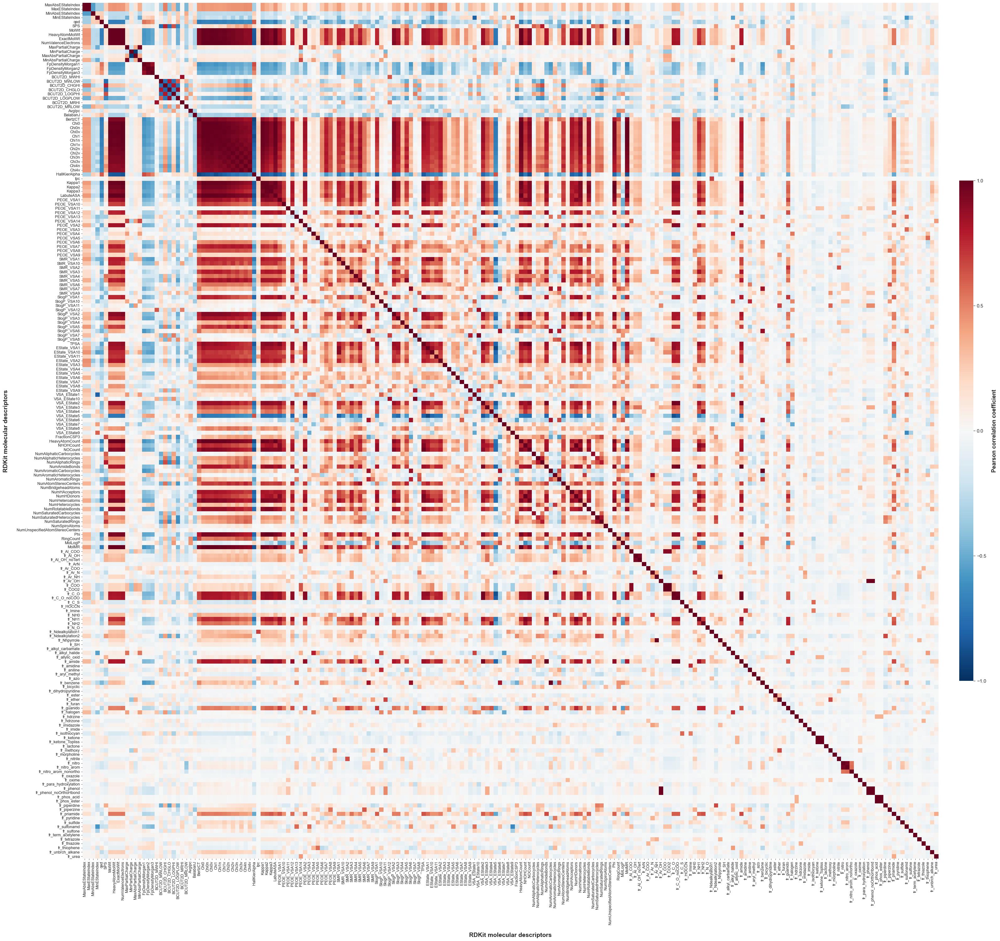


Analysis completed successfully.
Target correlations saved to: /Users/janat/Desktop/ppimic50pred/dataset/data/feature_correlations_with_log_ic50.csv
Significant features saved to: /Users/janat/Desktop/ppimic50pred/dataset/data/significant_features_log_ic50.csv
Correlation matrix saved to: /Users/janat/Desktop/ppimic50pred/dataset/data/feature_correlation_matrix_filtered.csv
Supplementary heatmap saved to: /Users/janat/Desktop/ppimic50pred/dataset/data/feature_correlation_heatmap_supplementary.jpg
Displayed x-axis labels: 202
Displayed y-axis labels: 202


In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ==================================================
# Step 0: Define input and output locations
# ==================================================
data_dir = Path(
    "/Users/janat/Desktop/ppimic50pred/dataset/data"
)

input_file = data_dir / "rdkit_train.csv"

correlation_file = (
    data_dir / "feature_correlation_matrix_filtered.csv"
)

target_correlation_file = (
    data_dir / "feature_correlations_with_log_ic50.csv"
)

significant_features_file = (
    data_dir / "significant_features_log_ic50.csv"
)

heatmap_file = (
    data_dir / "feature_correlation_heatmap_supplementary.jpg"
)

# Confirm that the input file exists
if not input_file.exists():
    raise FileNotFoundError(
        f"Input file was not found:\n{input_file}"
    )

# ==================================================
# Step 1: Read the RDKit descriptor dataset
# ==================================================
rdkit_train = pd.read_csv(input_file)

print(f"Input file: {input_file}")
print(f"Original dataset shape: {rdkit_train.shape}")

if "log_ic50" not in rdkit_train.columns:
    raise ValueError(
        "The required target column 'log_ic50' was not found."
    )

# ==================================================
# Step 2: Prepare the target variable
# ==================================================
y = pd.to_numeric(
    rdkit_train["log_ic50"],
    errors="coerce"
)

missing_target_count = y.isna().sum()

print(
    f"Rows with missing or invalid log_ic50 values: "
    f"{missing_target_count}"
)

# ==================================================
# Step 3: Prepare the descriptor features
# ==================================================
drop_cols = [
    "chembl_id",
    "smiles",
    "ic50_value",
    "log_ic50",
    "target_chembl_id",
    "target_name"
]

existing_drop_cols = [
    col for col in drop_cols
    if col in rdkit_train.columns
]

X = rdkit_train.drop(
    columns=existing_drop_cols
).copy()

print(f"Excluded non-descriptor columns: {existing_drop_cols}")
print(f"Initial descriptor count: {X.shape[1]}")

# Replace blank or whitespace-only cells with NaN
X = X.replace(r"^\s*$", np.nan, regex=True)

# Convert all descriptor columns to numeric
X = X.apply(
    pd.to_numeric,
    errors="coerce"
)

# Retain only rows with a valid target value
valid_rows = y.notna()

X = X.loc[valid_rows].copy()
y = y.loc[valid_rows].copy()

print(f"Rows retained for analysis: {len(y)}")

# ==================================================
# Step 4: Remove invalid descriptor columns
# ==================================================

# Identify columns containing only missing values
all_nan_cols = X.columns[X.isna().all()].tolist()

print(f"All-NaN descriptor count: {len(all_nan_cols)}")

if all_nan_cols:
    print(f"Removing all-NaN descriptors: {all_nan_cols}")
    X = X.drop(columns=all_nan_cols)

# Fill missing values using the corresponding column mean
X = X.fillna(X.mean(numeric_only=True))

# Check whether any missing values remain
remaining_nan_count = int(X.isna().sum().sum())

if remaining_nan_count > 0:
    raise ValueError(
        f"{remaining_nan_count} missing descriptor values remain "
        "after mean imputation."
    )

# Identify zero-variance descriptors
descriptor_variance = X.var()

zero_var_cols = descriptor_variance[
    np.isclose(descriptor_variance, 0)
].index.tolist()

print(f"Zero-variance descriptor count: {len(zero_var_cols)}")

if zero_var_cols:
    print(f"Removing zero-variance descriptors: {zero_var_cols}")

# Remove zero-variance descriptors
X_plot = X.drop(
    columns=zero_var_cols
).copy()

if X_plot.shape[1] == 0:
    raise ValueError(
        "No valid descriptor columns remain after data cleaning."
    )

print(
    f"Final descriptor count used in the heatmap: "
    f"{X_plot.shape[1]}"
)

# ==================================================
# Step 5: Calculate correlations with log_ic50
# ==================================================
corr_with_target = X_plot.corrwith(y)

# Sort descriptors by absolute correlation with the target
corr_with_target_sorted = corr_with_target.sort_values(
    key=lambda values: values.abs(),
    ascending=False
)

# Save correlations with log_ic50
corr_with_target_sorted.rename(
    "correlation_with_log_ic50"
).to_csv(
    target_correlation_file,
    header=True
)

# Select features with an absolute correlation of at least 0.50
correlation_threshold = 0.50

significant_features = corr_with_target_sorted[
    corr_with_target_sorted.abs() >= correlation_threshold
]

significant_features.rename(
    "correlation_with_log_ic50"
).to_csv(
    significant_features_file,
    header=True
)

print(
    f"\nSignificant features "
    f"(|correlation| >= {correlation_threshold:.2f}):"
)

if significant_features.empty:
    print("No descriptors met the selected threshold.")
else:
    for feature, correlation in significant_features.items():
        print(f"{feature}: {correlation:.3f}")

# ==================================================
# Step 6: Calculate the descriptor correlation matrix
# ==================================================
corr_matrix = X_plot.corr(
    method="pearson",
    min_periods=2
)

# Remove any columns or rows that produced only NaN correlations
valid_corr_features = corr_matrix.columns[
    ~corr_matrix.isna().all(axis=0)
]

corr_matrix = corr_matrix.loc[
    valid_corr_features,
    valid_corr_features
]

if corr_matrix.empty:
    raise ValueError(
        "The descriptor correlation matrix is empty."
    )

corr_matrix.to_csv(correlation_file)

print(f"\nCorrelation matrix shape: {corr_matrix.shape}")
print(f"Correlation matrix saved to: {correlation_file}")

# ==================================================
# Step 7: Create the publication-quality heatmap
# ==================================================
sns.set_theme(
    style="white",
    context="paper"
)

n_features = len(corr_matrix.columns)

# The large figure dimensions allow every descriptor label
# to be displayed in the supplementary figure.
figure_width = max(40, n_features * 0.22)
figure_height = max(36, n_features * 0.20)

print(
    f"\nCreating a heatmap containing {n_features} descriptors."
)

print(
    f"Figure dimensions: "
    f"{figure_width:.1f} × {figure_height:.1f} inches"
)

fig, ax = plt.subplots(
    figsize=(figure_width, figure_height),
    constrained_layout=False,
    facecolor="white"
)

heatmap = sns.heatmap(
    corr_matrix,
    cmap="RdBu_r",
    center=0,
    vmin=-1,
    vmax=1,
    square=True,
    annot=False,
    linewidths=0,
    linecolor=None,
    xticklabels=True,
    yticklabels=True,
    cbar_kws={
        "label": "Pearson correlation coefficient",
        "shrink": 0.50,
        "aspect": 35,
        "pad": 0.02,
        "ticks": [-1.0, -0.5, 0.0, 0.5, 1.0]
    },
    ax=ax
)

# ==================================================
# Step 8: Display every x-axis and y-axis label
# ==================================================
tick_positions = np.arange(n_features) + 0.5

ax.set_xticks(tick_positions)
ax.set_yticks(tick_positions)

ax.set_xticklabels(
    corr_matrix.columns.tolist(),
    rotation=90,
    ha="center",
    va="top",
    fontsize=9
)

ax.set_yticklabels(
    corr_matrix.index.tolist(),
    rotation=0,
    ha="right",
    va="center",
    fontsize=9
)

ax.tick_params(
    axis="x",
    which="major",
    bottom=True,
    top=False,
    labelbottom=True,
    labeltop=False,
    length=3,
    width=0.6,
    pad=3
)

ax.tick_params(
    axis="y",
    which="major",
    left=True,
    right=False,
    labelleft=True,
    labelright=False,
    length=3,
    width=0.6,
    pad=3
)

ax.set_xlabel(
    "RDKit molecular descriptors",
    fontsize=14,
    fontweight="bold",
    labelpad=18
)

ax.set_ylabel(
    "RDKit molecular descriptors",
    fontsize=14,
    fontweight="bold",
    labelpad=18
)

# ==================================================
# Step 9: Format the color bar
# ==================================================
colorbar = heatmap.collections[0].colorbar

colorbar.ax.tick_params(
    labelsize=11,
    width=0.8,
    length=4
)

colorbar.set_label(
    "Pearson correlation coefficient",
    fontsize=13,
    fontweight="bold",
    labelpad=12
)

# Leave sufficient space around the heatmap
fig.subplots_adjust(
    left=0.18,
    right=0.92,
    bottom=0.20,
    top=0.99
)

# ==================================================
# Step 10: Save as a high-quality JPG
# ==================================================
fig.savefig(
    heatmap_file,
    format="jpg",
    dpi=300,
    bbox_inches="tight",
    pad_inches=0.25,
    facecolor="white",
    pil_kwargs={
        "quality": 100,
        "subsampling": 0,
        "optimize": True
    }
)

plt.show()
plt.close(fig)

# ==================================================
# Step 11: Print output summary
# ==================================================
print("\nAnalysis completed successfully.")

print(f"Target correlations saved to: {target_correlation_file}")
print(f"Significant features saved to: {significant_features_file}")
print(f"Correlation matrix saved to: {correlation_file}")
print(f"Supplementary heatmap saved to: {heatmap_file}")

print(f"Displayed x-axis labels: {n_features}")
print(f"Displayed y-axis labels: {n_features}")

Correlation matrix shape: (202, 202)
Top 100 features selected for heatmap: 100


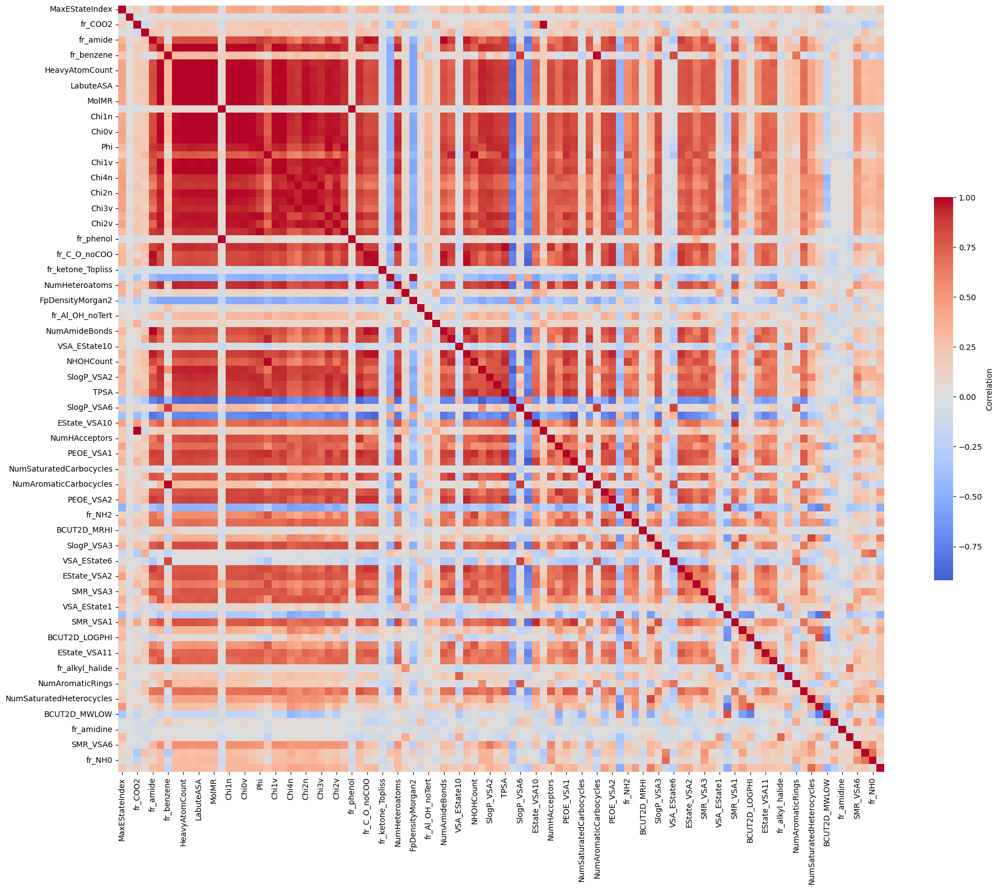

✅ Heatmap saved at: /Users/janat/Desktop/ppimic50pred/dataset/data/feature_correlation_heatmap_top100.png


In [34]:
# =======================================
# Step 3: Compute correlation matrix
# =======================================
corr_matrix = X_plot.corr(min_periods=1)
print(f"Correlation matrix shape: {corr_matrix.shape}")

# Save full correlation matrix to CSV
corr_matrix.to_csv(
    "/Users/janat/Desktop/ppimic50pred/dataset/data/feature_correlation_matrix_filtered.csv"
)

# =======================================
# Step 4: Select Top 100 correlated features
# =======================================
# Get absolute correlation values
corr_abs = corr_matrix.abs()

# Get upper triangle to avoid duplicate correlations
upper = corr_abs.where(np.triu(np.ones(corr_abs.shape), k=1).astype(bool))

# Rank features by their highest correlation with any other feature
top100_cols = upper.max().sort_values(ascending=False).head(100).index.tolist()

# Subset correlation matrix
corr_top100 = corr_matrix.loc[top100_cols, top100_cols]

print(f"Top 100 features selected for heatmap: {len(top100_cols)}")

# =======================================
# Step 5: Plot heatmap for Top 100
# =======================================
plt.figure(figsize=(20, 16))  # fixed width & height

sns.heatmap(
    corr_top100,
    cmap='coolwarm',
    center=0,
    annot=False,  # only colors, no numbers
    cbar_kws={'label': 'Correlation', 'shrink': 0.5},
    square=True
)

# Larger tick labels for readability
plt.xticks(rotation=90, fontsize=10, ha='center')
plt.yticks(rotation=0, fontsize=10)

#plt.title("Top 100 Feature Correlation Heatmap", fontsize=16, weight="bold")
plt.tight_layout()

# Save and show
out_path = "/Users/janat/Desktop/ppimic50pred/dataset/data/feature_correlation_heatmap_top100.png"
plt.savefig(out_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"✅ Heatmap saved at: {out_path}")


In [1]:
# ============================
# Step 4: Plot the heatmap (larger tick fonts)
# ============================
fig, ax = plt.subplots(figsize=(20, 18))  # Large figure to accommodate many labels

sns.heatmap(
    corr_matrix,
    cmap='coolwarm',
    center=0,
    annot=False,
    fmt=".2f",
    cbar_kws={'label': 'Correlation', 'shrink': 0.5},
    square=True,
    ax=ax
)

# Show all tick labels with larger font
ax.set_xticks(np.arange(len(corr_matrix.columns)) + 0.2)
ax.set_xticklabels(
    corr_matrix.columns,
    rotation=90,
    fontsize=5,    # 🔹 increased from 4.4 → 10
    ha='center'
)

ax.set_yticks(np.arange(len(corr_matrix.index)) + 0.2)
ax.set_yticklabels(
    corr_matrix.index,
    rotation=0,
    fontsize=5     # 🔹 increased from 4.4 → 10
)

#ax.set_title("Feature Correlation Heatmap", fontsize=16, weight="bold")

plt.tight_layout()

# Save the heatmap to a high resolution file
plt.savefig(
    "/Users/janat/Desktop/ppimic50pred/dataset/data/feature_correlation_heatmap_full_ticks.png",
    dpi=600,
    bbox_inches='tight'
)

plt.show()


NameError: name 'plt' is not defined

In [38]:
corr_matrix

,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_pyridine,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea
MaxAbsEStateIndex,1.000000,1.000000,-0.559066,-0.338294,-0.347496,0.239793,0.441315,0.445334,0.441088,0.433240,...,-0.011651,-0.050506,0.113055,0.110933,-0.058662,0.044134,-0.050806,-0.067882,0.011521,0.017483
MaxEStateIndex,1.000000,1.000000,-0.559066,-0.338294,-0.347496,0.239793,0.441315,0.445334,0.441088,0.433240,...,-0.011651,-0.050506,0.113055,0.110933,-0.058662,0.044134,-0.050806,-0.067882,0.011521,0.017483
MinAbsEStateIndex,-0.559066,-0.559066,1.000000,0.207931,0.241266,-0.129251,-0.261840,-0.265135,-0.261725,-0.261134,...,0.008361,-0.021724,-0.102624,-0.033824,-0.003107,-0.026917,-0.011413,0.092516,-0.037938,0.030824
MinEStateIndex,-0.338294,-0.338294,0.207931,1.000000,0.267902,-0.012741,-0.269907,-0.279977,-0.270075,-0.250547,...,-0.001183,-0.009443,-0.590127,-0.306641,0.028063,-0.015371,0.052839,-0.194450,0.079989,0.111741
qed,-0.347496,-0.347496,0.241266,0.267902,1.000000,0.012332,-0.693489,-0.697765,-0.693409,-0.672402,...,0.013057,-0.158715,-0.238426,0.017479,0.003872,-0.051802,-0.002293,0.156400,-0.256958,-0.068763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fr_tetrazole,0.044134,0.044134,-0.026917,-0.015371,-0.051802,-0.034290,0.120868,0.122782,0.120938,0.121677,...,-0.035813,-0.030585,0.077976,-0.024088,-0.002991,1.000000,-0.018884,-0.024672,0.035246,-0.018153
fr_thiazole,-0.050806,-0.050806,-0.011413,0.052839,-0.002293,-0.098514,-0.040058,-0.037312,-0.039910,-0.045286,...,0.029065,-0.035072,-0.059431,0.016223,-0.006871,-0.018884,1.000000,0.004567,-0.025707,-0.024296
fr_thiophene,-0.067882,-0.067882,0.092516,-0.194450,0.156400,-0.001544,-0.076748,-0.074920,-0.076423,-0.074294,...,-0.001997,-0.019047,-0.099957,0.055068,-0.008977,-0.024672,0.004567,1.000000,-0.062906,-0.054491
fr_unbrch_alkane,0.011521,0.011521,-0.037938,0.079989,-0.256958,-0.103642,0.246375,0.240140,0.246496,0.251987,...,-0.075828,0.216716,-0.031852,-0.035772,-0.007849,0.035246,-0.025707,-0.062906,1.000000,0.073036


## Tunning Parameters of Random Forest using 10-fold Cross Validation

In [42]:
import numpy as np
import pandas as pd
import warnings
import re

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error, r2_score, make_scorer

# Suppress specific RuntimeWarnings
warnings.filterwarnings("ignore", message=re.escape("overflow encountered in cast"), category=RuntimeWarning)

# Define custom RMSE scorer
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

neg_rmse_scorer = make_scorer(rmse, greater_is_better=False)

# Prepare the data
y = rdkit_train['log_ic50']
drop_cols = ['chembl_id', 'smiles', 'ic50_value', 'log_ic50', 'target_chembl_id', 'target_name']
X = rdkit_train.drop(columns=[col for col in drop_cols if col in rdkit_train.columns])

X = X.replace(r'^\s*$', np.nan, regex=True)
X = X.apply(pd.to_numeric, errors='coerce')
X = X.replace([np.inf, -np.inf], np.nan)
X = X.clip(upper=1e6, lower=-1e6)
X = X.fillna(X.mean())

# Split data
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Define model and hyperparameter grid
rf = RandomForestRegressor(random_state=42)
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 15, 20, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'log2', None]
}

# Grid Search
rf_grid_search = GridSearchCV(
    estimator=rf,
    param_grid=rf_param_grid,
    scoring=neg_rmse_scorer,
    cv=10,
    n_jobs=-1,
    verbose=2
)

rf_grid_search.fit(X_train, y_train)

# Store best parameters
rf_best_params = rf_grid_search.best_params_

# Results
print("Random Forest Best Parameters:")
print(rf_best_params)


# Print best score (convert from negative RMSE to positive RMSE)
best_neg_rmse = rf_grid_search.best_score_
best_rmse = -best_neg_rmse  # since we used negative RMSE as scorer

print(f"Best RMSE Score (10-fold CV): {best_rmse:.4f}")



Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Random Forest Best Parameters:
{'max_depth': None, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Best RMSE Score (10-fold CV): 0.7954


## Tunning Parameters of LSTM deep learning

In [44]:
import itertools
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import warnings

warnings.filterwarnings("ignore", message="overflow encountered*", category=RuntimeWarning)

# Define LSTM model
class LSTMRegressor(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=1, activation_fn=nn.ReLU()):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)
        self.activation = activation_fn

    def forward(self, x):
        out, _ = self.lstm(x)
        out = out[:, -1, :]
        out = self.fc(out)
        out = self.activation(out)
        return out

# Training function
def train_model(model, train_loader, val_loader, epochs=50, patience=7, lr=0.001):
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    best_val_loss = float('inf')
    patience_counter = 0
    best_state = None

    for epoch in range(epochs):
        model.train()
        for xb, yb in train_loader:
            optimizer.zero_grad()
            preds = model(xb)
            loss = criterion(preds, yb)
            loss.backward()
            optimizer.step()

        model.eval()
        val_losses = []
        with torch.no_grad():
            for xb, yb in val_loader:
                preds = model(xb)
                loss = criterion(preds, yb)
                val_losses.append(loss.item())

        avg_val_loss = np.mean(val_losses)

        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_state = model.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break

    model.load_state_dict(best_state)
    return model, best_val_loss

# Prepare data
y = rdkit_train['log_ic50']
drop_cols = ['chembl_id', 'smiles', 'ic50_value', 'log_ic50', 'target_chembl_id', 'target_name']
X = rdkit_train.drop(columns=[col for col in drop_cols if col in rdkit_train.columns])

l
X = X.fillna(X.mean())

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

X_train_seq = X_train_scaled.reshape(X_train_scaled.shape[0], 1, X_train_scaled.shape[1])
X_val_seq = X_val_scaled.reshape(X_val_scaled.shape[0], 1, X_val_scaled.shape[1])

X_train_tensor = torch.tensor(X_train_seq, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values.reshape(-1, 1), dtype=torch.float32)
X_val_tensor = torch.tensor(X_val_seq, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val.values.reshape(-1, 1), dtype=torch.float32)

train_ds = TensorDataset(X_train_tensor, y_train_tensor)
val_ds = TensorDataset(X_val_tensor, y_val_tensor)

# Hyperparameter search
activation_functions = {
    'relu': nn.ReLU(),
    'tanh': nn.Tanh(),
    'sigmoid': nn.Sigmoid(),
    'leaky_relu': nn.LeakyReLU()
}

lstm_param_grid = {
    'hidden_size': [32, 64, 128],
    'num_layers': [1, 2],
    'learning_rate': [1e-3, 5e-4],
    'batch_size': [32, 64],
    'activation': list(activation_functions.keys())
}

lstm_results = []

for hidden_size, num_layers, lr, batch_size, act_name in itertools.product(
    lstm_param_grid['hidden_size'],
    lstm_param_grid['num_layers'],
    lstm_param_grid['learning_rate'],
    lstm_param_grid['batch_size'],
    lstm_param_grid['activation']
):
    print(f"\nTraining: hidden_size={hidden_size}, num_layers={num_layers}, lr={lr}, "
          f"batch_size={batch_size}, activation={act_name}")

    activation_fn = activation_functions[act_name]
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=batch_size)

    model = LSTMRegressor(
        input_size=X_train_tensor.shape[2],
        hidden_size=hidden_size,
        num_layers=num_layers,
        activation_fn=activation_fn
    )

    model, val_loss = train_model(model, train_loader, val_loader, epochs=50, patience=7, lr=lr)

    model.eval()
    val_preds, val_true = [], []
    with torch.no_grad():
        for xb, yb in val_loader:
            preds = model(xb)
            val_preds.append(preds.cpu().numpy())
            val_true.append(yb.cpu().numpy())

    val_preds = np.vstack(val_preds).flatten()
    val_true = np.vstack(val_true).flatten()

    mse = mean_squared_error(val_true, val_preds)
    rmse = np.sqrt(mse)
    r2 = r2_score(val_true, val_preds)

    print(f"→ RMSE={rmse:.4f}, R²={r2:.4f}")

    lstm_results.append({
        'hidden_size': hidden_size,
        'num_layers': num_layers,
        'learning_rate': lr,
        'batch_size': batch_size,
        'activation': act_name,
        'RMSE': rmse,
        'R2': r2
    })

# Store best parameters
results_df = pd.DataFrame(lstm_results)
results_df_sorted = results_df.sort_values(by='RMSE', ascending=True)

print("\n=== LSTM Grid Search Results (sorted by RMSE) ===")
print(results_df_sorted.to_string(index=False, float_format="%.4f"))

best_row = results_df_sorted.iloc[0]
lstm_best_params = {
    'hidden_size': int(best_row['hidden_size']),
    'num_layers': int(best_row['num_layers']),
    'learning_rate': float(best_row['learning_rate']),
    'batch_size': int(best_row['batch_size']),
    'activation': best_row['activation']
}

print("\n=== Best LSTM Hyperparameters ===")
print(lstm_best_params)



Training: hidden_size=32, num_layers=1, lr=0.001, batch_size=32, activation=relu
→ RMSE=0.8167, R²=0.7263

Training: hidden_size=32, num_layers=1, lr=0.001, batch_size=32, activation=tanh
→ RMSE=1.9909, R²=-0.6267

Training: hidden_size=32, num_layers=1, lr=0.001, batch_size=32, activation=sigmoid
→ RMSE=1.9946, R²=-0.6328

Training: hidden_size=32, num_layers=1, lr=0.001, batch_size=32, activation=leaky_relu
→ RMSE=0.8035, R²=0.7351

Training: hidden_size=32, num_layers=1, lr=0.001, batch_size=64, activation=relu
→ RMSE=0.8114, R²=0.7298

Training: hidden_size=32, num_layers=1, lr=0.001, batch_size=64, activation=tanh
→ RMSE=1.9904, R²=-0.6258

Training: hidden_size=32, num_layers=1, lr=0.001, batch_size=64, activation=sigmoid
→ RMSE=1.9923, R²=-0.6290

Training: hidden_size=32, num_layers=1, lr=0.001, batch_size=64, activation=leaky_relu
→ RMSE=0.8007, R²=0.7369

Training: hidden_size=32, num_layers=1, lr=0.0005, batch_size=32, activation=relu
→ RMSE=0.7941, R²=0.7412

Training: hid

## Feature Selection: Feature Importance (Supervised): RandomForestRegressor

Feature importance plot saved to: /Users/janat/Desktop/ppimic50pred/dataset/data/feature_importance_filtered.png


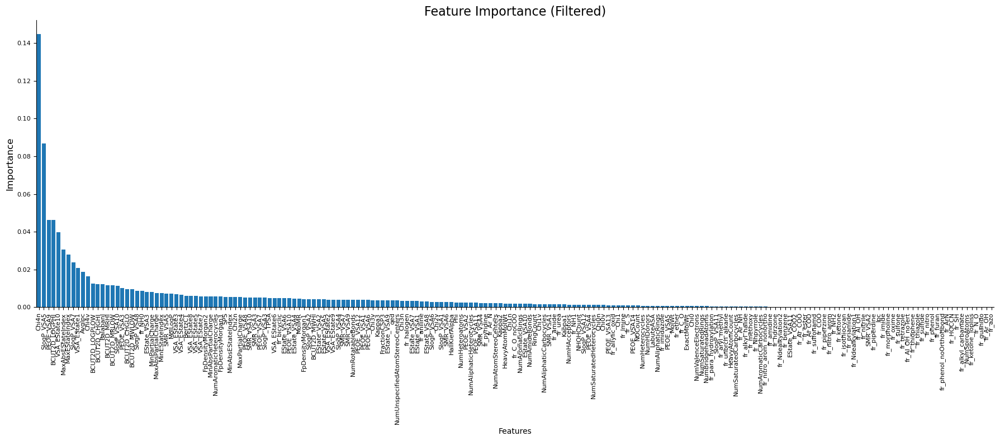

Number of filtered features: 195


In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import warnings
import re

# Suppress specific RuntimeWarnings related to overflow in casting
warnings.filterwarnings(
    "ignore",
    message=re.escape("overflow encountered in cast"),
    category=RuntimeWarning,
)

# Prepare target variable
y = rdkit_train['log_ic50']

# Define columns to drop if present
drop_cols = [
    'chembl_id', 'smiles', 'ic50_value', 'log_ic50', 'target_chembl_id', 'target_name'
]

# Drop unwanted columns safely
X = rdkit_train.drop(columns=[col for col in drop_cols if col in rdkit_train.columns])

# Clean and convert feature data to numeric
X = X.replace(r'^\s*$', np.nan, regex=True)  # Replace empty strings with NaN
X = X.apply(pd.to_numeric, errors='coerce')  # Coerce non-numeric to NaN
X = X.replace([np.inf, -np.inf], np.nan)     # Replace infinite values with NaN
X = X.clip(lower=-1e6, upper=1e6)            # Clip extreme values
X = X.fillna(X.mean())                        # Impute NaN with column means

# Split into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Initialize and train Random Forest Regressor with given best params
reg = RandomForestRegressor(**rf_best_params)
reg.fit(X_train, y_train)

# Extract feature importances
feature_importance = reg.feature_importances_

# Filter features with importance > 0
important_mask = feature_importance > 0.0
features_filtered = X.columns[important_mask]
importances_filtered = feature_importance[important_mask]

# Sort features by importance in descending order
sorted_idx = np.argsort(importances_filtered)[::-1]
features_sorted = features_filtered[sorted_idx]
importances_sorted = importances_filtered[sorted_idx]

# Plot feature importances
fig, ax = plt.subplots(figsize=(18, 8))
ax.bar(features_sorted, importances_sorted)

# Customize plot appearance
ax.set_xlabel("Features", fontsize=10)
ax.set_ylabel("Importance", fontsize=12)
ax.set_title("Feature Importance (Filtered)", fontsize=16)
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)
ax.set_ylim(bottom=0)
ax.set_xlim(left=-0.5, right=len(features_sorted) - 0.5)

# Hide top and right plot borders
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

# Save the figure
plot_path = "/Users/janat/Desktop/ppimic50pred/dataset/data/feature_importance_filtered.png"
plt.savefig(plot_path, dpi=300)
print(f"Feature importance plot saved to: {plot_path}")

plt.show()

print(f"Number of filtered features: {features_filtered.shape[0]}")


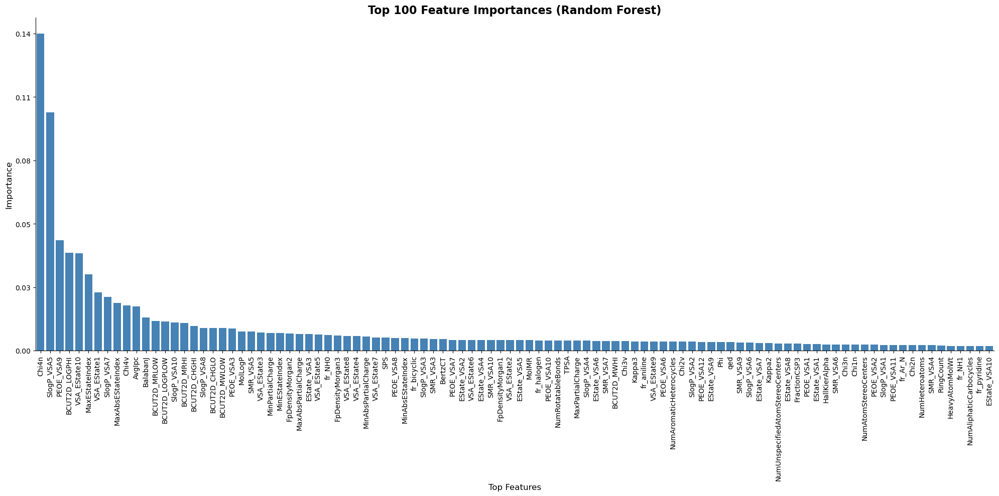

✅ Feature importance plot saved at: /Users/janat/Desktop/ppimic50pred/dataset/data/feature_importance_top100.png
Total features with importance > 0: 196
Plotted Top 100 features.


In [50]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import warnings
import re

# Suppress overflow warnings
warnings.filterwarnings(
    "ignore",
    message=re.escape("overflow encountered in cast"),
    category=RuntimeWarning,
)

# ============================
# Step 1: Prepare Data
# ============================

# Target variable
y = rdkit_train['log_ic50']

# Columns to drop
drop_cols = ['chembl_id', 'smiles', 'ic50_value', 'log_ic50', 
             'target_chembl_id', 'target_name']

# Feature matrix
X = rdkit_train.drop(columns=[col for col in drop_cols if col in rdkit_train.columns])

# Clean and convert features
X = X.replace(r'^\s*$', np.nan, regex=True)
X = X.apply(pd.to_numeric, errors='coerce')
X = X.replace([np.inf, -np.inf], np.nan)
X = X.clip(lower=-1e6, upper=1e6)
X = X.fillna(X.mean())

# Split into train/validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# ============================
# Step 2: Train Random Forest
# ============================

reg = RandomForestRegressor(**rf_best_params)
reg.fit(X_train, y_train)

# ============================
# Step 3: Feature Importances
# ============================

feature_importance = reg.feature_importances_

# Filter features with importance > 0
important_mask = feature_importance > 0.0
features_filtered = X.columns[important_mask]
importances_filtered = feature_importance[important_mask]

# Sort features descending
sorted_idx = np.argsort(importances_filtered)[::-1]
features_sorted = features_filtered[sorted_idx]
importances_sorted = importances_filtered[sorted_idx]

# Select top 100
top_n = min(100, len(features_sorted))
features_top = features_sorted[:top_n]
importances_top = importances_sorted[:top_n]

# ============================
# Step 4: Plot Top Features
# ============================

fig, ax = plt.subplots(figsize=(20, 10))

# Plot bars, center aligned
bars = ax.bar(np.arange(top_n), importances_top, color="steelblue", align="center")

# Ensure x-axis starts at 0 and aligns with bars
ax.set_xlim(-0.5, top_n - 0.5)

# X-ticks
ax.set_xticks(np.arange(top_n))
ax.set_xticklabels(features_top, rotation=90, fontsize=10, ha="center")

# Y-ticks
ax.set_yticks(np.linspace(0, max(importances_top), 6))
ax.set_yticklabels([f"{v:.2f}" for v in np.linspace(0, max(importances_top), 6)], fontsize=10)

# Labels and title
ax.set_xlabel("Top Features", fontsize=12)
ax.set_ylabel("Importance", fontsize=12)
ax.set_title(f"Top {top_n} Feature Importances (Random Forest)", fontsize=16, weight="bold")

# Start y-axis at 0
ax.set_ylim(bottom=0)

# Clean look
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

# Save figure
plot_path = "/Users/janat/Desktop/ppimic50pred/dataset/data/feature_importance_top100.png"
plt.savefig(plot_path, dpi=300)
plt.show()

# Print summary
print(f"✅ Feature importance plot saved at: {plot_path}")
print(f"Total features with importance > 0: {len(features_filtered)}")
print(f"Plotted Top {top_n} features.")


## Feature Importance & Feature Importance

In [52]:
filtered_set = set(features_filtered.tolist())
full_set = set(corr_matrix.columns.tolist())

# Are all filtered features present in full feature list?
is_subset = filtered_set.issubset(full_set)
print(f"Filtered features are subset of correlation matrix features? {is_subset}")

# Check how many features differ
missing_features = full_set - filtered_set
extra_features = filtered_set - full_set

print(f"Features missing from filtered set: {missing_features}")
print(f"Features extra in filtered set (should be empty): {extra_features}")

# Confirm counts
print(f"Number of filtered features: {len(filtered_set)}")
print(f"Number of full features: {len(full_set)}")


Filtered features are subset of correlation matrix features? True
Features missing from filtered set: {'fr_N_O', 'fr_phos_acid', 'fr_phos_ester', 'fr_dihydropyridine', 'fr_term_acetylene', 'fr_azo'}
Features extra in filtered set (should be empty): set()
Number of filtered features: 196
Number of full features: 202


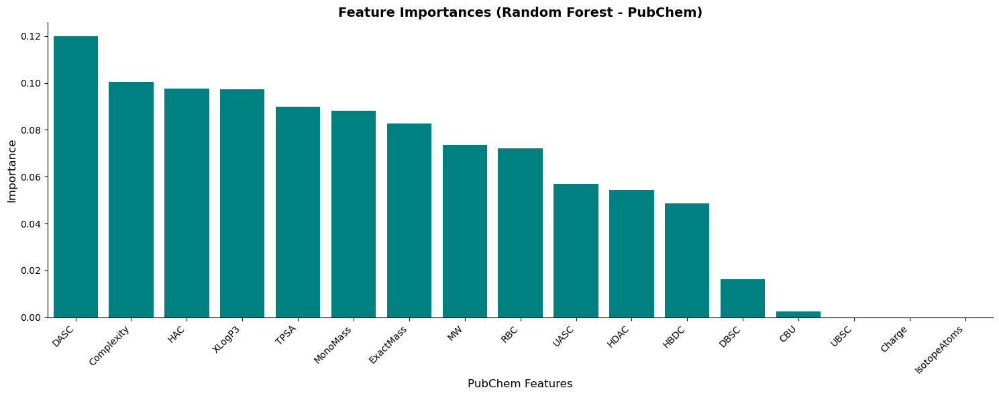

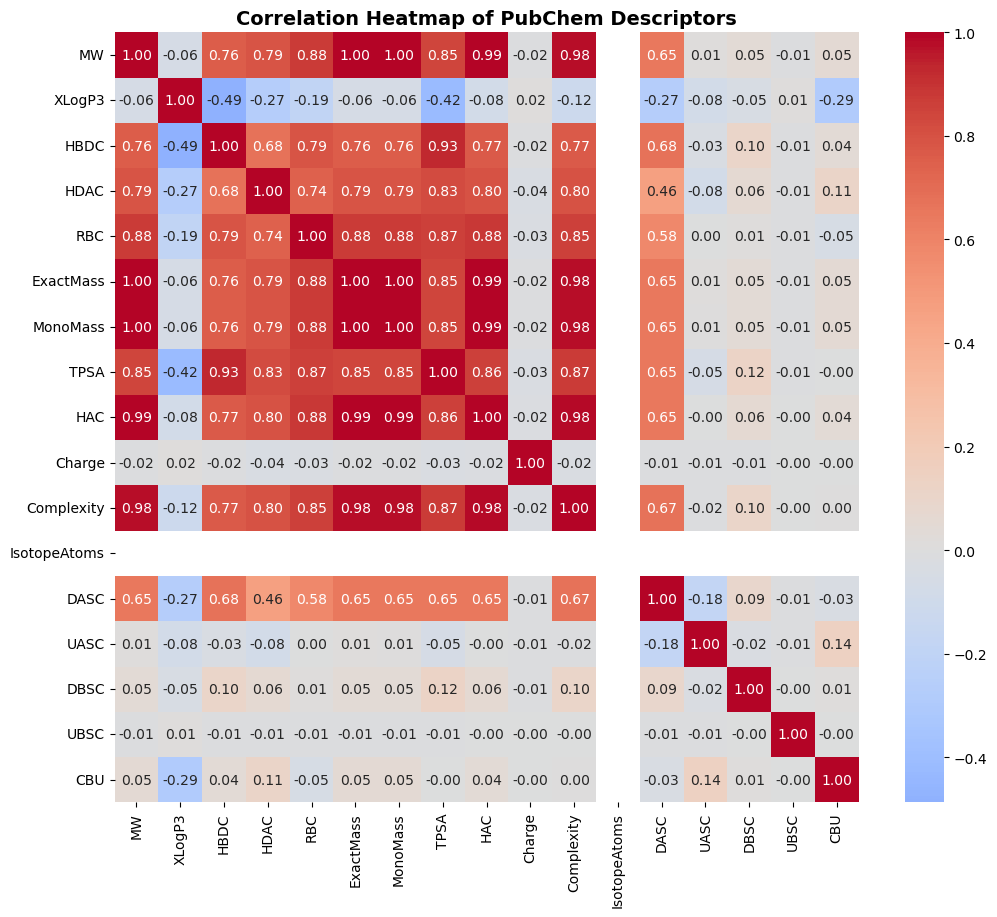

✅ Total features: 17
✅ Feature importance plot saved at: /Users/janat/Desktop/ppimic50pred/dataset/data/pubchem_feature_importance.png
✅ Correlation heatmap saved at: /Users/janat/Desktop/ppimic50pred/dataset/data/pubchem_correlation_heatmap.png


In [85]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import warnings
import re
import os

# ============================
# Suppress warnings
# ============================
warnings.filterwarnings(
    "ignore",
    message=re.escape("overflow encountered in cast"),
    category=RuntimeWarning,
)

# ============================
# Step 1: Prepare Data
# ============================
y = pubchem_train['log_ic50']

drop_cols = ['target_chembl_id', 'target_name', 'ic50_value', 'chembl_id', 'log_ic50', 'CID']
X = pubchem_train.drop(columns=[col for col in drop_cols if col in pubchem_train.columns])

# Clean and convert features
X = X.replace(r'^\s*$', np.nan, regex=True).apply(pd.to_numeric, errors='coerce')
X = X.fillna(X.mean())

# Keep all 17 features
X_selected = X.copy()
feature_names = X_selected.columns

# Split into train and validation
X_train, X_val, y_train, y_val = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# ============================
# Step 2: Train Random Forest
# ============================
rf = RandomForestRegressor(**rf_best_params)
rf.fit(X_train, y_train)

# ============================
# Step 3: Feature Importances
# ============================
importances = rf.feature_importances_

# Sort descending
sorted_idx = np.argsort(importances)[::-1]
features_sorted = feature_names[sorted_idx]
importances_sorted = importances[sorted_idx]

# ============================
# Step 4: Plot and Save Feature Importances
# ============================
top_n = len(features_sorted)  # all 17 features
fig, ax = plt.subplots(figsize=(15, 6))
ax.bar(np.arange(top_n), importances_sorted, color="teal", align="center")

# Align x-axis with bars
ax.set_xlim(-0.5, top_n - 0.5)
ax.set_xticks(np.arange(top_n))
ax.set_xticklabels(features_sorted, rotation=45, ha="right", fontsize=10)

ax.set_ylabel("Importance", fontsize=12)
ax.set_xlabel("PubChem Features", fontsize=12)
ax.set_title("Feature Importances (Random Forest - PubChem)", fontsize=14, weight="bold")
ax.set_ylim(bottom=0)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

# Save feature importance plot
output_dir = "/Users/janat/Desktop/ppimic50pred/dataset/data"
os.makedirs(output_dir, exist_ok=True)
fi_plot_path = os.path.join(output_dir, "pubchem_feature_importance.png")
plt.savefig(fi_plot_path, dpi=300)
plt.show()

# ============================
# Step 5: Plot and Save Correlation Heatmap
# ============================
corr_matrix = X_selected.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap="coolwarm", center=0, annot=True, fmt=".2f")
plt.title("Correlation Heatmap of PubChem Descriptors", fontsize=14, weight="bold")

# Save correlation heatmap
corr_plot_path = os.path.join(output_dir, "pubchem_correlation_heatmap.png")
plt.savefig(corr_plot_path, dpi=300)
plt.show()

# ============================
# Step 6: Summary
# ============================
print(f"✅ Total features: {top_n}")
print(f"✅ Feature importance plot saved at: {fi_plot_path}")
print(f"✅ Correlation heatmap saved at: {corr_plot_path}")


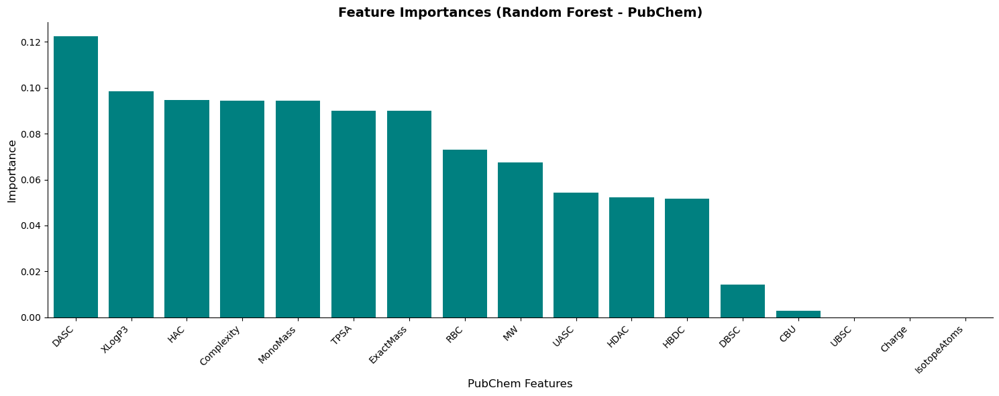

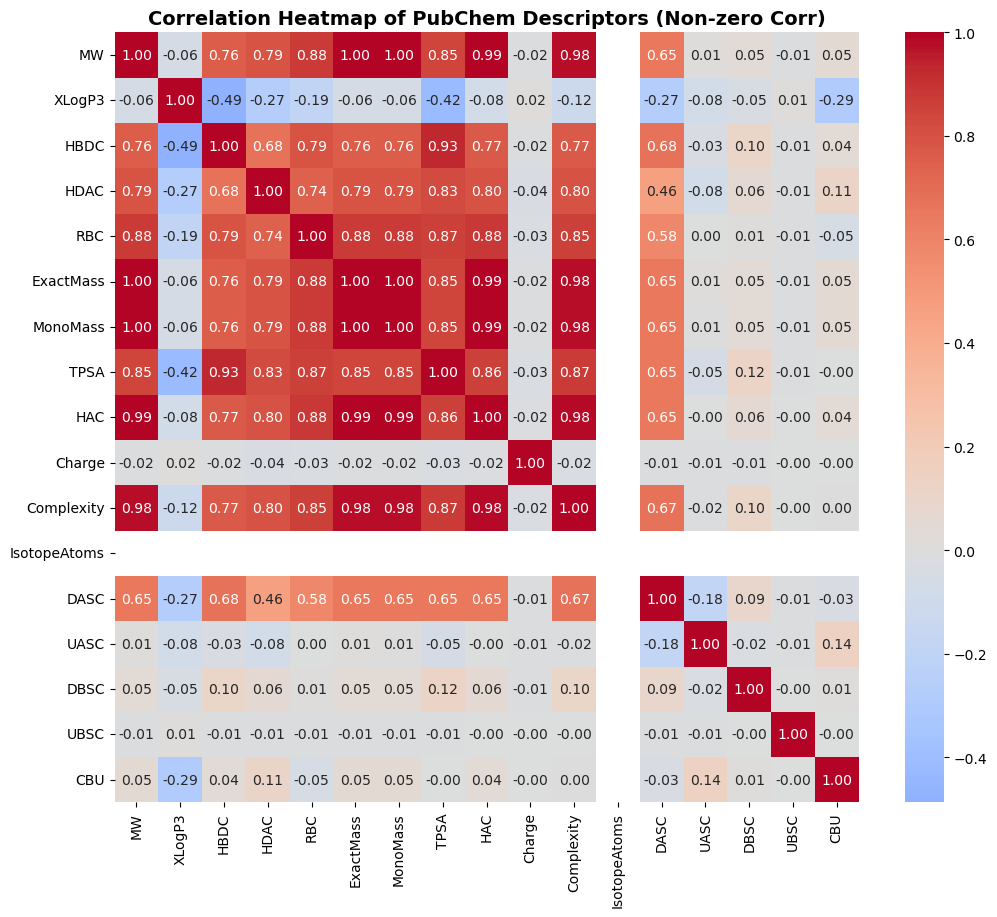

✅ Total features with non-zero correlation: 17
✅ Feature importance plot saved at: /Users/janat/Desktop/ppimic50pred/dataset/data/pubchem_feature_importance_filtered.png
✅ Correlation heatmap saved at: /Users/janat/Desktop/ppimic50pred/dataset/data/pubchem_correlation_heatmap_filtered.png


In [87]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import warnings
import re
import os

# ============================
# Suppress warnings
# ============================
warnings.filterwarnings(
    "ignore",
    message=re.escape("overflow encountered in cast"),
    category=RuntimeWarning,
)

# ============================
# Step 1: Prepare Data
# ============================
y = pubchem_train['log_ic50']

drop_cols = ['target_chembl_id', 'target_name', 'ic50_value', 'chembl_id', 'log_ic50', 'CID']
X = pubchem_train.drop(columns=[col for col in drop_cols if col in pubchem_train.columns])

# Clean and convert features
X = X.replace(r'^\s*$', np.nan, regex=True).apply(pd.to_numeric, errors='coerce')
X = X.fillna(X.mean())

# ============================
# Step 1b: Filter features with zero correlation with target
# ============================
corr_with_target = X.corrwith(y)
nonzero_corr_features = corr_with_target[corr_with_target != 0].index
X_selected = X[nonzero_corr_features]
feature_names = X_selected.columns

# Split into train and validation
X_train, X_val, y_train, y_val = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# ============================
# Step 2: Train Random Forest
# ============================
rf = RandomForestRegressor(**rf_best_params)
rf.fit(X_train, y_train)

# ============================
# Step 3: Feature Importances
# ============================
importances = rf.feature_importances_

# Sort descending
sorted_idx = np.argsort(importances)[::-1]
features_sorted = feature_names[sorted_idx]
importances_sorted = importances[sorted_idx]

# ============================
# Step 4: Plot and Save Feature Importances
# ============================
top_n = len(features_sorted)
fig, ax = plt.subplots(figsize=(15, 6))
ax.bar(np.arange(top_n), importances_sorted, color="teal", align="center")

# Align x-axis with bars
ax.set_xlim(-0.5, top_n - 0.5)
ax.set_xticks(np.arange(top_n))
ax.set_xticklabels(features_sorted, rotation=45, ha="right", fontsize=10)

ax.set_ylabel("Importance", fontsize=12)
ax.set_xlabel("PubChem Features", fontsize=12)
ax.set_title("Feature Importances (Random Forest - PubChem)", fontsize=14, weight="bold")
ax.set_ylim(bottom=0)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

# Save feature importance plot
output_dir = "/Users/janat/Desktop/ppimic50pred/dataset/data"
os.makedirs(output_dir, exist_ok=True)
fi_plot_path = os.path.join(output_dir, "pubchem_feature_importance_filtered.png")
plt.savefig(fi_plot_path, dpi=300)
plt.show()

# ============================
# Step 5: Plot and Save Correlation Heatmap
# ============================
corr_matrix = X_selected.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap="coolwarm", center=0, annot=True, fmt=".2f")
plt.title("Correlation Heatmap of PubChem Descriptors (Non-zero Corr)", fontsize=14, weight="bold")

# Save correlation heatmap
corr_plot_path = os.path.join(output_dir, "pubchem_correlation_heatmap_filtered.png")
plt.savefig(corr_plot_path, dpi=300)
plt.show()

# ============================
# Step 6: Summary
# ============================
print(f"✅ Total features with non-zero correlation: {top_n}")
print(f"✅ Feature importance plot saved at: {fi_plot_path}")
print(f"✅ Correlation heatmap saved at: {corr_plot_path}")


In [90]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader, random_split

# === Metrics ===
def medape(y_true, y_pred, epsilon=1e-3):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true > epsilon
    return np.median(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100 if np.sum(mask) else np.nan

def smape(y_true, y_pred, epsilon=1e-3):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2.0
    denominator = np.where(denominator < epsilon, epsilon, denominator)
    return np.mean(np.abs(y_true - y_pred) / denominator) * 100

# === LSTM ===
class LSTMRegressor(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=2, activation='relu'):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.activation = {'relu': nn.ReLU(), 'tanh': nn.Tanh(), 'sigmoid': nn.Sigmoid(),
                           'leaky_relu': nn.LeakyReLU()}.get(activation)
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = out[:, -1, :]
        return self.fc(self.activation(out)) if self.activation else self.fc(out)

def train_model(model, train_loader, val_loader, epochs=200, patience=20, lr=0.001):
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    best_loss, best_state, patience_counter = float('inf'), None, 0

    for epoch in range(epochs):
        model.train()
        for xb, yb in train_loader:
            optimizer.zero_grad()
            loss = criterion(model(xb), yb)
            loss.backward()
            optimizer.step()

        model.eval()
        val_loss = np.mean([criterion(model(xb), yb).item() for xb, yb in val_loader])
        if val_loss < best_loss:
            best_loss, best_state = val_loss, model.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break

    model.load_state_dict(best_state)
    return model

# === Selected Features from RF Importance ===
selected_features = list(features_top)  # from previous RF importance step

# === Prepare Training Set ===
y_train_set = pubchem_train['log_ic50']
X_train_set = pubchem_train[selected_features].copy()
X_train_set = X_train_set.replace(r'^\s*$', np.nan, regex=True).apply(pd.to_numeric, errors='coerce').fillna(X_train_set.mean())

# === Prepare Blind Set ===
X_blind_set = pubchem_blind[selected_features].copy()
X_blind_set = X_blind_set.replace(r'^\s*$', np.nan, regex=True).apply(pd.to_numeric, errors='coerce').fillna(X_blind_set.mean())
y_blind_set = pubchem_blind['log_ic50']

# === Models ===
models = {
    'Random Forest': RandomForestRegressor(**rf_best_params),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=200, random_state=42),
    'SVM': SVR(),
    'LSTM (PyTorch)': None
}

metrics = ['RMSE', 'MSE', 'R²', 'MedAPE', 'SMAPE']

# === Cross-validation and Blind Evaluation ===
for k in range(2, 11):
    print(f"\n--- {k}-Fold Cross Validation ---")
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    scores = {metric: {m: [] for m in models} for metric in metrics}

    for train_idx, test_idx in kf.split(X_train_set):
        X_train, X_test = X_train_set.iloc[train_idx].values, X_train_set.iloc[test_idx].values
        y_train, y_test = y_train_set.iloc[train_idx].values, y_train_set.iloc[test_idx].values

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # === Train classical models ===
        for name, model in models.items():
            if name == 'LSTM (PyTorch)':
                continue
            model.fit(X_train_scaled, y_train)
            y_pred = np.maximum(model.predict(X_test_scaled), 0)
            scores['RMSE'][name].append(np.sqrt(mean_squared_error(y_test, y_pred)))
            scores['MSE'][name].append(mean_squared_error(y_test, y_pred))
            scores['R²'][name].append(r2_score(y_test, y_pred))
            scores['MedAPE'][name].append(medape(y_test, y_pred))
            scores['SMAPE'][name].append(smape(np.expm1(y_test), np.expm1(y_pred)))

        # === Train LSTM ===
        X_train_seq = X_train_scaled.reshape(-1, 1, X_train_scaled.shape[1])
        X_test_seq = X_test_scaled.reshape(-1, 1, X_test_scaled.shape[1])

        train_tensor = torch.tensor(X_train_seq, dtype=torch.float32)
        test_tensor = torch.tensor(X_test_seq, dtype=torch.float32)
        y_train_tensor = torch.tensor(y_train.reshape(-1, 1), dtype=torch.float32)
        y_test_tensor = torch.tensor(y_test.reshape(-1, 1), dtype=torch.float32)

        train_ds, val_ds = random_split(TensorDataset(train_tensor, y_train_tensor),
                                        [int(0.8*len(train_tensor)), len(train_tensor)-int(0.8*len(train_tensor))])
        train_loader = DataLoader(train_ds, batch_size=lstm_best_params['batch_size'], shuffle=True)
        val_loader = DataLoader(val_ds, batch_size=lstm_best_params['batch_size'])

        lstm = LSTMRegressor(input_size=train_tensor.shape[2],
                             hidden_size=lstm_best_params['hidden_size'],
                             num_layers=lstm_best_params['num_layers'],
                             activation=lstm_best_params['activation'])
        lstm = train_model(lstm, train_loader, val_loader, lr=lstm_best_params['learning_rate'])
        lstm.eval()
        with torch.no_grad():
            y_pred_lstm = torch.clamp(lstm(test_tensor), min=0).squeeze().numpy()

        scores['RMSE']['LSTM (PyTorch)'].append(np.sqrt(mean_squared_error(y_test, y_pred_lstm)))
        scores['MSE']['LSTM (PyTorch)'].append(mean_squared_error(y_test, y_pred_lstm))
        scores['R²']['LSTM (PyTorch)'].append(r2_score(y_test, y_pred_lstm))
        scores['MedAPE']['LSTM (PyTorch)'].append(medape(y_test, y_pred_lstm))
        scores['SMAPE']['LSTM (PyTorch)'].append(smape(np.expm1(y_test), np.expm1(y_pred_lstm)))

    # === Average Cross-validation Performance ===
    perf_df = pd.DataFrame({
        'Model': list(models.keys()),
        'Avg RMSE': [np.mean(scores['RMSE'][m]) for m in models],
        'Avg MSE': [np.mean(scores['MSE'][m]) for m in models],
        'Avg R²': [np.mean(scores['R²'][m]) for m in models],
        'Avg MedAPE (%)': [np.mean(scores['MedAPE'][m]) for m in models],
        'Avg SMAPE (%)': [np.mean(scores['SMAPE'][m]) for m in models]
    })
    print("\nAverage Cross-Validation Performance:")
    print(perf_df.to_string(index=False, float_format="%.4f"))

    # === Blind Set Evaluation ===
    X_blind_scaled = scaler.transform(X_blind_set.values)
    blind_metrics = {metric: {} for metric in metrics}

    for name, model in models.items():
        if name == 'LSTM (PyTorch)':
            X_blind_seq = X_blind_scaled.reshape(-1, 1, X_blind_scaled.shape[1])
            X_blind_tensor = torch.tensor(X_blind_seq, dtype=torch.float32)
            lstm.eval()
            with torch.no_grad():
                y_blind_pred = torch.clamp(lstm(X_blind_tensor), min=0).squeeze().numpy()
        else:
            y_blind_pred = np.maximum(model.predict(X_blind_scaled), 0)

        blind_metrics['RMSE'][name] = np.sqrt(mean_squared_error(y_blind_set, y_blind_pred))
        blind_metrics['MSE'][name] = mean_squared_error(y_blind_set, y_blind_pred)
        blind_metrics['R²'][name] = r2_score(y_blind_set, y_blind_pred)
        blind_metrics['MedAPE'][name] = medape(y_blind_set, y_blind_pred)
        blind_metrics['SMAPE'][name] = smape(np.expm1(y_blind_set), np.expm1(y_blind_pred))

    blind_df = pd.DataFrame({
        'Model': list(models.keys()),
        'RMSE': [blind_metrics['RMSE'][m] for m in models],
        'MSE': [blind_metrics['MSE'][m] for m in models],
        'R²': [blind_metrics['R²'][m] for m in models],
        'MedAPE (%)': [blind_metrics['MedAPE'][m] for m in models],
        'SMAPE (%)': [blind_metrics['SMAPE'][m] for m in models],
    })
    print(f"\nBlind Set Performance ({k}-Fold trained models):")
    print(blind_df.to_string(index=False, float_format="%.4f"))



--- 2-Fold Cross Validation ---

Average Cross-Validation Performance:
            Model  Avg RMSE  Avg MSE  Avg R²  Avg MedAPE (%)  Avg SMAPE (%)
    Random Forest    0.9646   0.9308  0.6210         22.0562        87.9561
Gradient Boosting    1.0589   1.1217  0.5433         24.0022        91.7420
              SVM    1.1779   1.3877  0.4350         26.4215        94.9156
   LSTM (PyTorch)    1.0817   1.1701  0.5238         24.4023        93.0516

Blind Set Performance (2-Fold trained models):
            Model   RMSE    MSE     R²  MedAPE (%)  SMAPE (%)
    Random Forest 0.9306 0.8660 0.6255     21.9924    83.0583
Gradient Boosting 1.0112 1.0225 0.5579     23.1408    88.6004
              SVM 1.1483 1.3186 0.4299     25.7887    90.6058
   LSTM (PyTorch) 1.0240 1.0485 0.5467     23.8486    88.8614

--- 3-Fold Cross Validation ---

Average Cross-Validation Performance:
            Model  Avg RMSE  Avg MSE  Avg R²  Avg MedAPE (%)  Avg SMAPE (%)
    Random Forest    0.9511   0.9057  0.63

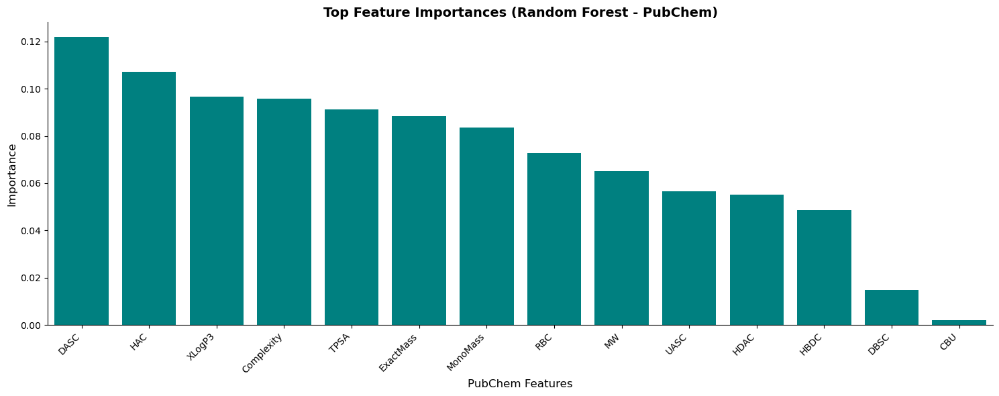

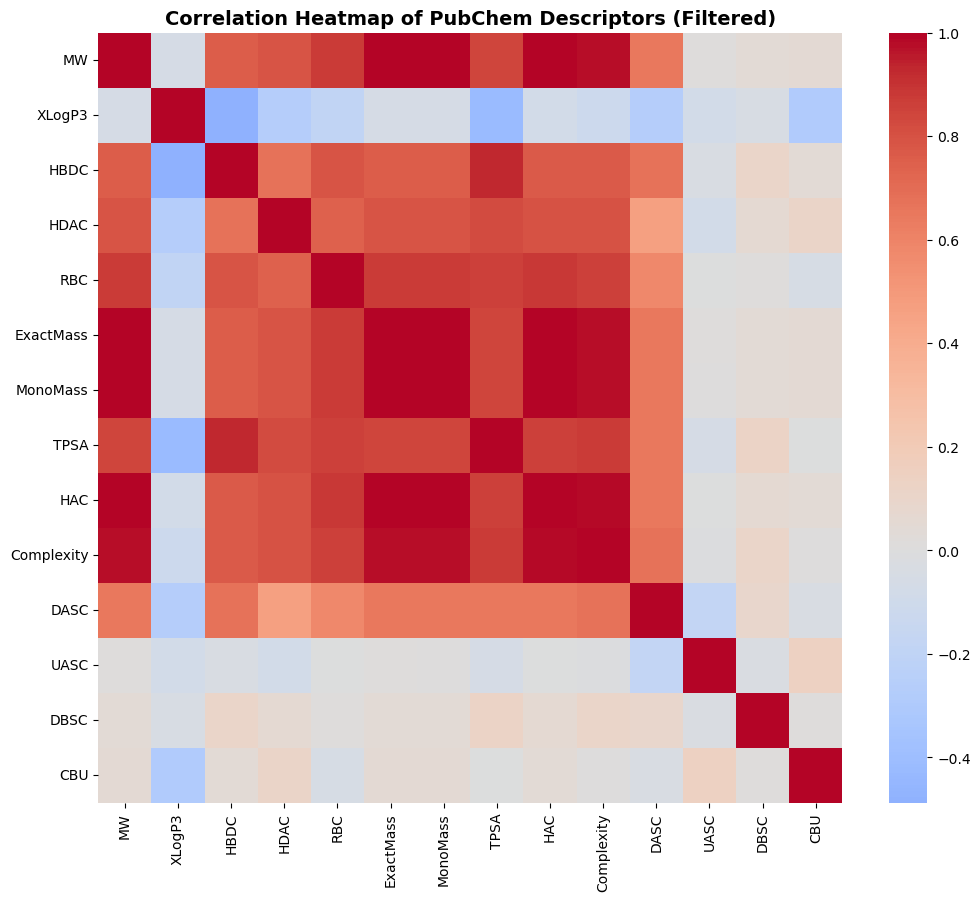

✅ Total features after zero-correlation & zero-importance filtering: 14
✅ Feature importance plot saved at: /Users/janat/Desktop/ppimic50pred/dataset/data/pubchem_feature_importance_filtered.png
✅ Correlation heatmap saved at: /Users/janat/Desktop/ppimic50pred/dataset/data/pubchem_correlation_heatmap_filtered.png


In [94]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import warnings
import re
import os

# ============================
# Suppress warnings
# ============================
warnings.filterwarnings(
    "ignore",
    message=re.escape("overflow encountered in cast"),
    category=RuntimeWarning,
)

# ============================
# Step 1: Prepare Data
# ============================
y = pubchem_train['log_ic50']

drop_cols = ['target_chembl_id', 'target_name', 'ic50_value', 'chembl_id', 'log_ic50', 'CID']
X = pubchem_train.drop(columns=[col for col in drop_cols if col in pubchem_train.columns])

# Clean and convert features
X = X.replace(r'^\s*$', np.nan, regex=True).apply(pd.to_numeric, errors='coerce')
X = X.fillna(X.mean())

# ============================
# Step 1b: Filter features with zero correlation with target
# ============================
corr_with_target = X.corrwith(y)
nonzero_corr_features = corr_with_target[corr_with_target != 0].index
X_filtered = X[nonzero_corr_features]

# Split into train and validation
X_train, X_val, y_train, y_val = train_test_split(X_filtered, y, test_size=0.2, random_state=42)

# ============================
# Step 2: Train Random Forest
# ============================
rf = RandomForestRegressor(**rf_best_params)
rf.fit(X_train, y_train)

# ============================
# Step 3: Filter features with zero importance
# ============================
importances = rf.feature_importances_
nonzero_imp_mask = importances > 0
X_selected = X_filtered.loc[:, nonzero_imp_mask]
feature_names = X_selected.columns
importances_selected = importances[nonzero_imp_mask]

# Optionally select top N features (e.g., 10–14)
top_n = min(len(feature_names), 14)
sorted_idx = np.argsort(importances_selected)[::-1][:top_n]
features_top = feature_names[sorted_idx]
importances_top = importances_selected[sorted_idx]

# ============================
# Step 4: Plot and Save Feature Importances
# ============================
fig, ax = plt.subplots(figsize=(15, 6))
ax.bar(np.arange(top_n), importances_top, color="teal", align="center")

ax.set_xlim(-0.5, top_n - 0.5)
ax.set_xticks(np.arange(top_n))
ax.set_xticklabels(features_top, rotation=45, ha="right", fontsize=10)
ax.set_ylabel("Importance", fontsize=12)
ax.set_xlabel("PubChem Features", fontsize=12)
ax.set_title("Top Feature Importances (Random Forest - PubChem)", fontsize=14, weight="bold")
ax.set_ylim(bottom=0)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
output_dir = "/Users/janat/Desktop/ppimic50pred/dataset/data"
os.makedirs(output_dir, exist_ok=True)
fi_plot_path = os.path.join(output_dir, "pubchem_feature_importance_filtered.png")
plt.savefig(fi_plot_path, dpi=300)
plt.show()

# ============================
# Step 5: Plot and Save Correlation Heatmap (color only)
# ============================
corr_matrix = X_selected.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap="coolwarm", center=0, annot=False)  # annot=False removes numbers
plt.title("Correlation Heatmap of PubChem Descriptors (Filtered)", fontsize=14, weight="bold")

corr_plot_path = os.path.join(output_dir, "pubchem_correlation_heatmap_filtered.png")
plt.savefig(corr_plot_path, dpi=300)
plt.show()

# ============================
# Step 6: Summary
# ============================
print(f"✅ Total features after zero-correlation & zero-importance filtering: {len(features_top)}")
print(f"✅ Feature importance plot saved at: {fi_plot_path}")
print(f"✅ Correlation heatmap saved at: {corr_plot_path}")


In [102]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader, random_split

# === Metrics ===
def medape(y_true, y_pred, epsilon=1e-3):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true > epsilon
    return np.median(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100 if np.sum(mask) else np.nan

def smape(y_true, y_pred, epsilon=1e-3):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2.0
    denominator = np.where(denominator < epsilon, epsilon, denominator)
    return np.mean(np.abs(y_true - y_pred) / denominator) * 100

# === LSTM ===
class LSTMRegressor(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=2, activation='relu'):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.activation = {'relu': nn.ReLU(), 'tanh': nn.Tanh(), 'sigmoid': nn.Sigmoid(),
                           'leaky_relu': nn.LeakyReLU()}.get(activation)
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = out[:, -1, :]
        return self.fc(self.activation(out)) if self.activation else self.fc(out)

def train_model(model, train_loader, val_loader, epochs=200, patience=20, lr=0.001):
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    best_loss, best_state, patience_counter = float('inf'), None, 0

    for epoch in range(epochs):
        model.train()
        for xb, yb in train_loader:
            optimizer.zero_grad()
            loss = criterion(model(xb), yb)
            loss.backward()
            optimizer.step()

        model.eval()
        val_loss = np.mean([criterion(model(xb), yb).item() for xb, yb in val_loader])
        if val_loss < best_loss:
            best_loss, best_state = val_loss, model.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break

    model.load_state_dict(best_state)
    return model

# === Selected Features from RF Importance ===
selected_features = list(features_top)  # from previous RF importance step

# === Prepare Training Set ===
y_train_set = pubchem_train['log_ic50']
X_train_set = pubchem_train[selected_features].copy()
X_train_set = X_train_set.replace(r'^\s*$', np.nan, regex=True).apply(pd.to_numeric, errors='coerce').fillna(X_train_set.mean())

# === Prepare Blind Set ===
X_blind_set = pubchem_blind[selected_features].copy()
X_blind_set = X_blind_set.replace(r'^\s*$', np.nan, regex=True).apply(pd.to_numeric, errors='coerce').fillna(X_blind_set.mean())
y_blind_set = pubchem_blind['log_ic50']

# === Models ===
models = {
    'Random Forest': RandomForestRegressor(**rf_best_params),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=200, random_state=42),
    'SVM': SVR(),
    'LSTM (PyTorch)': None
}

metrics = ['RMSE', 'MSE', 'R²', 'MedAPE', 'SMAPE']

# === Cross-validation and Blind Evaluation ===
for k in range(2, 11):
    print(f"\n--- {k}-Fold Cross Validation ---")
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    scores = {metric: {m: [] for m in models} for metric in metrics}

    for train_idx, test_idx in kf.split(X_train_set):
        X_train, X_test = X_train_set.iloc[train_idx].values, X_train_set.iloc[test_idx].values
        y_train, y_test = y_train_set.iloc[train_idx].values, y_train_set.iloc[test_idx].values

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # === Train classical models ===
        for name, model in models.items():
            if name == 'LSTM (PyTorch)':
                continue
            model.fit(X_train_scaled, y_train)
            y_pred = np.maximum(model.predict(X_test_scaled), 0)
            scores['RMSE'][name].append(np.sqrt(mean_squared_error(y_test, y_pred)))
            scores['MSE'][name].append(mean_squared_error(y_test, y_pred))
            scores['R²'][name].append(r2_score(y_test, y_pred))
            scores['MedAPE'][name].append(medape(y_test, y_pred))
            scores['SMAPE'][name].append(smape(np.expm1(y_test), np.expm1(y_pred)))

        # === Train LSTM ===
        X_train_seq = X_train_scaled.reshape(-1, 1, X_train_scaled.shape[1])
        X_test_seq = X_test_scaled.reshape(-1, 1, X_test_scaled.shape[1])

        train_tensor = torch.tensor(X_train_seq, dtype=torch.float32)
        test_tensor = torch.tensor(X_test_seq, dtype=torch.float32)
        y_train_tensor = torch.tensor(y_train.reshape(-1, 1), dtype=torch.float32)
        y_test_tensor = torch.tensor(y_test.reshape(-1, 1), dtype=torch.float32)

        train_ds, val_ds = random_split(TensorDataset(train_tensor, y_train_tensor),
                                        [int(0.8*len(train_tensor)), len(train_tensor)-int(0.8*len(train_tensor))])
        train_loader = DataLoader(train_ds, batch_size=lstm_best_params['batch_size'], shuffle=True)
        val_loader = DataLoader(val_ds, batch_size=lstm_best_params['batch_size'])

        lstm = LSTMRegressor(input_size=train_tensor.shape[2],
                             hidden_size=lstm_best_params['hidden_size'],
                             num_layers=lstm_best_params['num_layers'],
                             activation=lstm_best_params['activation'])
        lstm = train_model(lstm, train_loader, val_loader, lr=lstm_best_params['learning_rate'])
        lstm.eval()
        with torch.no_grad():
            y_pred_lstm = torch.clamp(lstm(test_tensor), min=0).squeeze().numpy()

        scores['RMSE']['LSTM (PyTorch)'].append(np.sqrt(mean_squared_error(y_test, y_pred_lstm)))
        scores['MSE']['LSTM (PyTorch)'].append(mean_squared_error(y_test, y_pred_lstm))
        scores['R²']['LSTM (PyTorch)'].append(r2_score(y_test, y_pred_lstm))
        scores['MedAPE']['LSTM (PyTorch)'].append(medape(y_test, y_pred_lstm))
        scores['SMAPE']['LSTM (PyTorch)'].append(smape(np.expm1(y_test), np.expm1(y_pred_lstm)))

    # === Average Cross-validation Performance ===
    perf_df = pd.DataFrame({
        'Model': list(models.keys()),
        'Avg RMSE': [np.mean(scores['RMSE'][m]) for m in models],
        'Avg MSE': [np.mean(scores['MSE'][m]) for m in models],
        'Avg R²': [np.mean(scores['R²'][m]) for m in models],
        'Avg MedAPE (%)': [np.mean(scores['MedAPE'][m]) for m in models],
        'Avg SMAPE (%)': [np.mean(scores['SMAPE'][m]) for m in models]
    })
    print("\nAverage Cross-Validation Performance:")
    print(perf_df.to_string(index=False, float_format="%.4f"))

    # === Blind Set Evaluation ===
    X_blind_scaled = scaler.transform(X_blind_set.values)
    blind_metrics = {metric: {} for metric in metrics}

    for name, model in models.items():
        if name == 'LSTM (PyTorch)':
            X_blind_seq = X_blind_scaled.reshape(-1, 1, X_blind_scaled.shape[1])
            X_blind_tensor = torch.tensor(X_blind_seq, dtype=torch.float32)
            lstm.eval()
            with torch.no_grad():
                y_blind_pred = torch.clamp(lstm(X_blind_tensor), min=0).squeeze().numpy()
        else:
            y_blind_pred = np.maximum(model.predict(X_blind_scaled), 0)

        blind_metrics['RMSE'][name] = np.sqrt(mean_squared_error(y_blind_set, y_blind_pred))
        blind_metrics['MSE'][name] = mean_squared_error(y_blind_set, y_blind_pred)
        blind_metrics['R²'][name] = r2_score(y_blind_set, y_blind_pred)
        blind_metrics['MedAPE'][name] = medape(y_blind_set, y_blind_pred)
        blind_metrics['SMAPE'][name] = smape(np.expm1(y_blind_set), np.expm1(y_blind_pred))

    blind_df = pd.DataFrame({
        'Model': list(models.keys()),
        'RMSE': [blind_metrics['RMSE'][m] for m in models],
        'MSE': [blind_metrics['MSE'][m] for m in models],
        'R²': [blind_metrics['R²'][m] for m in models],
        'MedAPE (%)': [blind_metrics['MedAPE'][m] for m in models],
        'SMAPE (%)': [blind_metrics['SMAPE'][m] for m in models],
    })
    print(f"\nBlind Set Performance ({k}-Fold trained models):")
    print(blind_df.to_string(index=False, float_format="%.4f"))



--- 2-Fold Cross Validation ---

Average Cross-Validation Performance:
            Model  Avg RMSE  Avg MSE  Avg R²  Avg MedAPE (%)  Avg SMAPE (%)
    Random Forest    0.9620   0.9257  0.6231         22.0566        87.5964
Gradient Boosting    1.0592   1.1223  0.5430         24.2387        91.7826
              SVM    1.1779   1.3877  0.4350         26.4215        94.9156
   LSTM (PyTorch)    1.0911   1.1909  0.5151         24.5366        94.0199

Blind Set Performance (2-Fold trained models):
            Model   RMSE    MSE     R²  MedAPE (%)  SMAPE (%)
    Random Forest 0.9291 0.8633 0.6267     21.4391    83.2682
Gradient Boosting 1.0120 1.0242 0.5572     23.1408    88.7248
              SVM 1.1483 1.3186 0.4299     25.7887    90.6058
   LSTM (PyTorch) 1.0362 1.0737 0.5358     24.2256    89.5527

--- 3-Fold Cross Validation ---

Average Cross-Validation Performance:
            Model  Avg RMSE  Avg MSE  Avg R²  Avg MedAPE (%)  Avg SMAPE (%)
    Random Forest    0.9525   0.9083  0.63


--- 2-Fold Cross Validation ---

Average Cross-Validation Performance:
            Model  Avg RMSE  Avg MSE  Avg R²  Avg MedAPE (%)  Avg SMAPE (%)
    Random Forest    0.9601   0.9221  0.6246         22.0754        87.6358
Gradient Boosting    1.0592   1.1223  0.5430         24.2387        91.7826
              SVM    1.1779   1.3877  0.4350         26.4215        94.9156
   LSTM (PyTorch)    1.0863   1.1800  0.5198         24.9964        94.0644

Blind Set Performance (2-Fold trained models):
            Model   RMSE    MSE     R²  MedAPE (%)  SMAPE (%)
    Random Forest 0.9179 0.8425 0.6357     20.8210    83.0001
Gradient Boosting 1.0120 1.0242 0.5572     23.1408    88.7248
              SVM 1.1483 1.3186 0.4299     25.7887    90.6058
   LSTM (PyTorch) 1.0423 1.0864 0.5302     23.9612    88.6549


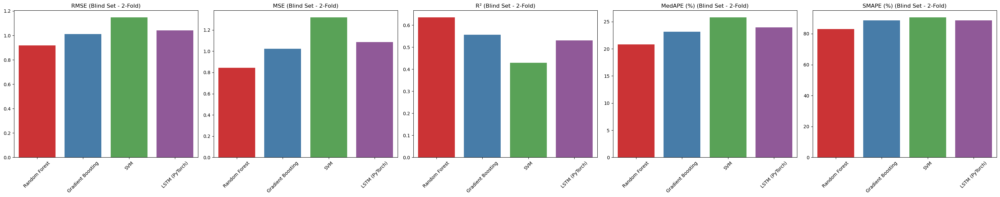


--- 3-Fold Cross Validation ---

Average Cross-Validation Performance:
            Model  Avg RMSE  Avg MSE  Avg R²  Avg MedAPE (%)  Avg SMAPE (%)
    Random Forest    0.9511   0.9057  0.6313         20.6355        86.5498
Gradient Boosting    1.0509   1.1055  0.5500         23.6783        92.2163
              SVM    1.1552   1.3377  0.4564         26.0198        93.9440
   LSTM (PyTorch)    1.0529   1.1115  0.5483         23.1379        90.7429

Blind Set Performance (3-Fold trained models):
            Model   RMSE    MSE     R²  MedAPE (%)  SMAPE (%)
    Random Forest 0.9017 0.8131 0.6484     19.3416    81.6264
Gradient Boosting 0.9750 0.9507 0.5889     21.7969    86.7965
              SVM 1.1325 1.2825 0.4455     24.9998    91.0851
   LSTM (PyTorch) 0.9850 0.9702 0.5805     21.6625    86.0712


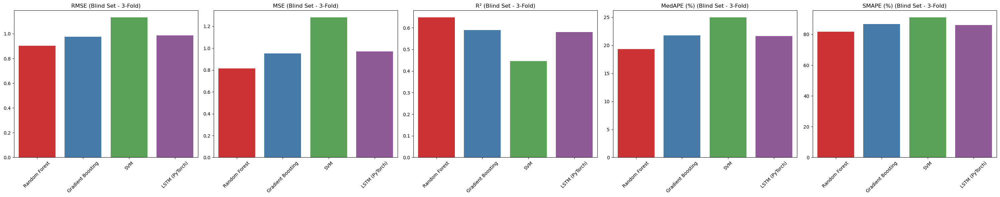


--- 4-Fold Cross Validation ---

Average Cross-Validation Performance:
            Model  Avg RMSE  Avg MSE  Avg R²  Avg MedAPE (%)  Avg SMAPE (%)
    Random Forest    0.9277   0.8613  0.6486         20.5544        85.2066
Gradient Boosting    1.0472   1.0977  0.5522         24.6199        92.2320
              SVM    1.1515   1.3284  0.4580         25.8194        93.7500
   LSTM (PyTorch)    1.0510   1.1061  0.5490         23.6124        91.6535

Blind Set Performance (4-Fold trained models):
            Model   RMSE    MSE     R²  MedAPE (%)  SMAPE (%)
    Random Forest 0.8924 0.7964 0.6556     19.4386    80.9791
Gradient Boosting 0.9792 0.9589 0.5854     23.0535    86.2620
              SVM 1.1338 1.2856 0.4441     25.2926    90.8776
   LSTM (PyTorch) 0.9972 0.9943 0.5701     22.3392    86.6303


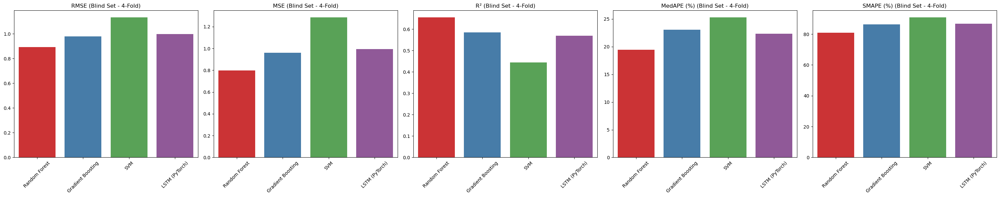


--- 5-Fold Cross Validation ---

Average Cross-Validation Performance:
            Model  Avg RMSE  Avg MSE  Avg R²  Avg MedAPE (%)  Avg SMAPE (%)
    Random Forest    0.9290   0.8645  0.6477         20.5627        84.9027
Gradient Boosting    1.0444   1.0939  0.5543         24.6142        92.2214
              SVM    1.1493   1.3237  0.4612         25.7936        93.4915
   LSTM (PyTorch)    1.0291   1.0609  0.5680         23.1681        91.0268

Blind Set Performance (5-Fold trained models):
            Model   RMSE    MSE     R²  MedAPE (%)  SMAPE (%)
    Random Forest 0.8841 0.7817 0.6620     19.1527    80.5758
Gradient Boosting 0.9917 0.9836 0.5747     22.7855    87.0838
              SVM 1.1397 1.2988 0.4384     25.2972    90.6792
   LSTM (PyTorch) 0.9760 0.9526 0.5881     24.5464    88.4128


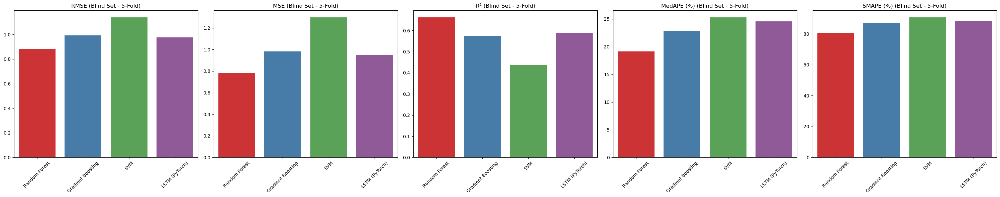


--- 6-Fold Cross Validation ---

Average Cross-Validation Performance:
            Model  Avg RMSE  Avg MSE  Avg R²  Avg MedAPE (%)  Avg SMAPE (%)
    Random Forest    0.9233   0.8540  0.6511         20.6177        84.8328
Gradient Boosting    1.0514   1.1072  0.5480         24.3781        92.5455
              SVM    1.1456   1.3161  0.4635         26.0027        93.4025
   LSTM (PyTorch)    1.0227   1.0501  0.5725         23.4602        90.9577

Blind Set Performance (6-Fold trained models):
            Model   RMSE    MSE     R²  MedAPE (%)  SMAPE (%)
    Random Forest 0.8873 0.7872 0.6596     18.9281    80.1307
Gradient Boosting 0.9935 0.9870 0.5732     23.4599    87.8617
              SVM 1.1314 1.2800 0.4465     24.9547    90.2268
   LSTM (PyTorch) 0.9870 0.9741 0.5788     22.8842    86.2630


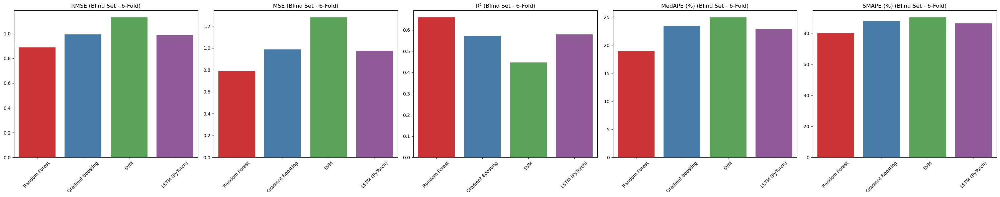


--- 7-Fold Cross Validation ---

Average Cross-Validation Performance:
            Model  Avg RMSE  Avg MSE  Avg R²  Avg MedAPE (%)  Avg SMAPE (%)
    Random Forest    0.9233   0.8539  0.6520         20.1877        84.3274
Gradient Boosting    1.0413   1.0854  0.5574         24.0516        92.2411
              SVM    1.1393   1.3002  0.4702         25.2941        93.0221
   LSTM (PyTorch)    1.0336   1.0689  0.5641         22.5603        91.0673

Blind Set Performance (7-Fold trained models):
            Model   RMSE    MSE     R²  MedAPE (%)  SMAPE (%)
    Random Forest 0.8833 0.7803 0.6626     19.7286    79.7318
Gradient Boosting 0.9878 0.9758 0.5781     22.8658    86.9285
              SVM 1.1320 1.2813 0.4460     24.7950    90.2792
   LSTM (PyTorch) 0.9740 0.9487 0.5898     21.9298    86.0105


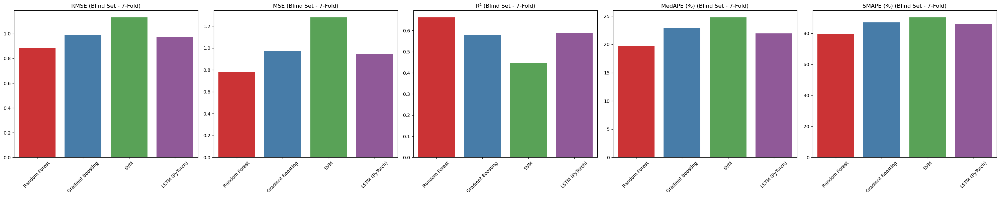


--- 8-Fold Cross Validation ---

Average Cross-Validation Performance:
            Model  Avg RMSE  Avg MSE  Avg R²  Avg MedAPE (%)  Avg SMAPE (%)
    Random Forest    0.9189   0.8463  0.6523         20.0056        84.4682
Gradient Boosting    1.0440   1.0917  0.5515         24.4994        92.3931
              SVM    1.1430   1.3090  0.4634         25.4500        93.2093
   LSTM (PyTorch)    1.0186   1.0403  0.5732         23.3607        91.1184

Blind Set Performance (8-Fold trained models):
            Model   RMSE    MSE     R²  MedAPE (%)  SMAPE (%)
    Random Forest 0.8877 0.7880 0.6593     19.4622    80.9546
Gradient Boosting 1.0035 1.0069 0.5646     22.4221    87.5007
              SVM 1.1303 1.2776 0.4476     24.6660    90.1613
   LSTM (PyTorch) 0.9696 0.9402 0.5935     23.0108    88.2816


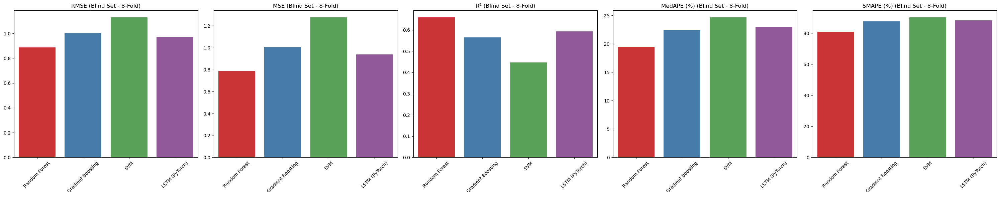


--- 9-Fold Cross Validation ---

Average Cross-Validation Performance:
            Model  Avg RMSE  Avg MSE  Avg R²  Avg MedAPE (%)  Avg SMAPE (%)
    Random Forest    0.9158   0.8420  0.6569         20.2338        84.2093
Gradient Boosting    1.0368   1.0790  0.5604         24.2266        91.9220
              SVM    1.1395   1.3035  0.4700         25.7230        93.1984
   LSTM (PyTorch)    1.0085   1.0216  0.5843         23.1919        90.1031

Blind Set Performance (9-Fold trained models):
            Model   RMSE    MSE     R²  MedAPE (%)  SMAPE (%)
    Random Forest 0.8856 0.7843 0.6609     19.5965    81.1118
Gradient Boosting 0.9902 0.9806 0.5760     22.0524    86.9023
              SVM 1.1311 1.2794 0.4468     24.0113    90.0334
   LSTM (PyTorch) 0.9735 0.9477 0.5902     22.0749    86.8787


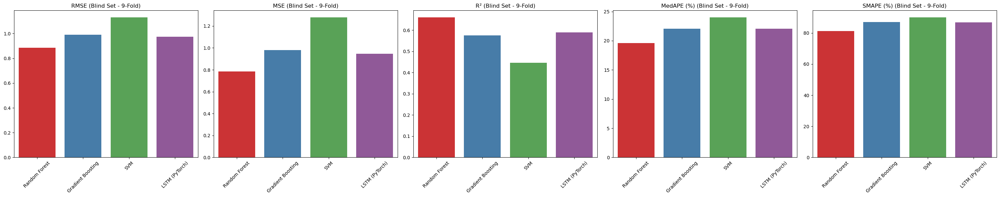


--- 10-Fold Cross Validation ---

Average Cross-Validation Performance:
            Model  Avg RMSE  Avg MSE  Avg R²  Avg MedAPE (%)  Avg SMAPE (%)
    Random Forest    0.9122   0.8367  0.6574         20.4521        84.1491
Gradient Boosting    1.0371   1.0808  0.5577         24.1689        92.2316
              SVM    1.1393   1.3037  0.4668         25.4167        93.0835
   LSTM (PyTorch)    1.0101   1.0282  0.5798         22.7758        89.9684

Blind Set Performance (10-Fold trained models):
            Model   RMSE    MSE     R²  MedAPE (%)  SMAPE (%)
    Random Forest 0.8877 0.7879 0.6593     19.1282    80.5448
Gradient Boosting 0.9925 0.9850 0.5741     23.1634    87.4081
              SVM 1.1289 1.2744 0.4490     24.5147    90.0608
   LSTM (PyTorch) 0.9928 0.9857 0.5738     21.5985    86.8322


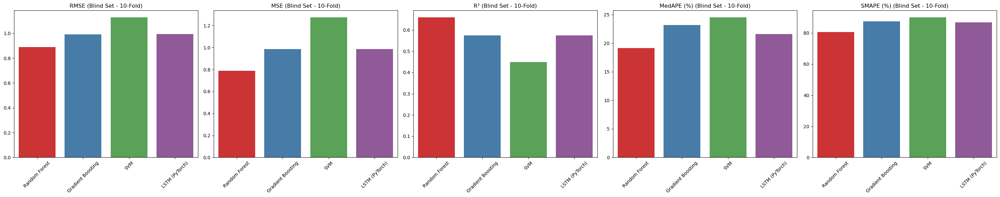

In [103]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader, random_split

# === Metrics ===
def medape(y_true, y_pred, epsilon=1e-3):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true > epsilon
    return np.median(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100 if np.sum(mask) else np.nan

def smape(y_true, y_pred, epsilon=1e-3):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2.0
    denominator = np.where(denominator < epsilon, epsilon, denominator)
    return np.mean(np.abs(y_true - y_pred) / denominator) * 100

# === LSTM Model ===
class LSTMRegressor(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=2, activation='relu'):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.activation = {'relu': nn.ReLU(), 'tanh': nn.Tanh(), 'sigmoid': nn.Sigmoid,
                           'leaky_relu': nn.LeakyReLU()}.get(activation, None)
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = out[:, -1, :]
        return self.fc(self.activation(out)) if self.activation else self.fc(out)

def train_model(model, train_loader, val_loader, epochs=200, patience=20, lr=0.001):
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    best_loss, best_state, patience_counter = float('inf'), None, 0

    for epoch in range(epochs):
        model.train()
        for xb, yb in train_loader:
            optimizer.zero_grad()
            loss = criterion(model(xb), yb)
            loss.backward()
            optimizer.step()

        model.eval()
        val_loss = np.mean([criterion(model(xb), yb).item() for xb, yb in val_loader])
        if val_loss < best_loss:
            best_loss, best_state = val_loss, model.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break

    model.load_state_dict(best_state)
    return model

# === Prepare Training & Blind Sets ===
selected_features = list(features_top)  # From RF importance step

X_train_set = pubchem_train[selected_features].apply(pd.to_numeric, errors='coerce').fillna(pubchem_train[selected_features].mean())
y_train_set = pubchem_train['log_ic50'].values

X_blind_set = pubchem_blind[selected_features].apply(pd.to_numeric, errors='coerce').fillna(pubchem_blind[selected_features].mean())
y_blind_set = pubchem_blind['log_ic50'].values

# === Models ===
models = {
    'Random Forest': RandomForestRegressor(**rf_best_params),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=200, random_state=42),
    'SVM': SVR(),
    'LSTM (PyTorch)': None
}
metrics = ['RMSE', 'MSE', 'R²', 'MedAPE', 'SMAPE']

# === Cross-validation & Blind Evaluation ===
for k in range(2, 11):
    print(f"\n--- {k}-Fold Cross Validation ---")
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    scores = {metric: {m: [] for m in models} for metric in metrics}

    for train_idx, test_idx in kf.split(X_train_set):
        X_train, X_test = X_train_set.iloc[train_idx].values, X_train_set.iloc[test_idx].values
        y_train, y_test = y_train_set[train_idx], y_train_set[test_idx]

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # === Classical models ===
        for name, model in models.items():
            if name == 'LSTM (PyTorch)':
                continue
            model.fit(X_train_scaled, y_train)
            y_pred = np.maximum(model.predict(X_test_scaled), 0)
            scores['RMSE'][name].append(np.sqrt(mean_squared_error(y_test, y_pred)))
            scores['MSE'][name].append(mean_squared_error(y_test, y_pred))
            scores['R²'][name].append(r2_score(y_test, y_pred))
            scores['MedAPE'][name].append(medape(y_test, y_pred))
            scores['SMAPE'][name].append(smape(np.expm1(y_test), np.expm1(y_pred)))

        # === LSTM model ===
        X_train_seq = X_train_scaled.reshape(-1, 1, X_train_scaled.shape[1])
        X_test_seq = X_test_scaled.reshape(-1, 1, X_test_scaled.shape[1])
        train_tensor = torch.tensor(X_train_seq, dtype=torch.float32)
        test_tensor = torch.tensor(X_test_seq, dtype=torch.float32)
        y_train_tensor = torch.tensor(y_train.reshape(-1,1), dtype=torch.float32)
        y_test_tensor = torch.tensor(y_test.reshape(-1,1), dtype=torch.float32)

        train_ds, val_ds = random_split(TensorDataset(train_tensor, y_train_tensor),
                                        [int(0.8*len(train_tensor)), len(train_tensor)-int(0.8*len(train_tensor))])
        train_loader = DataLoader(train_ds, batch_size=lstm_best_params['batch_size'], shuffle=True)
        val_loader = DataLoader(val_ds, batch_size=lstm_best_params['batch_size'])

        lstm = LSTMRegressor(input_size=X_train_scaled.shape[1],
                             hidden_size=lstm_best_params['hidden_size'],
                             num_layers=lstm_best_params['num_layers'],
                             activation=lstm_best_params['activation'])
        lstm = train_model(lstm, train_loader, val_loader, lr=lstm_best_params['learning_rate'])
        lstm.eval()
        with torch.no_grad():
            y_pred_lstm = torch.clamp(lstm(test_tensor), min=0).squeeze().numpy()

        scores['RMSE']['LSTM (PyTorch)'].append(np.sqrt(mean_squared_error(y_test, y_pred_lstm)))
        scores['MSE']['LSTM (PyTorch)'].append(mean_squared_error(y_test, y_pred_lstm))
        scores['R²']['LSTM (PyTorch)'].append(r2_score(y_test, y_pred_lstm))
        scores['MedAPE']['LSTM (PyTorch)'].append(medape(y_test, y_pred_lstm))
        scores['SMAPE']['LSTM (PyTorch)'].append(smape(np.expm1(y_test), np.expm1(y_pred_lstm)))

    # === Average CV Performance ===
    perf_df = pd.DataFrame({
        'Model': list(models.keys()),
        'Avg RMSE': [np.mean(scores['RMSE'][m]) for m in models],
        'Avg MSE': [np.mean(scores['MSE'][m]) for m in models],
        'Avg R²': [np.mean(scores['R²'][m]) for m in models],
        'Avg MedAPE (%)': [np.mean(scores['MedAPE'][m]) for m in models],
        'Avg SMAPE (%)': [np.mean(scores['SMAPE'][m]) for m in models]
    })
    print("\nAverage Cross-Validation Performance:")
    print(perf_df.to_string(index=False, float_format="%.4f"))

    # === Blind Set Evaluation ===
    X_blind_scaled = scaler.transform(X_blind_set.values)
    blind_metrics = {metric:{} for metric in metrics}

    for name, model in models.items():
        if name == 'LSTM (PyTorch)':
            X_blind_seq = X_blind_scaled.reshape(-1,1,X_blind_scaled.shape[1])
            X_blind_tensor = torch.tensor(X_blind_seq, dtype=torch.float32)
            lstm.eval()
            with torch.no_grad():
                y_blind_pred = torch.clamp(lstm(X_blind_tensor), min=0).squeeze().numpy()
        else:
            y_blind_pred = np.maximum(model.predict(X_blind_scaled), 0)

        blind_metrics['RMSE'][name] = np.sqrt(mean_squared_error(y_blind_set, y_blind_pred))
        blind_metrics['MSE'][name] = mean_squared_error(y_blind_set, y_blind_pred)
        blind_metrics['R²'][name] = r2_score(y_blind_set, y_blind_pred)
        blind_metrics['MedAPE'][name] = medape(y_blind_set, y_blind_pred)
        blind_metrics['SMAPE'][name] = smape(np.expm1(y_blind_set), np.expm1(y_blind_pred))

    blind_df = pd.DataFrame({
        'Model': list(models.keys()),
        'RMSE': [blind_metrics['RMSE'][m] for m in models],
        'MSE': [blind_metrics['MSE'][m] for m in models],
        'R²': [blind_metrics['R²'][m] for m in models],
        'MedAPE (%)': [blind_metrics['MedAPE'][m] for m in models],
        'SMAPE (%)': [blind_metrics['SMAPE'][m] for m in models],
    })
    print(f"\nBlind Set Performance ({k}-Fold trained models):")
    print(blind_df.to_string(index=False, float_format="%.4f"))

    # === Plot Blind Set Metrics ===
    fig, axes = plt.subplots(1, 5, figsize=(30, 6))
    for i, metric in enumerate(blind_df.columns[1:]):
        sns.barplot(data=blind_df, x='Model', y=metric, ax=axes[i], palette='Set1')
        axes[i].set_title(f"{metric} (Blind Set - {k}-Fold)", fontsize=12)
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')
    plt.tight_layout()
    plt.show()


In [65]:
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error
import os
import joblib

# =========================
# === Output directory ===
# =========================
output_dir = "/Users/janat/Desktop/ppimic50pred/dataset/data"
os.makedirs(output_dir, exist_ok=True)

# =========================
# === Prepare Data ===
# =========================
drop_cols = ['chembl_id', 'smiles', 'ic50_value', 'log_ic50', 'target_chembl_id', 'target_name']
y = rdkit_train['log_ic50']
X = rdkit_train.drop(columns=[c for c in drop_cols if c in rdkit_train.columns])

# Convert to numeric and handle missing/infinite values
X = X.replace(r'^\s*$', np.nan, regex=True).apply(pd.to_numeric, errors='coerce')
X = X.replace([np.inf, -np.inf], np.nan)
X = X.fillna(X.mean())

# Select filtered features
X_selected = X[features_filtered]

# =========================
# === Standardize Features ===
# =========================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_selected)

# =========================
# === Train Random Forest ===
# =========================
rf = RandomForestRegressor(**rf_best_params)
rf.fit(X_scaled, y)

# Save trained model and scaler
joblib.dump({"model": rf, "scaler": scaler}, os.path.join(output_dir, "rf_model_shap.pkl"))

# =========================
# === Model Performance ===
# =========================
y_pred = rf.predict(X_scaled)
r2 = r2_score(y, y_pred)
rmse = np.sqrt(mean_squared_error(y, y_pred))
print(f"Model Performance on Training Data:\n✅ R² = {r2:.4f}\n✅ RMSE = {rmse:.4f}")

# =========================
# === SHAP Explainer (Tree) ===
# =========================
explainer = shap.TreeExplainer(rf, feature_perturbation="interventional", model_output="raw")
shap_values = explainer.shap_values(X_scaled)  # returns NumPy array

# =========================
# === Compute top 50 features ===
# =========================
mean_abs_shap = np.abs(shap_values).mean(axis=0)
top_idx = np.argsort(mean_abs_shap)[::-1][:50]

X_top = X_selected.iloc[:, top_idx]
shap_values_top = shap_values[:, top_idx]

# =========================
# === Summary Plot (Bar) ===
# =========================
plt.figure(figsize=(12, 8))
shap.summary_plot(shap_values_top, X_top, plot_type="bar", show=False)
plt.title("Top SHAP Feature Importance (RDKit Descriptors)", fontsize=14)
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "shap_top50_bar.png"), dpi=300)
plt.close()

# =========================
# === Beeswarm Plot (Dot) ===
# =========================
plt.figure(figsize=(12, 8))
shap.summary_plot(shap_values_top, X_top, plot_type="dot", show=False)
plt.title("Top SHAP Feature Impact", fontsize=14)
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "shap_top50_beeswarm.png"), dpi=300)
plt.close()

print(f"✅ SHAP analysis for top 50 features completed. Plots saved in: {output_dir}")


Model Performance on Training Data:
✅ R² = 0.9505
✅ RMSE = 0.3473
✅ SHAP analysis for top 50 features completed. Plots saved in: /Users/janat/Desktop/ppimic50pred/dataset/data



Average CV Performance (Random Forest):
Metric    Mean    Std
  RMSE  0.7767 0.0279
   MSE  0.6041 0.0436
    R²  0.7515 0.0165
MedAPE 16.4561 0.7927
 SMAPE 76.3115 3.1937


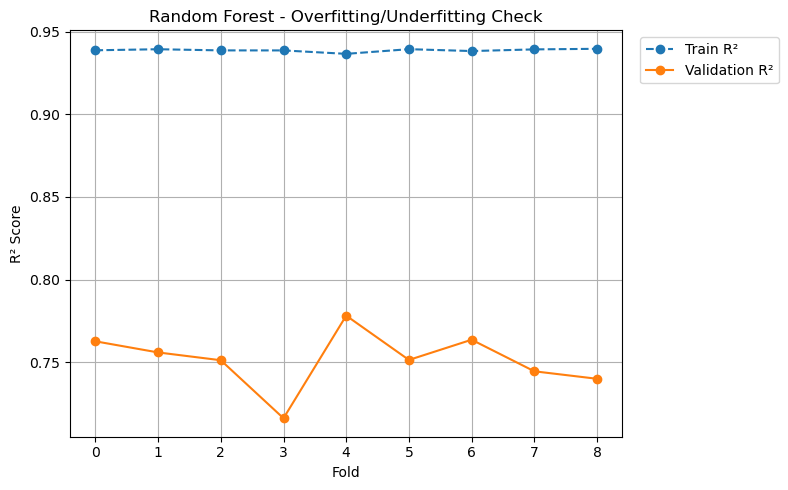

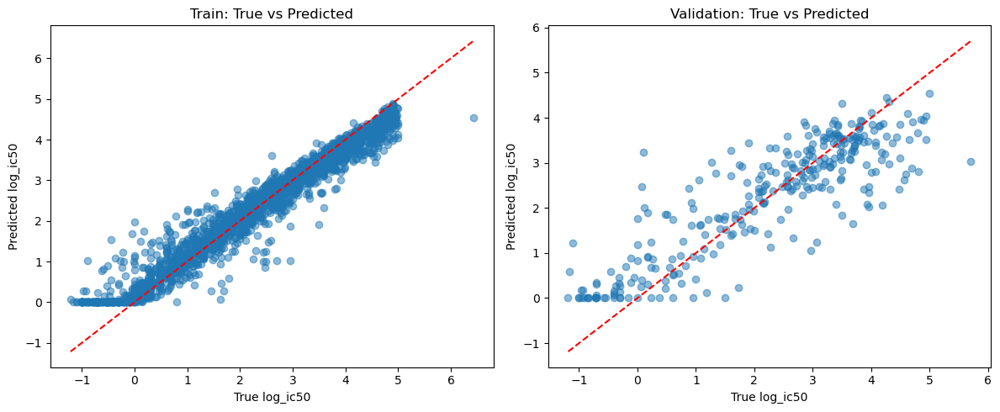


Blind Set Performance:
✅ R² = 0.7371
✅ RMSE = 0.7922


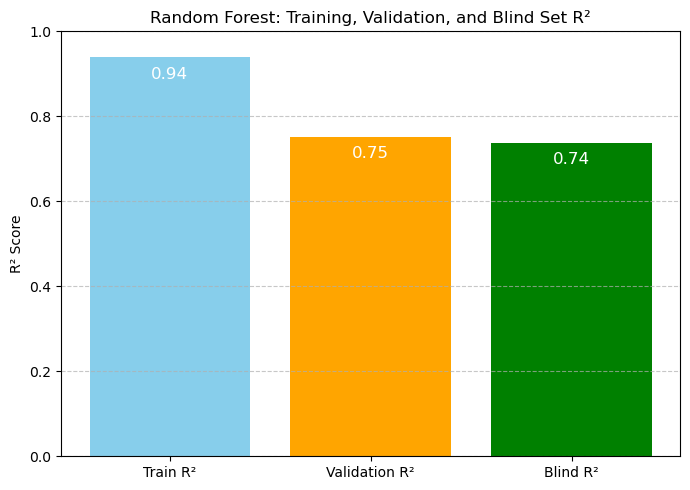

In [72]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import joblib
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# === Output directory ===
output_dir = "/Users/janat/Desktop/ppimic50pred/model"
os.makedirs(output_dir, exist_ok=True)

# === Custom Metrics ===
def medape(y_true, y_pred, epsilon=1e-3):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true > epsilon
    return np.median(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100 if np.sum(mask) else np.nan

def smape(y_true, y_pred, epsilon=1e-3):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    denominator = np.maximum((np.abs(y_true) + np.abs(y_pred)) / 2.0, epsilon)
    return np.mean(np.abs(y_true - y_pred) / denominator) * 100

# === Prepare Data ===
drop_cols = ['chembl_id', 'smiles', 'ic50_value', 'log_ic50', 'target_chembl_id', 'target_name']
y = rdkit_train['log_ic50']
X = rdkit_train.drop(columns=[c for c in drop_cols if c in rdkit_train.columns])
X = X.apply(pd.to_numeric, errors='coerce').replace([np.inf, -np.inf], np.nan).fillna(X.mean())
X_selected = X[features_filtered]

X_blind = rdkit_blind.drop(columns=[c for c in drop_cols if c in rdkit_blind.columns])
X_blind = X_blind.apply(pd.to_numeric, errors='coerce').replace([np.inf, -np.inf], np.nan).fillna(X_blind.mean())
X_blind_selected = X_blind[features_filtered]
y_blind = rdkit_blind['log_ic50']

# === Cross-validation ===
kf = KFold(n_splits=9, shuffle=True, random_state=42)
train_r2_hist, val_r2_hist = [], []
scores = {"RMSE": [], "MSE": [], "R²": [], "MedAPE": [], "SMAPE": []}

for train_idx, val_idx in kf.split(X_selected):
    X_train, X_val = X_selected.iloc[train_idx], X_selected.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    rf = RandomForestRegressor(**rf_best_params)
    rf.fit(X_train_scaled, y_train)

    y_train_pred = np.maximum(rf.predict(X_train_scaled), 0)
    y_val_pred = np.maximum(rf.predict(X_val_scaled), 0)

    train_r2_hist.append(r2_score(y_train, y_train_pred))
    val_r2_hist.append(r2_score(y_val, y_val_pred))

    scores["RMSE"].append(np.sqrt(mean_squared_error(y_val, y_val_pred)))
    scores["MSE"].append(mean_squared_error(y_val, y_val_pred))
    scores["R²"].append(r2_score(y_val, y_val_pred))
    scores["MedAPE"].append(medape(y_val, y_val_pred))
    scores["SMAPE"].append(smape(np.expm1(y_val), np.expm1(y_val_pred)))

# === Average CV Performance ===
perf_df = pd.DataFrame({
    "Metric": list(scores.keys()),
    "Mean": [np.mean(scores[m]) for m in scores],
    "Std": [np.std(scores[m]) for m in scores]
})
print("\nAverage CV Performance (Random Forest):")
print(perf_df.to_string(index=False, float_format="%.4f"))
perf_df.to_csv(os.path.join(output_dir, "cv_performance.csv"), index=False)

# === Retrain final model on full data ===
scaler_final = StandardScaler()
X_scaled_full = scaler_final.fit_transform(X_selected)
rf_final = RandomForestRegressor(**rf_best_params)
rf_final.fit(X_scaled_full, y)

joblib.dump({"model": rf_final, "scaler": scaler_final}, os.path.join(output_dir, "random_forest_model.pkl"))

# === Overfitting/Underfitting Plot ===
plt.figure(figsize=(8, 5))
plt.plot(train_r2_hist, label="Train R²", linestyle='--', marker='o')
plt.plot(val_r2_hist, label="Validation R²", marker='o')
plt.xlabel("Fold")
plt.ylabel("R² Score")
plt.title("Random Forest - Overfitting/Underfitting Check")
plt.legend(loc='upper left', bbox_to_anchor=(1.02, 1))
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "overfitting_underfitting_plot.png"))
plt.show()

# === True vs Predicted Plot (Last Fold) ===
y_train_last, y_val_last = y_train, y_val
y_train_pred_last, y_val_pred_last = y_train_pred, y_val_pred

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(y_train_last, y_train_pred_last, alpha=0.5)
plt.plot([min(y_train_last), max(y_train_last)],
         [min(y_train_last), max(y_train_last)], 'r--')
plt.title("Train: True vs Predicted")
plt.xlabel("True log_ic50")
plt.ylabel("Predicted log_ic50")

plt.subplot(1, 2, 2)
plt.scatter(y_val_last, y_val_pred_last, alpha=0.5)
plt.plot([min(y_val_last), max(y_val_last)],
         [min(y_val_last), max(y_val_last)], 'r--')
plt.title("Validation: True vs Predicted")
plt.xlabel("True log_ic50")
plt.ylabel("Predicted log_ic50")

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "true_vs_predicted.png"))
plt.show()

# === Blind Set Evaluation ===
X_blind_scaled = scaler_final.transform(X_blind_selected)
y_blind_pred = rf_final.predict(X_blind_scaled)
blind_r2 = r2_score(y_blind, y_blind_pred)
blind_rmse = np.sqrt(mean_squared_error(y_blind, y_blind_pred))

print(f"\nBlind Set Performance:\n✅ R² = {blind_r2:.4f}\n✅ RMSE = {blind_rmse:.4f}")

# === Comparative R² Plot ===
r2_scores = [np.mean(train_r2_hist), np.mean(val_r2_hist), blind_r2]
labels = ["Train R²", "Validation R²", "Blind R²"]

plt.figure(figsize=(7, 5))
bars = plt.bar(labels, r2_scores, color=['skyblue', 'orange', 'green'])
plt.ylim(0, 1)
plt.ylabel("R² Score")
plt.title("Random Forest: Training, Validation, and Blind Set R²")

for bar, score in zip(bars, r2_scores):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() - 0.05,
             f"{score:.2f}", ha='center', color='white', fontsize=12)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "r2_comparative_plot.png"))
plt.show()


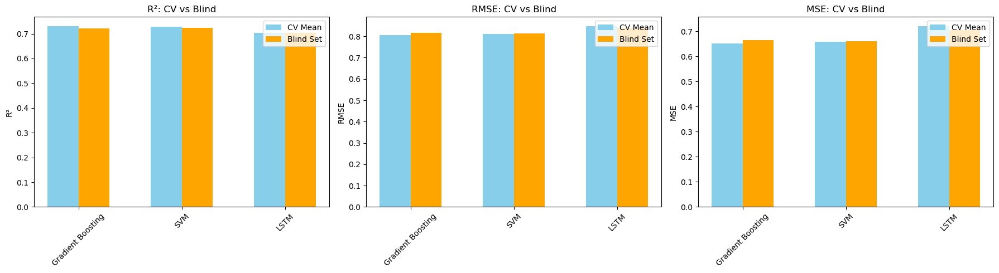

In [76]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader, random_split

# -----------------------------
# Metrics
# -----------------------------
def medape(y_true, y_pred, epsilon=1e-3):
    mask = np.array(y_true) > epsilon
    return np.median(np.abs((np.array(y_true)[mask] - np.array(y_pred)[mask]) / np.array(y_true)[mask])) * 100 if np.sum(mask) else np.nan

def smape(y_true, y_pred, epsilon=1e-3):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    denominator = np.maximum((np.abs(y_true) + np.abs(y_pred)) / 2, epsilon)
    return np.mean(np.abs(y_true - y_pred) / denominator) * 100

# -----------------------------
# LSTM Regressor
# -----------------------------
class LSTMRegressor(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=2, activation='relu'):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        activations = {'relu': nn.ReLU(), 'tanh': nn.Tanh(), 'sigmoid': nn.Sigmoid(), 'leaky_relu': nn.LeakyReLU()}
        self.activation = activations.get(activation, None)
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = out[:, -1, :]
        if self.activation:
            out = self.activation(out)
        return self.fc(out)

def train_lstm(model, train_loader, val_loader, epochs=100, patience=10, lr=0.001):
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    best_loss, patience_counter = float('inf'), 0
    best_state = None

    for epoch in range(epochs):
        model.train()
        for xb, yb in train_loader:
            optimizer.zero_grad()
            loss = criterion(model(xb), yb)
            loss.backward()
            optimizer.step()

        model.eval()
        val_loss = np.mean([criterion(model(xb), yb).item() for xb, yb in val_loader])
        if val_loss < best_loss:
            best_loss, best_state, patience_counter = val_loss, model.state_dict(), 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break

    model.load_state_dict(best_state)
    return model

# -----------------------------
# Prepare Data
# -----------------------------
drop_cols = ['chembl_id','smiles','ic50_value','log_ic50','target_chembl_id','target_name']
y = rdkit_train['log_ic50']
X = rdkit_train.drop(columns=[c for c in drop_cols if c in rdkit_train.columns])
X = X.apply(pd.to_numeric, errors='coerce').fillna(X.mean())
X_selected = X[features_filtered]

X_blind = rdkit_blind.drop(columns=[c for c in drop_cols if c in rdkit_blind.columns])
X_blind = X_blind.apply(pd.to_numeric, errors='coerce').fillna(X_blind.mean())
X_blind_selected = X_blind[features_filtered]
y_blind = rdkit_blind['log_ic50']

# -----------------------------
# Define Models
# -----------------------------
models = {
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=200, random_state=42),
    'SVM': SVR(),
    'LSTM': None
}

metrics_to_plot = ['R²','RMSE','MSE']
cv_scores = {m: {metric: [] for metric in metrics_to_plot} for m in models}

kf = KFold(n_splits=9, shuffle=True, random_state=42)

# -----------------------------
# Cross-Validation
# -----------------------------
for train_idx, val_idx in kf.split(X_selected):
    X_train, X_val = X_selected.iloc[train_idx], X_selected.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    # --- Classic models ---
    for name, model in models.items():
        if name == 'LSTM':
            continue
        model.fit(X_train_scaled, y_train)
        y_pred = np.maximum(model.predict(X_val_scaled), 0)
        cv_scores[name]['R²'].append(r2_score(y_val, y_pred))
        cv_scores[name]['RMSE'].append(np.sqrt(mean_squared_error(y_val, y_pred)))
        cv_scores[name]['MSE'].append(mean_squared_error(y_val, y_pred))

    # --- LSTM ---
    X_train_seq = X_train_scaled.reshape(-1,1,X_train_scaled.shape[1])
    X_val_seq = X_val_scaled.reshape(-1,1,X_val_scaled.shape[1])
    train_tensor = torch.tensor(X_train_seq, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train.values.reshape(-1,1), dtype=torch.float32)
    val_tensor = torch.tensor(X_val_seq, dtype=torch.float32)
    y_val_tensor = torch.tensor(y_val.values.reshape(-1,1), dtype=torch.float32)

    train_ds, val_ds = random_split(TensorDataset(train_tensor, y_train_tensor),
                                    [int(0.8*len(train_tensor)), len(train_tensor)-int(0.8*len(train_tensor))])
    train_loader = DataLoader(train_ds, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=16)

    lstm = LSTMRegressor(input_size=X_train_scaled.shape[1], hidden_size=64, num_layers=2)
    lstm = train_lstm(lstm, train_loader, val_loader)
    lstm.eval()
    with torch.no_grad():
        y_val_pred = torch.clamp(lstm(val_tensor), min=0).squeeze().numpy()

    cv_scores['LSTM']['R²'].append(r2_score(y_val, y_val_pred))
    cv_scores['LSTM']['RMSE'].append(np.sqrt(mean_squared_error(y_val, y_val_pred)))
    cv_scores['LSTM']['MSE'].append(mean_squared_error(y_val, y_val_pred))

# -----------------------------
# Blind set evaluation
# -----------------------------
blind_scores = {}
scaler = StandardScaler().fit(X_selected)
X_blind_scaled = scaler.transform(X_blind_selected)

for name, model in models.items():
    if name == 'LSTM':
        X_blind_seq = X_blind_scaled.reshape(-1,1,X_blind_scaled.shape[1])
        X_blind_tensor = torch.tensor(X_blind_seq, dtype=torch.float32)
        lstm.eval()
        with torch.no_grad():
            y_pred_blind = torch.clamp(lstm(X_blind_tensor), min=0).squeeze().numpy()
    else:
        model.fit(scaler.transform(X_selected), y)
        y_pred_blind = np.maximum(model.predict(X_blind_scaled), 0)
    blind_scores[name] = {
        'R²': r2_score(y_blind, y_pred_blind),
        'RMSE': np.sqrt(mean_squared_error(y_blind, y_pred_blind)),
        'MSE': mean_squared_error(y_blind, y_pred_blind)
    }

# -----------------------------
# Plot CV vs Blind
# -----------------------------
fig, axes = plt.subplots(1, 3, figsize=(18,5))
for i, metric in enumerate(metrics_to_plot):
    cv_mean = [np.mean(cv_scores[m][metric]) for m in models]
    blind_val = [blind_scores[m][metric] for m in models]
    x = np.arange(len(models))
    axes[i].bar(x-0.15, cv_mean, width=0.3, label='CV Mean', color='skyblue')
    axes[i].bar(x+0.15, blind_val, width=0.3, label='Blind Set', color='orange')
    axes[i].set_xticks(x)
    axes[i].set_xticklabels(models.keys(), rotation=45)
    axes[i].set_ylabel(metric)
    axes[i].set_title(f"{metric}: CV vs Blind")
    axes[i].legend()
plt.tight_layout()
plt.show()


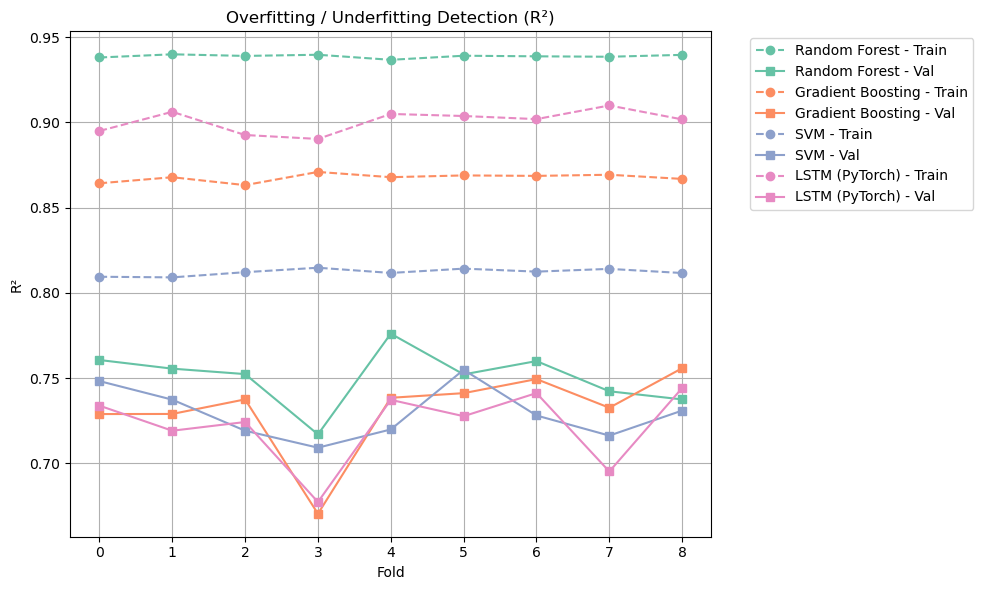

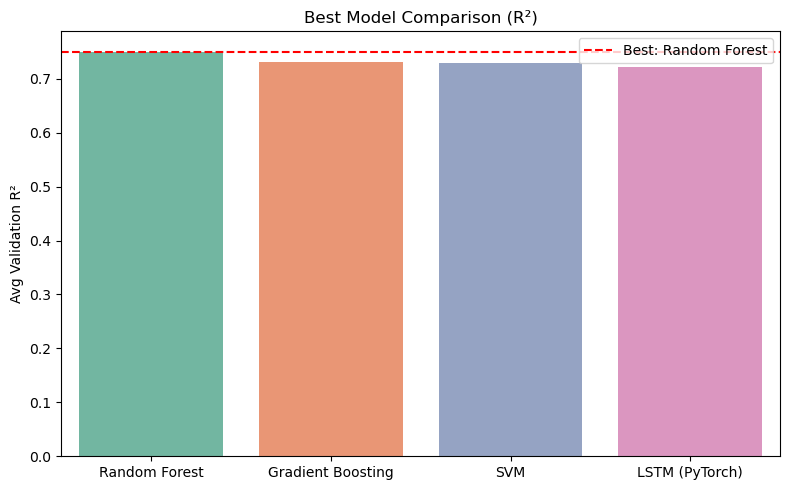

In [82]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader, random_split

# === Metrics ===
def medape(y_true, y_pred, epsilon=1e-3):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true > epsilon
    if np.sum(mask) == 0:
        return np.nan
    return np.median(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

def smape(y_true, y_pred, epsilon=1e-3):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2.0
    denominator = np.where(denominator < epsilon, epsilon, denominator)
    return np.mean(np.abs(y_true - y_pred) / denominator) * 100

# === LSTM model ===
class LSTMRegressor(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=2, activation='relu'):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        activations = {
            'relu': nn.ReLU(),
            'tanh': nn.Tanh(),
            'sigmoid': nn.Sigmoid(),
            'leaky_relu': nn.LeakyReLU()
        }
        self.activation = activations.get(activation, None)
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = out[:, -1, :]
        out = self.activation(out) if self.activation else out
        return self.fc(out)

def train_model(model, train_loader, val_loader, epochs=200, patience=20, lr=0.001):
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    best_loss = float('inf')
    best_state = None
    patience_counter = 0

    for epoch in range(epochs):
        model.train()
        for xb, yb in train_loader:
            optimizer.zero_grad()
            loss = criterion(model(xb), yb)
            loss.backward()
            optimizer.step()

        model.eval()
        val_losses = []
        with torch.no_grad():
            for xb, yb in val_loader:
                val_loss = criterion(model(xb), yb)
                val_losses.append(val_loss.item())
        avg_val_loss = np.mean(val_losses)

        if avg_val_loss < best_loss:
            best_loss = avg_val_loss
            best_state = model.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break

    model.load_state_dict(best_state)
    return model

# === Prepare Data ===
y = rdkit_train['log_ic50']
X = rdkit_train.drop(columns=[col for col in drop_cols if col in rdkit_train.columns])
X = X.replace(r'^\s*$', np.nan, regex=True).apply(pd.to_numeric, errors='coerce').fillna(X.mean())
X_selected = X[features_filtered]

X_blind = rdkit_blind.drop(columns=[col for col in drop_cols if col in rdkit_blind.columns])
X_blind = X_blind.replace(r'^\s*$', np.nan, regex=True).apply(pd.to_numeric, errors='coerce').fillna(X_blind.mean())
X_blind_selected = X_blind[features_filtered]

# === Models ===
models = {
    'Random Forest': RandomForestRegressor(**rf_best_params),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=200, random_state=42),
    'SVM': SVR(),
    'LSTM (PyTorch)': None
}

metrics = ['RMSE', 'MSE', 'R²', 'MedAPE', 'SMAPE']

# === Cross-validation ===
kf = KFold(n_splits=9, shuffle=True, random_state=42)
scores = {metric: {m: [] for m in models} for metric in metrics}

# Histories for plotting
train_r2_hist = {m: [] for m in models}
val_r2_hist = {m: [] for m in models}

for train_idx, test_idx in kf.split(X_selected):
    X_train, X_test = X_selected.iloc[train_idx], X_selected.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # === Train ML models ===
    for name, model in models.items():
        if name == 'LSTM (PyTorch)':
            continue
        model.fit(X_train_scaled, y_train)
        y_train_pred = np.maximum(model.predict(X_train_scaled), 0)
        y_val_pred = np.maximum(model.predict(X_test_scaled), 0)

        r2_train = r2_score(y_train, y_train_pred)
        r2_val = r2_score(y_test, y_val_pred)

        train_r2_hist[name].append(r2_train)
        val_r2_hist[name].append(r2_val)

        # Save scores
        scores['R²'][name].append(r2_val)
        scores['RMSE'][name].append(np.sqrt(mean_squared_error(y_test, y_val_pred)))
        scores['MSE'][name].append(mean_squared_error(y_test, y_val_pred))
        scores['MedAPE'][name].append(medape(y_test, y_val_pred))
        scores['SMAPE'][name].append(smape(np.expm1(y_test), np.expm1(y_val_pred)))

    # === LSTM model ===
    X_train_seq = X_train_scaled.reshape(-1, 1, X_train_scaled.shape[1])
    X_test_seq = X_test_scaled.reshape(-1, 1, X_test_scaled.shape[1])

    train_tensor = torch.tensor(X_train_seq, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train.values.reshape(-1, 1), dtype=torch.float32)
    test_tensor = torch.tensor(X_test_seq, dtype=torch.float32)
    y_test_tensor = torch.tensor(y_test.values.reshape(-1, 1), dtype=torch.float32)

    train_ds, val_ds = random_split(
        TensorDataset(train_tensor, y_train_tensor),
        [int(0.8 * len(train_tensor)), len(train_tensor) - int(0.8 * len(train_tensor))]
    )
    train_loader = DataLoader(train_ds, batch_size=lstm_best_params['batch_size'], shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=lstm_best_params['batch_size'])

    lstm = LSTMRegressor(
        input_size=train_tensor.shape[2],
        hidden_size=lstm_best_params['hidden_size'],
        num_layers=lstm_best_params['num_layers'],
        activation=lstm_best_params['activation']
    )
    lstm = train_model(lstm, train_loader, val_loader, lr=lstm_best_params['learning_rate'])
    lstm.eval()

    with torch.no_grad():
        y_train_pred_lstm = torch.clamp(lstm(train_tensor), min=0).squeeze().numpy()
        y_val_pred_lstm = torch.clamp(lstm(test_tensor), min=0).squeeze().numpy()

    train_r2_hist['LSTM (PyTorch)'].append(r2_score(y_train, y_train_pred_lstm))
    val_r2_hist['LSTM (PyTorch)'].append(r2_score(y_test, y_val_pred_lstm))

    scores['R²']['LSTM (PyTorch)'].append(r2_score(y_test, y_val_pred_lstm))
    scores['RMSE']['LSTM (PyTorch)'].append(np.sqrt(mean_squared_error(y_test, y_val_pred_lstm)))
    scores['MSE']['LSTM (PyTorch)'].append(mean_squared_error(y_test, y_val_pred_lstm))
    scores['MedAPE']['LSTM (PyTorch)'].append(medape(y_test, y_val_pred_lstm))
    scores['SMAPE']['LSTM (PyTorch)'].append(smape(np.expm1(y_test), np.expm1(y_val_pred_lstm)))

# === Plot Overfitting / Underfitting (R²) ===
plt.figure(figsize=(10, 6))
colors = sns.color_palette("Set2", n_colors=len(models))

for i, model in enumerate(models):
    color = colors[i]
    plt.plot(train_r2_hist[model], linestyle='--', marker='o', color=color, label=f"{model} - Train")
    plt.plot(val_r2_hist[model], linestyle='-', marker='s', color=color, label=f"{model} - Val")

plt.xlabel("Fold")
plt.ylabel("R²")
plt.title("Overfitting / Underfitting Detection (R²)")
plt.grid(True)
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

# === Best Model Plot (Avg Validation R²) ===
avg_val_r2 = {m: np.mean(scores['R²'][m]) for m in models}
best_model = max(avg_val_r2, key=avg_val_r2.get)

plt.figure(figsize=(8, 5))
sns.barplot(x=list(avg_val_r2.keys()), y=list(avg_val_r2.values()), palette='Set2')
plt.axhline(avg_val_r2[best_model], color='red', linestyle='--', label=f"Best: {best_model}")
plt.ylabel("Avg Validation R²")
plt.title("Best Model Comparison (R²)")
plt.legend()
plt.tight_layout()
plt.show()


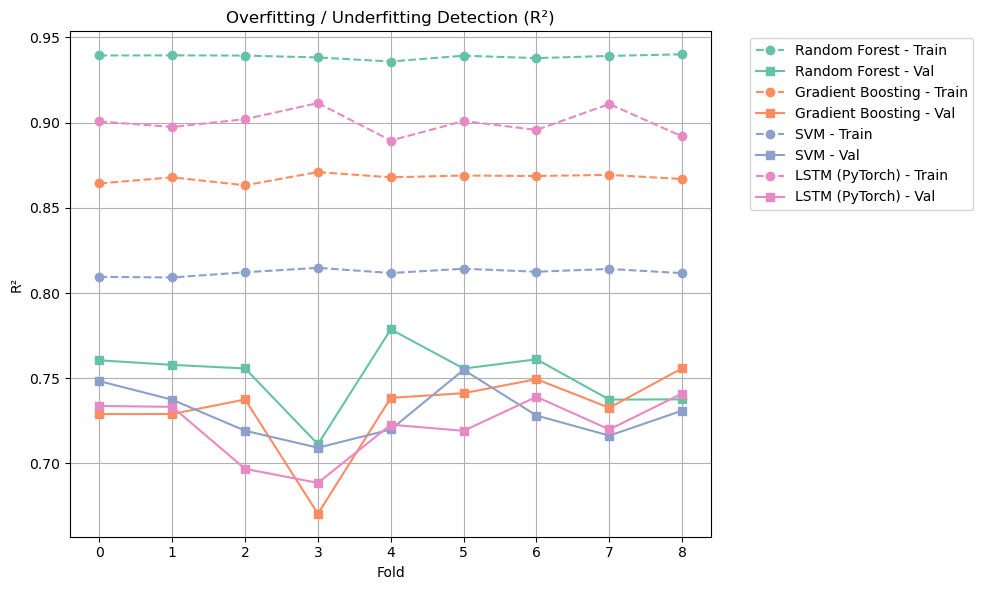

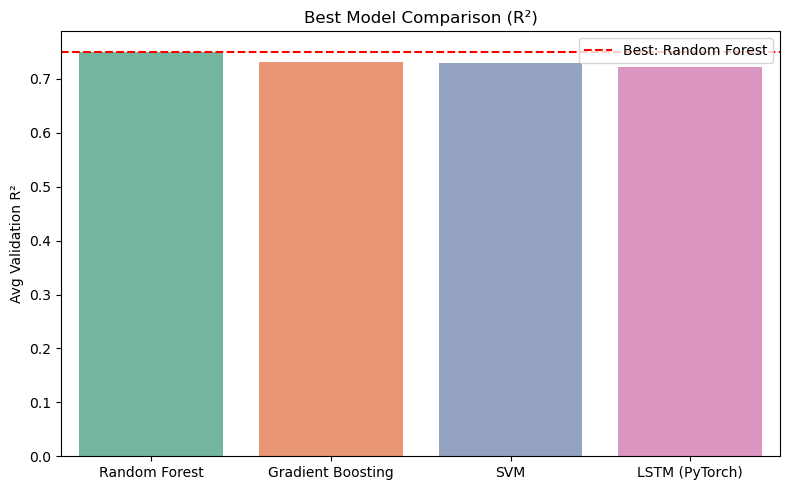

In [83]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader, random_split

# === Metrics ===
def medape(y_true, y_pred, epsilon=1e-3):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true > epsilon
    if np.sum(mask) == 0:
        return np.nan
    return np.median(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

def smape(y_true, y_pred, epsilon=1e-3):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2.0
    denominator = np.where(denominator < epsilon, epsilon, denominator)
    return np.mean(np.abs(y_true - y_pred) / denominator) * 100

# === LSTM model ===
class LSTMRegressor(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=2, activation='relu'):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        activations = {
            'relu': nn.ReLU(),
            'tanh': nn.Tanh(),
            'sigmoid': nn.Sigmoid(),
            'leaky_relu': nn.LeakyReLU()
        }
        self.activation = activations.get(activation, None)
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = out[:, -1, :]
        out = self.activation(out) if self.activation else out
        return self.fc(out)

def train_model(model, train_loader, val_loader, epochs=200, patience=20, lr=0.001):
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    best_loss = float('inf')
    best_state = None
    patience_counter = 0

    for epoch in range(epochs):
        model.train()
        for xb, yb in train_loader:
            optimizer.zero_grad()
            loss = criterion(model(xb), yb)
            loss.backward()
            optimizer.step()

        model.eval()
        val_losses = []
        with torch.no_grad():
            for xb, yb in val_loader:
                val_loss = criterion(model(xb), yb)
                val_losses.append(val_loss.item())
        avg_val_loss = np.mean(val_losses)

        if avg_val_loss < best_loss:
            best_loss = avg_val_loss
            best_state = model.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break

    model.load_state_dict(best_state)
    return model

# === Prepare Data ===
y = rdkit_train['log_ic50']
X = rdkit_train.drop(columns=[col for col in drop_cols if col in rdkit_train.columns])
X = X.replace(r'^\s*$', np.nan, regex=True).apply(pd.to_numeric, errors='coerce').fillna(X.mean())
X_selected = X[features_filtered]

X_blind = rdkit_blind.drop(columns=[col for col in drop_cols if col in rdkit_blind.columns])
X_blind = X_blind.replace(r'^\s*$', np.nan, regex=True).apply(pd.to_numeric, errors='coerce').fillna(X_blind.mean())
X_blind_selected = X_blind[features_filtered]

# === Models ===
models = {
    'Random Forest': RandomForestRegressor(**rf_best_params),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=200, random_state=42),
    'SVM': SVR(),
    'LSTM (PyTorch)': None
}

metrics = ['RMSE', 'MSE', 'R²', 'MedAPE', 'SMAPE']

# === Cross-validation ===
kf = KFold(n_splits=9, shuffle=True, random_state=42)
scores = {metric: {m: [] for m in models} for metric in metrics}

# Histories for plotting
train_r2_hist = {m: [] for m in models}
val_r2_hist = {m: [] for m in models}

for train_idx, test_idx in kf.split(X_selected):
    X_train, X_test = X_selected.iloc[train_idx], X_selected.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # === Train ML models ===
    for name, model in models.items():
        if name == 'LSTM (PyTorch)':
            continue
        model.fit(X_train_scaled, y_train)
        y_train_pred = np.maximum(model.predict(X_train_scaled), 0)
        y_val_pred = np.maximum(model.predict(X_test_scaled), 0)

        r2_train = r2_score(y_train, y_train_pred)
        r2_val = r2_score(y_test, y_val_pred)

        train_r2_hist[name].append(r2_train)
        val_r2_hist[name].append(r2_val)

        # Save scores
        scores['R²'][name].append(r2_val)
        scores['RMSE'][name].append(np.sqrt(mean_squared_error(y_test, y_val_pred)))
        scores['MSE'][name].append(mean_squared_error(y_test, y_val_pred))
        scores['MedAPE'][name].append(medape(y_test, y_val_pred))
        scores['SMAPE'][name].append(smape(np.expm1(y_test), np.expm1(y_val_pred)))

    # === LSTM model ===
    X_train_seq = X_train_scaled.reshape(-1, 1, X_train_scaled.shape[1])
    X_test_seq = X_test_scaled.reshape(-1, 1, X_test_scaled.shape[1])

    train_tensor = torch.tensor(X_train_seq, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train.values.reshape(-1, 1), dtype=torch.float32)
    test_tensor = torch.tensor(X_test_seq, dtype=torch.float32)
    y_test_tensor = torch.tensor(y_test.values.reshape(-1, 1), dtype=torch.float32)

    train_ds, val_ds = random_split(
        TensorDataset(train_tensor, y_train_tensor),
        [int(0.8 * len(train_tensor)), len(train_tensor) - int(0.8 * len(train_tensor))]
    )
    train_loader = DataLoader(train_ds, batch_size=lstm_best_params['batch_size'], shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=lstm_best_params['batch_size'])

    lstm = LSTMRegressor(
        input_size=train_tensor.shape[2],
        hidden_size=lstm_best_params['hidden_size'],
        num_layers=lstm_best_params['num_layers'],
        activation=lstm_best_params['activation']
    )
    lstm = train_model(lstm, train_loader, val_loader, lr=lstm_best_params['learning_rate'])
    lstm.eval()

    with torch.no_grad():
        y_train_pred_lstm = torch.clamp(lstm(train_tensor), min=0).squeeze().numpy()
        y_val_pred_lstm = torch.clamp(lstm(test_tensor), min=0).squeeze().numpy()

    train_r2_hist['LSTM (PyTorch)'].append(r2_score(y_train, y_train_pred_lstm))
    val_r2_hist['LSTM (PyTorch)'].append(r2_score(y_test, y_val_pred_lstm))

    scores['R²']['LSTM (PyTorch)'].append(r2_score(y_test, y_val_pred_lstm))
    scores['RMSE']['LSTM (PyTorch)'].append(np.sqrt(mean_squared_error(y_test, y_val_pred_lstm)))
    scores['MSE']['LSTM (PyTorch)'].append(mean_squared_error(y_test, y_val_pred_lstm))
    scores['MedAPE']['LSTM (PyTorch)'].append(medape(y_test, y_val_pred_lstm))
    scores['SMAPE']['LSTM (PyTorch)'].append(smape(np.expm1(y_test), np.expm1(y_val_pred_lstm)))

# === Plot Overfitting / Underfitting (R²) ===
plt.figure(figsize=(10, 6))
colors = sns.color_palette("Set2", n_colors=len(models))

for i, model in enumerate(models):
    color = colors[i]
    plt.plot(train_r2_hist[model], linestyle='--', marker='o', color=color, label=f"{model} - Train")
    plt.plot(val_r2_hist[model], linestyle='-', marker='s', color=color, label=f"{model} - Val")

plt.xlabel("Fold")
plt.ylabel("R²")
plt.title("Overfitting / Underfitting Detection (R²)")
plt.grid(True)
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

# === Best Model Plot (Avg Validation R²) ===
avg_val_r2 = {m: np.mean(scores['R²'][m]) for m in models}
best_model = max(avg_val_r2, key=avg_val_r2.get)

plt.figure(figsize=(8, 5))
sns.barplot(x=list(avg_val_r2.keys()), y=list(avg_val_r2.values()), palette='Set2')
plt.axhline(avg_val_r2[best_model], color='red', linestyle='--', label=f"Best: {best_model}")
plt.ylabel("Avg Validation R²")
plt.title("Best Model Comparison (R²)")
plt.legend()
plt.tight_layout()
plt.show()


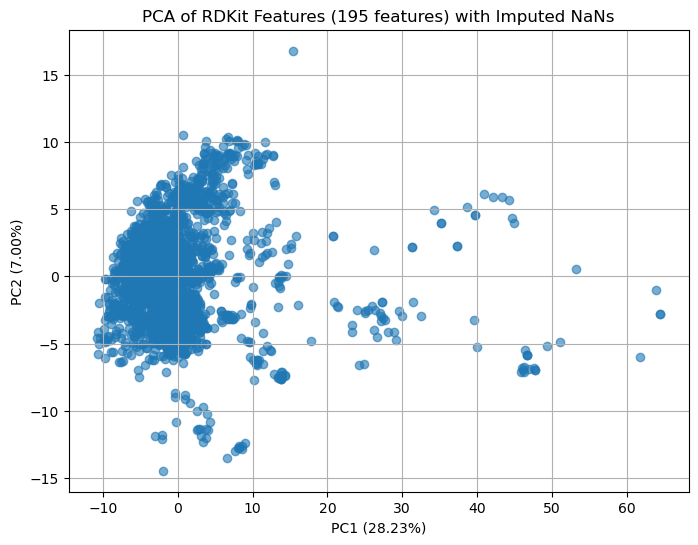

In [88]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer

# ==========================
# Load dataset
# ==========================
df = pd.read_csv("/Users/janat/Desktop/ppimic50pred/dataset/data/rdkit_train.csv")

# ==========================
# Drop irrelevant columns
# ==========================
cols_to_drop1 = [
    'NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_aldehyde', 'fr_azide', 'fr_barbitur',
    'fr_benzodiazepine', 'fr_diazo', 'fr_epoxide', 'fr_isocyan', 'fr_lactam', 'fr_nitroso',
    'fr_prisulfonamd', 'fr_quatN', 'fr_thiocyan', 'fr_term_acetylene', 'fr_phos_ester',
    'fr_oxime', 'fr_dihydropyridine', 'fr_phos_acid', 'fr_hdrzine', 'fr_N_O',
    'chembl_id', 'smiles'
]

drop_cols2 = ['chembl_id', 'smiles', 'ic50_value', 'log_ic50', 
              'target_chembl_id', 'target_name']

# Merge drop columns
drop_cols = list(set(cols_to_drop1 + drop_cols2))
X = df.drop(columns=drop_cols, errors='ignore')  # keep only features

# ==========================
# Impute missing values
# ==========================
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# ==========================
# Standardize features
# ==========================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# ==========================
# PCA transformation
# ==========================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# ==========================
# Plot PCA
# ==========================
plt.figure(figsize=(8,6))
plt.scatter(X_pca[:,0], X_pca[:,1], alpha=0.6)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)")
plt.title("PCA of RDKit Features (195 features) with Imputed NaNs")
plt.grid(True)
plt.show()


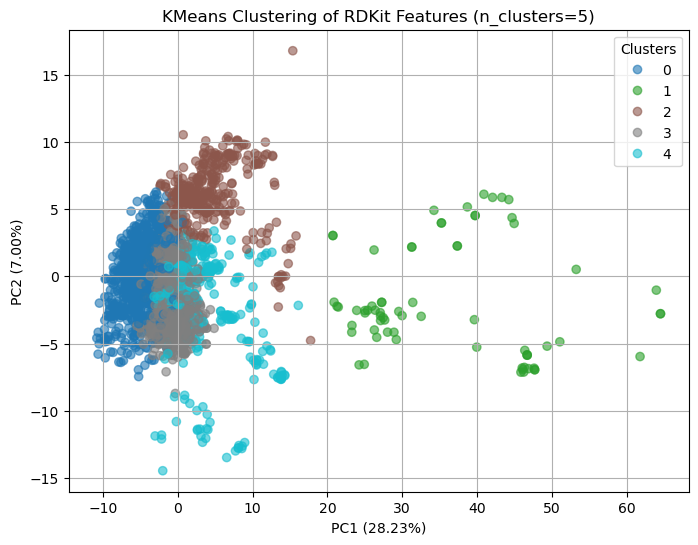

In [90]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans

# ==========================
# Load dataset
# ==========================
df = pd.read_csv("/Users/janat/Desktop/ppimic50pred/dataset/data/rdkit_train.csv")

# ==========================
# Drop irrelevant columns
# ==========================
cols_to_drop1 = [
    'NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_aldehyde', 'fr_azide', 'fr_barbitur',
    'fr_benzodiazepine', 'fr_diazo', 'fr_epoxide', 'fr_isocyan', 'fr_lactam', 'fr_nitroso',
    'fr_prisulfonamd', 'fr_quatN', 'fr_thiocyan', 'fr_term_acetylene', 'fr_phos_ester',
    'fr_oxime', 'fr_dihydropyridine', 'fr_phos_acid', 'fr_hdrzine', 'fr_N_O',
    'chembl_id', 'smiles'
]

drop_cols2 = ['chembl_id', 'smiles', 'ic50_value', 'log_ic50', 
              'target_chembl_id', 'target_name']

# Merge drop columns
drop_cols = list(set(cols_to_drop1 + drop_cols2))
X = df.drop(columns=drop_cols, errors='ignore')

# ==========================
# Handle missing values
# ==========================
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# ==========================
# Scale features
# ==========================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# ==========================
# KMeans clustering
# ==========================
n_clusters = 5  # change to the number of clusters you want
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)

# Add cluster labels to the DataFrame
df_clusters = df.copy()
df_clusters['Cluster'] = cluster_labels

# ==========================
# PCA for visualization
# ==========================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8,6))
scatter = plt.scatter(X_pca[:,0], X_pca[:,1], c=cluster_labels, cmap='tab10', alpha=0.6)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)")
plt.title(f"KMeans Clustering of RDKit Features (n_clusters={n_clusters})")
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.grid(True)
plt.show()



Cluster 0 - 800 samples
            MolWt  HeavyAtomMolWt  ExactMolWt  NumHDonors  NumHAcceptors  \
count  800.000000      800.000000  800.000000  800.000000     800.000000   
mean   370.959655      353.637175  370.388630    1.393750       4.543750   
std     77.281622       74.997378   77.069108    1.067772       1.632917   
min     99.133000       90.061000   99.068414    0.000000       0.000000   
25%    327.326750      312.568750  326.793055    1.000000       3.000000   
50%    377.464000      359.961000  377.137128    1.000000       4.500000   
75%    420.507750      400.390500  420.093489    2.000000       6.000000   
max    755.974000      741.862000  753.757296    8.000000      11.000000   

             TPSA  NumAromaticRings  NumAliphaticRings  NumRotatableBonds  \
count  800.000000        800.000000          800.00000         800.000000   
mean    71.315112          2.647500            0.60500           4.413750   
std     26.644956          1.157549            0.68707     

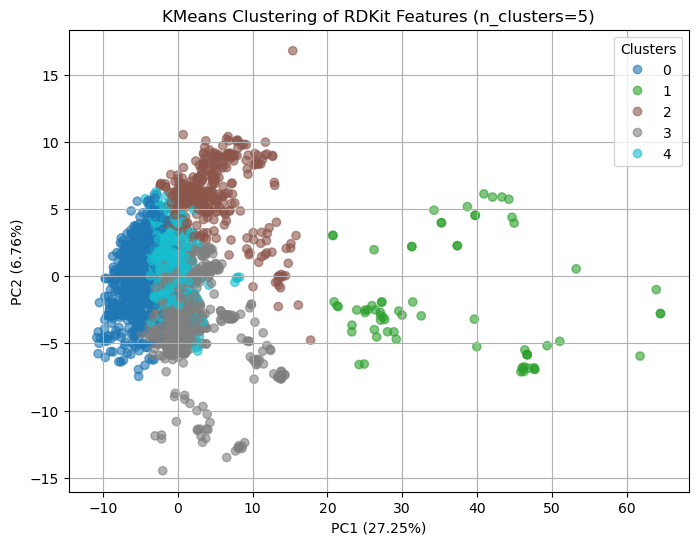

In [102]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans

# ==========================
# 1. Load dataset
# ==========================
data_path = "/Users/janat/Desktop/ppimic50pred/dataset/data/rdkit_train.csv"
df = pd.read_csv(data_path)

# ==========================
# 2. Drop irrelevant columns
# ==========================
cols_to_drop = [
    'NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'chembl_id','smiles',
    'ic50_value','log_ic50','target_chembl_id','target_name'
]

X = df.drop(columns=cols_to_drop, errors='ignore')

# ==========================
# 3. Impute missing values
# ==========================
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# ==========================
# 4. Scale features
# ==========================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# ==========================
# 5. KMeans clustering
# ==========================
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)

df_clusters = df.copy()
df_clusters['Cluster'] = cluster_labels

# ==========================
# 6. Examine cluster feature statistics
# ==========================
# Chemically meaningful descriptors for cluster inspection
key_features = [
    'MolWt', 'HeavyAtomMolWt', 'ExactMolWt',
    'NumHDonors', 'NumHAcceptors', 'TPSA',
    'NumAromaticRings', 'NumAliphaticRings', 'NumRotatableBonds',
    'MolLogP', 'FractionCSP3'
]

for cluster_num in range(n_clusters):
    cluster_df = df_clusters[df_clusters['Cluster'] == cluster_num]
    print(f"\nCluster {cluster_num} - {len(cluster_df)} samples")
    print(cluster_df[key_features].describe())

# ==========================
# 7. PCA for visualization
# ==========================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8,6))
scatter = plt.scatter(X_pca[:,0], X_pca[:,1], c=cluster_labels, cmap='tab10', alpha=0.6)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)")
plt.title(f"KMeans Clustering of RDKit Features (n_clusters={n_clusters})")
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.grid(True)
plt.show()

# ==========================
# 8. Save each cluster to CSV
# ==========================
output_dir = "/Users/janat/Desktop/ppimic50pred/dataset/data/rdkit/"
for cluster_num in range(n_clusters):
    cluster_df = df_clusters[df_clusters['Cluster'] == cluster_num]
    cluster_df.to_csv(f"{output_dir}rdkit_cluster_{cluster_num}.csv", index=False)


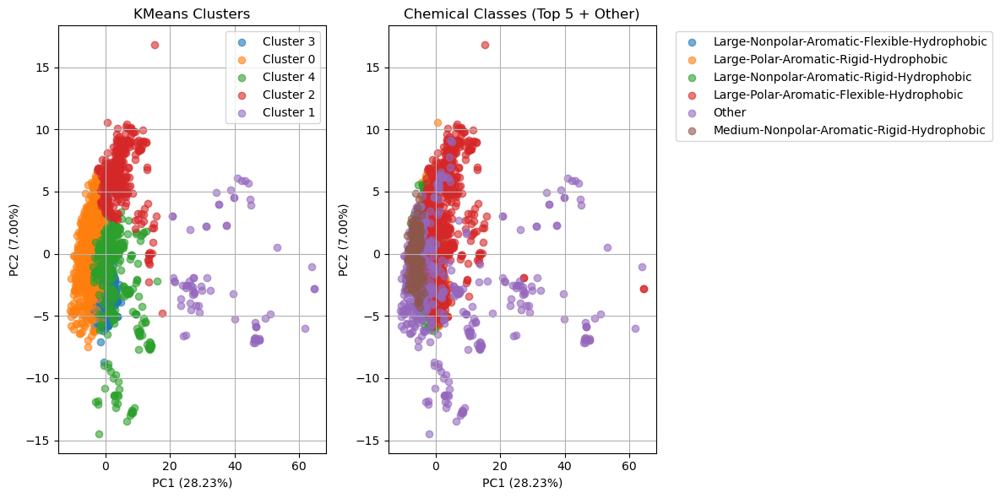

KMeans cluster counts:
KMeansCluster
3    1116
0     884
4     358
2     332
1      70
Name: count, dtype: int64

Chemical class counts (top 5 + Other):
ChemicalClass
Large-Polar-Aromatic-Flexible-Hydrophobic       982
Other                                           606
Large-Polar-Aromatic-Rigid-Hydrophobic          531
Large-Nonpolar-Aromatic-Rigid-Hydrophobic       302
Medium-Nonpolar-Aromatic-Rigid-Hydrophobic      175
Large-Nonpolar-Aromatic-Flexible-Hydrophobic    164
Name: count, dtype: int64


In [112]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# ==========================
# 1. Load dataset
# ==========================
data_path = "/Users/janat/Desktop/ppimic50pred/dataset/data/rdkit_train.csv"
df = pd.read_csv(data_path)

# ==========================
# 2. Drop unwanted columns from features
# Keep chembl_id and smiles for reference
# ==========================
cols_to_drop = [
    'NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9',
    'fr_aldehyde', 'fr_azide', 'fr_barbitur', 'fr_benzodiazepine',
    'fr_diazo', 'fr_epoxide', 'fr_isocyan', 'fr_lactam', 'fr_nitroso',
    'fr_prisulfonamd', 'fr_quatN', 'fr_thiocyan', 'fr_term_acetylene',
    'fr_phos_ester', 'fr_oxime', 'fr_dihydropyridine', 'fr_phos_acid',
    'fr_hdrzine', 'fr_N_O', 'ic50_value','log_ic50',
    'target_chembl_id','target_name'
]

feature_cols = [c for c in df.columns if c not in cols_to_drop]
X = df[feature_cols].drop(columns=['chembl_id','smiles'], errors='ignore')

# ==========================
# 3. Impute missing values
# ==========================
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# ==========================
# 4. Scale features
# ==========================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# ==========================
# 5. KMeans clustering
# ==========================
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df['KMeansCluster'] = kmeans.fit_predict(X_scaled)

# ==========================
# 6. Assign chemical classes
# ==========================
def assign_chemical_class(row):
    size = 'Small' if row['MolWt'] < 250 else ('Medium' if row['MolWt'] < 400 else 'Large')
    polarity = 'Polar' if row['TPSA'] > 75 or (row['NumHDonors'] + row['NumHAcceptors']) > 6 else 'Nonpolar'
    aromaticity = 'Aromatic' if row['NumAromaticRings'] >= 2 else 'Aliphatic'
    flexibility = 'Flexible' if row['NumRotatableBonds'] > 6 or row['FractionCSP3'] > 0.5 else 'Rigid'
    hydro = 'Hydrophobic' if row['MolLogP'] > 3 else 'Hydrophilic'
    return f"{size}-{polarity}-{aromaticity}-{flexibility}-{hydro}"

df['ChemicalClassRaw'] = df.apply(assign_chemical_class, axis=1)

# Reduce to top 5 major chemical classes, others grouped as 'Other'
top_classes = df['ChemicalClassRaw'].value_counts().nlargest(5).index.tolist()
df['ChemicalClass'] = df['ChemicalClassRaw'].apply(lambda x: x if x in top_classes else 'Other')

# ==========================
# 7. PCA visualization
# ==========================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(12,6))

# Plot KMeans clusters
plt.subplot(1,2,1)
unique_clusters = df['KMeansCluster'].unique()
colors = plt.cm.tab10(range(len(unique_clusters)))
for i, cluster in enumerate(unique_clusters):
    subset = df[df['KMeansCluster'] == cluster]
    plt.scatter(X_pca[subset.index,0], X_pca[subset.index,1],
                label=f'Cluster {cluster}', alpha=0.6, color=colors[i])
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)")
plt.title("KMeans Clusters")
plt.legend()
plt.grid(True)

# Plot chemical classes (reduced)
plt.subplot(1,2,2)
unique_classes = df['ChemicalClass'].unique()
colors = plt.cm.tab10(range(len(unique_classes)))
for i, group in enumerate(unique_classes):
    subset = df[df['ChemicalClass'] == group]
    plt.scatter(X_pca[subset.index,0], X_pca[subset.index,1],
                label=group, alpha=0.6, color=colors[i])
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)")
plt.title("Chemical Classes (Top 5 + Other)")
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.grid(True)

plt.tight_layout()
plt.show()

# ==========================
# 8. Summary statistics
# ==========================
print("KMeans cluster counts:")
print(df['KMeansCluster'].value_counts())
print("\nChemical class counts (top 5 + Other):")
print(df['ChemicalClass'].value_counts())

# ==========================
# 9. Save full dataset
# ==========================
output_dir = "/Users/janat/Desktop/ppimic50pred/dataset/data/rdkit/"
df.to_csv(f"{output_dir}rdkit_clusters_and_classes_reduced.csv", index=False)

# ==========================
# 10. Save per KMeans cluster
# ==========================
for cluster in unique_clusters:
    cluster_df = df[df['KMeansCluster'] == cluster]
    cluster_df.to_csv(f"{output_dir}rdkit_kmeans_cluster_{cluster}.csv", index=False)

# ==========================
# 11. Save per chemical class
# ==========================
for group in df['ChemicalClass'].unique():
    group_df = df[df['ChemicalClass'] == group]
    group_df.to_csv(f"{output_dir}rdkit_chemical_class_{group}.csv", index=False)


KMeans cluster counts:
KMeansCluster
0    803
1     68
2    681
3    745
4    463
Name: count, dtype: int64

Cluster 0 summary (803 molecules):
                           mean           std       min           max
MaxAbsEStateIndex     11.916753      2.075296  2.443506  1.510125e+01
MaxEStateIndex        11.916753      2.075296  2.443506  1.510125e+01
MinAbsEStateIndex      0.167710      0.184141  0.000000  1.049419e+00
MinEStateIndex        -1.327276      1.587739 -5.033702  1.049419e+00
qed                    0.571778      0.172700  0.149735  9.436945e-01
...                         ...           ...       ...           ...
fr_unbrch_alkane       0.102117      0.411230  0.000000  7.000000e+00
fr_urea                0.109589      0.346619  0.000000  2.000000e+00
ic50_value         14729.398948  96900.585584  0.240000  2.660000e+06
log_ic50               3.329292      1.053921 -0.619789  6.424882e+00
KMeansCluster          0.000000      0.000000  0.000000  0.000000e+00

[220 rows x 4 c

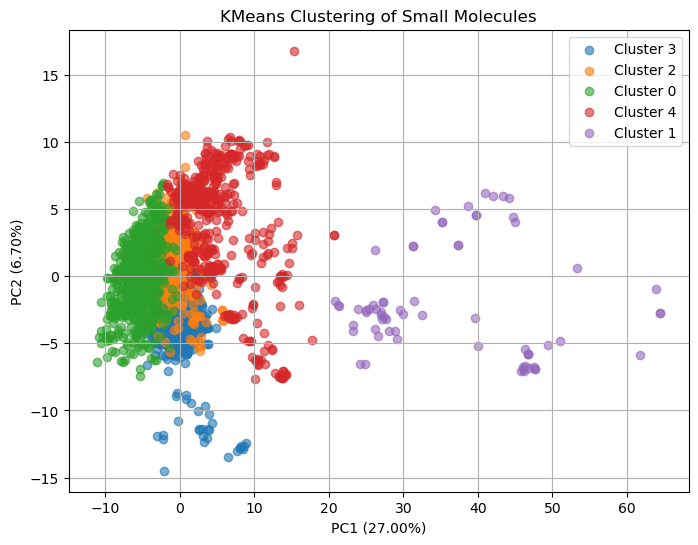

In [120]:
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# ==========================
# 1. Load dataset
# ==========================
data_path = "/Users/janat/Desktop/ppimic50pred/dataset/data/rdkit_train.csv"
df = pd.read_csv(data_path)

# ==========================
# 2. Separate numeric and non-numeric columns
# ==========================
non_numeric_cols = df.select_dtypes(include=['object']).columns.tolist()  # chembl_id, smiles, target info
X_numeric = df.drop(columns=non_numeric_cols)

# ==========================
# 3. Impute missing values
# ==========================
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X_numeric)

# ==========================
# 4. Scale numeric features
# ==========================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# ==========================
# 5. KMeans clustering
# ==========================
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df['KMeansCluster'] = kmeans.fit_predict(X_scaled)

# ==========================
# 6. Print cluster counts
# ==========================
cluster_counts = df['KMeansCluster'].value_counts().sort_index()
print("KMeans cluster counts:")
print(cluster_counts)

# ==========================
# 7. Optional: summary statistics per cluster
# ==========================
for cluster in sorted(df['KMeansCluster'].unique()):
    cluster_df = df[df['KMeansCluster'] == cluster]
    print(f"\nCluster {cluster} summary ({len(cluster_df)} molecules):")
    print(cluster_df.describe().transpose()[['mean','std','min','max']])

# ==========================
# 8. PCA visualization (optional)
# ==========================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8,6))
for cluster in df['KMeansCluster'].unique():
    subset = df[df['KMeansCluster'] == cluster]
    plt.scatter(X_pca[subset.index,0], X_pca[subset.index,1],
                label=f'Cluster {cluster}', alpha=0.6)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)")
plt.title("KMeans Clustering of Small Molecules")
plt.legend()
plt.grid(True)
plt.show()


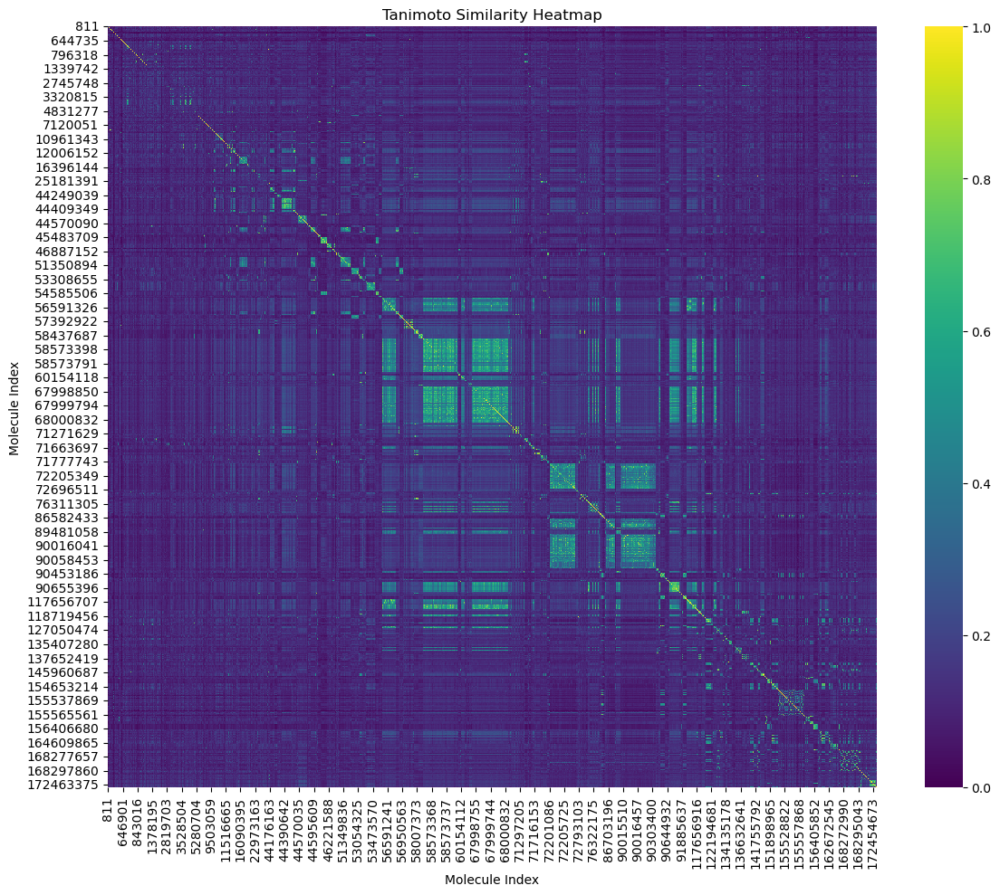

In [134]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ==========================
# 1. Load precomputed Tanimoto similarity matrix
# ==========================
data_path = "/Users/janat/Desktop/ppimic50pred/dataset/newcluster/tanimoto_similarity_matrix.csv"
sim_df = pd.read_csv(data_path, index_col=0)  # first column is the index

# ==========================
# 2. Plot heatmap
# ==========================
plt.figure(figsize=(12, 10))
sns.heatmap(sim_df, cmap="viridis", vmin=0, vmax=1)
plt.title("Tanimoto Similarity Heatmap")
plt.xlabel("Molecule Index")
plt.ylabel("Molecule Index")
plt.tight_layout()
plt.show()


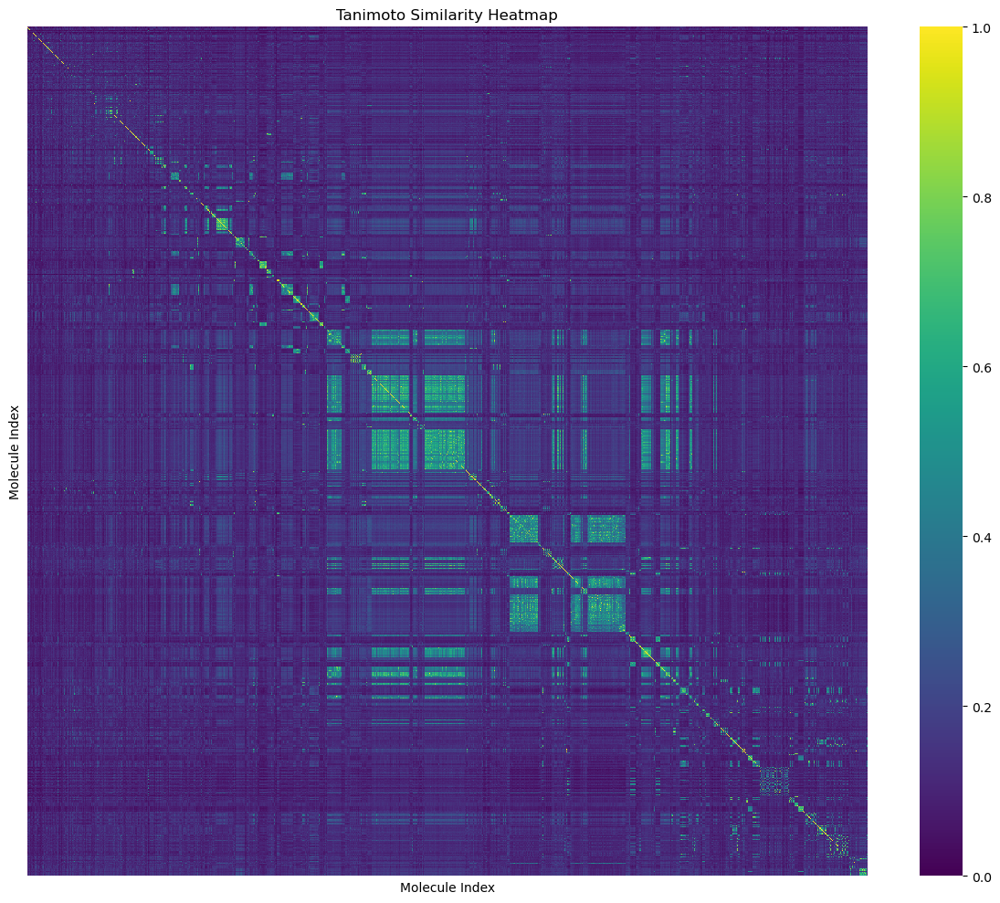

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ==========================
# 1. Load precomputed Tanimoto similarity matrix
# ==========================
data_path = "/Users/janat/Desktop/ppimic50pred/dataset/newcluster/tanimoto_similarity_matrix.csv"
sim_df = pd.read_csv(data_path, index_col=0)  # first column is the index

# ==========================
# 2. Plot heatmap for large matrix
# ==========================
plt.figure(figsize=(12, 10))
sns.heatmap(
    sim_df,
    cmap="viridis",
    vmin=0,
    vmax=1,
    xticklabels=False,  # hide x-axis labels
    yticklabels=False   # hide y-axis labels
)
plt.title("Tanimoto Similarity Heatmap")
plt.xlabel("Molecule Index")
plt.ylabel("Molecule Index")
plt.tight_layout()
plt.show()




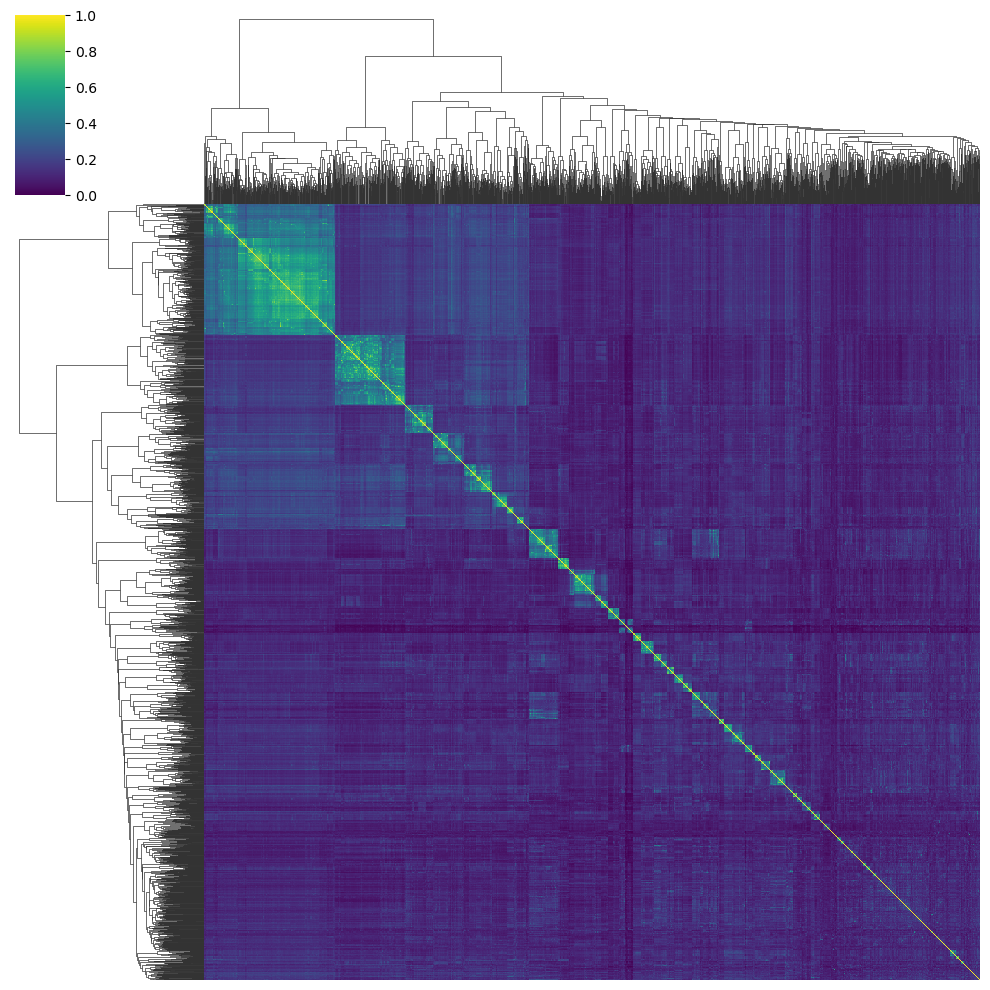

In [13]:
# ==========================
# Optional: Clustered heatmap for pattern visualization
# ==========================
sns.clustermap(
    sim_df,
    cmap="viridis",
    figsize=(10, 10),
    xticklabels=False,
    yticklabels=False
)
#plt.suptitle("Tanimoto Similarity Heatmap")
plt.show()

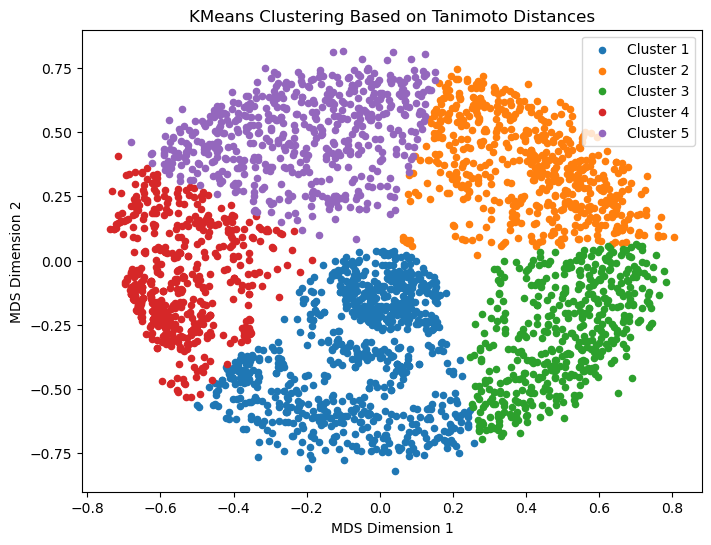

In [148]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.manifold import MDS
import matplotlib.pyplot as plt
import seaborn as sns

# Load Tanimoto similarity matrix
sim_df = pd.read_csv("/Users/janat/Desktop/ppimic50pred/dataset/newcluster/tanimoto_similarity_matrix.csv", index_col=0)

# Convert similarity to distance
distance_matrix = 1 - sim_df.values

# Use MDS to project distance matrix to 2D
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
coords = mds.fit_transform(distance_matrix)

# KMeans clustering
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(coords)

# Plot clusters
plt.figure(figsize=(8, 6))
for i in range(n_clusters):
    plt.scatter(coords[labels==i,0], coords[labels==i,1], label=f"Cluster {i+1}", s=20)
plt.title("KMeans Clustering Based on Tanimoto Distances")
plt.xlabel("MDS Dimension 1")
plt.ylabel("MDS Dimension 2")
plt.legend()
plt.show()


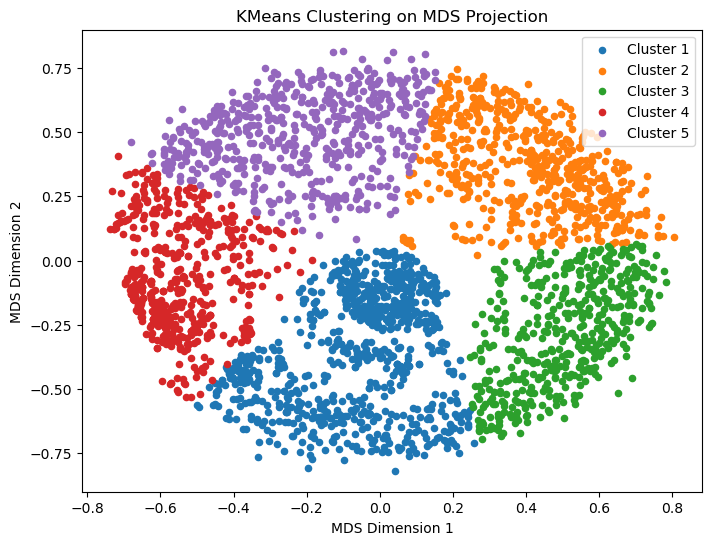

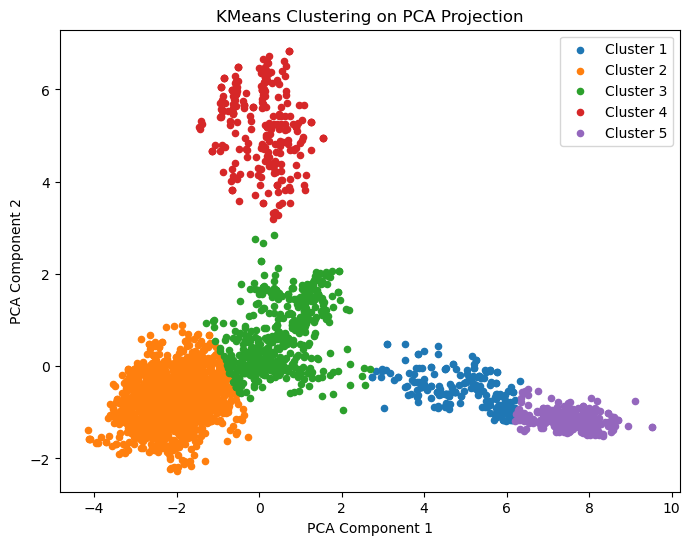

In [150]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.manifold import MDS
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# ==========================
# 1. Load Tanimoto similarity matrix
# ==========================
sim_df = pd.read_csv("/Users/janat/Desktop/ppimic50pred/dataset/newcluster/tanimoto_similarity_matrix.csv", index_col=0)

# ==========================
# 2. Convert similarity to distance
# ==========================
distance_matrix = 1 - sim_df.values  # Tanimoto distance

# ==========================
# 3a. Dimensionality reduction using MDS
# ==========================
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
coords_mds = mds.fit_transform(distance_matrix)

# ==========================
# 3b. Dimensionality reduction using PCA
# ==========================
# PCA works directly on the similarity values (or fingerprints)
pca = PCA(n_components=2, random_state=42)
coords_pca = pca.fit_transform(sim_df.values)

# ==========================
# 4. KMeans clustering on MDS coordinates
# ==========================
n_clusters = 5
kmeans_mds = KMeans(n_clusters=n_clusters, random_state=42)
labels_mds = kmeans_mds.fit_predict(coords_mds)

# ==========================
# 5. KMeans clustering on PCA coordinates
# ==========================
kmeans_pca = KMeans(n_clusters=n_clusters, random_state=42)
labels_pca = kmeans_pca.fit_predict(coords_pca)

# ==========================
# 6. Plot MDS clusters
# ==========================
plt.figure(figsize=(8, 6))
for i in range(n_clusters):
    plt.scatter(coords_mds[labels_mds==i,0], coords_mds[labels_mds==i,1], label=f"Cluster {i+1}", s=20)
plt.title("KMeans Clustering on MDS Projection")
plt.xlabel("MDS Dimension 1")
plt.ylabel("MDS Dimension 2")
plt.legend()
plt.show()

# ==========================
# 7. Plot PCA clusters
# ==========================
plt.figure(figsize=(8, 6))
for i in range(n_clusters):
    plt.scatter(coords_pca[labels_pca==i,0], coords_pca[labels_pca==i,1], label=f"Cluster {i+1}", s=20)
plt.title("KMeans Clustering on PCA Projection")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend()
plt.show()



Top 10 important features:
           Feature  Importance
38           Chi4n    0.249973
93    VSA_EState10    0.059651
59       PEOE_VSA9    0.047703
78      SlogP_VSA7    0.045962
76      SlogP_VSA5    0.024580
22  BCUT2D_LOGPLOW    0.022038
21   BCUT2D_LOGPHI    0.022013
25          AvgIpc    0.016557
53       PEOE_VSA3    0.014608
19    BCUT2D_CHGHI    0.013542


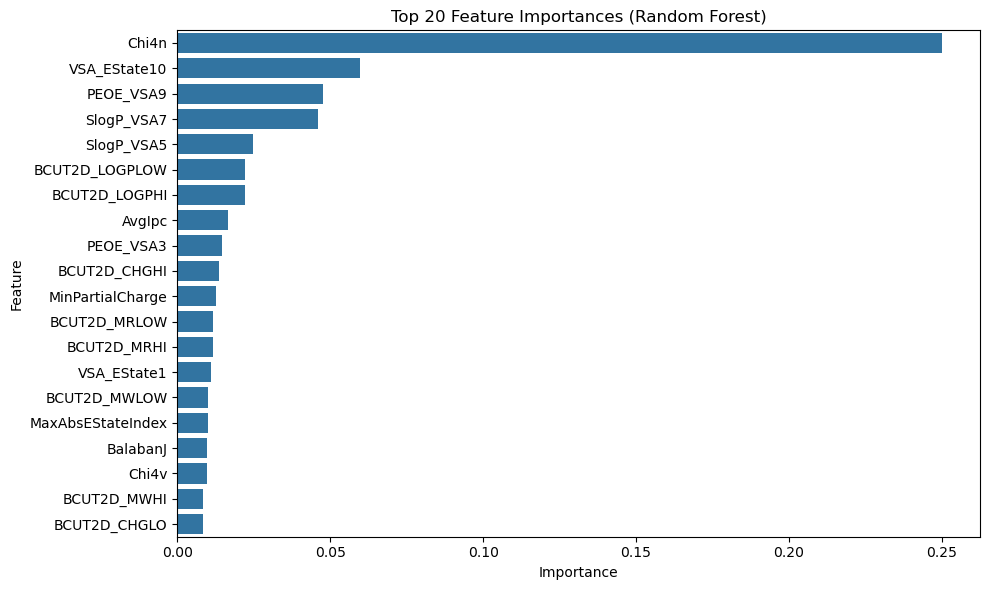


Approximate Regression Equation (Surrogate Linear Model):
log_ic50 ≈ -0.0416*MaxAbsEStateIndex + -0.0416*MaxEStateIndex + 0.0043*MinAbsEStateIndex + 0.0744*MinEStateIndex + 0.2005*qed + -0.1327*SPS + 245.6270*MolWt + -291.5045*HeavyAtomMolWt + 73.9443*ExactMolWt + -107.0846*NumValenceElectrons + -0.0693*MaxPartialCharge + -0.0039*MinPartialCharge + -0.1527*MaxAbsPartialCharge + 0.0839*MinAbsPartialCharge + 0.5428*FpDensityMorgan1 + -1.6763*FpDensityMorgan2 + 1.1617*FpDensityMorgan3 + -0.1084*BCUT2D_MWHI + 0.1457*BCUT2D_MWLOW + 0.1129*BCUT2D_CHGHI + -0.1729*BCUT2D_CHGLO + 0.0627*BCUT2D_LOGPHI + 0.1549*BCUT2D_LOGPLOW + 0.2763*BCUT2D_MRHI + -0.1043*BCUT2D_MRLOW + -0.0630*AvgIpc + 0.1117*BalabanJ + -1.3041*BertzCT + 1.6727*Chi0 + -6.4406*Chi0n + -4.3209*Chi0v + -29.6611*Chi1 + 4.7241*Chi1n + -0.2067*Chi1v + -1.6176*Chi2n + -0.1193*Chi2v + 0.5792*Chi3n + 0.4283*Chi3v + 0.0103*Chi4n + -0.7433*Chi4v + -2.8079*HallKierAlpha + 0.0500*Ipc + -8.3033*Kappa1 + -3.0334*Kappa2 + -0.2764*Kappa3 + -95

In [166]:
# === Feature Importances ===
importances = rf_final.feature_importances_
feat_importance_df = pd.DataFrame({
    "Feature": X_selected.columns,
    "Importance": importances
}).sort_values(by="Importance", ascending=False)

feat_importance_df.to_csv(os.path.join(output_dir, "feature_importances.csv"), index=False)
print("\nTop 10 important features:")
print(feat_importance_df.head(10))

# Optional: visualize feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x="Importance", y="Feature", data=feat_importance_df.head(20))
plt.title("Top 20 Feature Importances (Random Forest)")
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "feature_importances_plot.png"))
plt.show()

# === Surrogate Linear Regression ===
from sklearn.linear_model import LinearRegression

# Train a linear regression on RF predictions
rf_preds = rf_final.predict(X_scaled_full)
lin_model = LinearRegression()
lin_model.fit(X_scaled_full, rf_preds)

coeffs_df = pd.DataFrame({
    "Feature": X_selected.columns,
    "Coefficient": lin_model.coef_
}).sort_values(by="Coefficient", key=abs, ascending=False)

coeffs_df.to_csv(os.path.join(output_dir, "rf_surrogate_linear_coeffs.csv"), index=False)

# Print approximate regression equation
equation_terms = [f"{coef:.4f}*{feat}" for coef, feat in zip(lin_model.coef_, X_selected.columns)]
equation = "log_ic50 ≈ " + " + ".join(equation_terms)
print("\nApproximate Regression Equation (Surrogate Linear Model):")
print(equation)


In [156]:
# === Generate Equation in Manuscript Style ===
top_n = 10  # show top 10 most important features for clarity
top_features = coeffs_df.head(top_n)

equation_str = "log_ic50 ≈ "
terms = []
for coef, feat in zip(top_features['Coefficient'], top_features['Feature']):
    sign = "+" if coef >= 0 else "-"
    terms.append(f" {sign} {abs(coef):.4f} × {feat}")

equation_str += "".join(terms)
print("\nRegression-style Equation (Top Features):\n")
print(equation_str)



Regression-style Equation (Top Features):

log_ic50 ≈  - 954.7746 × LabuteASA - 291.5045 × HeavyAtomMolWt + 245.6270 × MolWt + 171.8120 × HeavyAtomCount - 107.0846 × NumValenceElectrons + 93.9595 × SMR_VSA5 + 90.8819 × SlogP_VSA2 + 82.1006 × PEOE_VSA7 + 73.9443 × ExactMolWt + 73.9292 × PEOE_VSA6


In [158]:
# === Formula-style equation (inline) ===
top_n = 10  # top features for readability
top_features = coeffs_df.head(top_n)

terms = []
for coef, feat in zip(top_features['Coefficient'], top_features['Feature']):
    sign = "+" if coef >= 0 else "-"
    terms.append(f"{sign}{abs(coef):.4f}*{feat}")

formula_equation = "log_ic50 ≈ " + " ".join(terms)
print("\nInline Formula-style Equation:\n")
print(formula_equation)



Inline Formula-style Equation:

log_ic50 ≈ -954.7746*LabuteASA -291.5045*HeavyAtomMolWt +245.6270*MolWt +171.8120*HeavyAtomCount -107.0846*NumValenceElectrons +93.9595*SMR_VSA5 +90.8819*SlogP_VSA2 +82.1006*PEOE_VSA7 +73.9443*ExactMolWt +73.9292*PEOE_VSA6


In [160]:
# === Formula-style equation (inline, manuscript-ready) ===
top_n = 10  # top features for readability
top_features = coeffs_df.head(top_n)

terms = []
for coef, feat in zip(top_features['Coefficient'], top_features['Feature']):
    # Determine sign
    sign = "+" if coef >= 0 else "-"
    # Format term: coef rounded to 4 decimals, multiply by feature
    terms.append(f"{sign}{abs(coef):.4f}*{feat}")

# Combine terms into one inline equation
formula_equation = "log_ic50 ≈ " + " ".join(terms)

# Print inline formula
print("\nInline Formula-style Equation (Top Features):\n")
print(formula_equation)

# === Optional: LaTeX style for manuscript ===
latex_terms = [f"{'' if coef >=0 else '-'}{abs(coef):.4f} \\times \\text{{{feat}}}" 
               for coef, feat in zip(top_features['Coefficient'], top_features['Feature'])]
latex_equation = "\\log IC_{50} \\approx " + " + ".join(latex_terms)
print("\nLaTeX-style Equation (Top Features):\n")
print(latex_equation)



Inline Formula-style Equation (Top Features):

log_ic50 ≈ -954.7746*LabuteASA -291.5045*HeavyAtomMolWt +245.6270*MolWt +171.8120*HeavyAtomCount -107.0846*NumValenceElectrons +93.9595*SMR_VSA5 +90.8819*SlogP_VSA2 +82.1006*PEOE_VSA7 +73.9443*ExactMolWt +73.9292*PEOE_VSA6

LaTeX-style Equation (Top Features):

\log IC_{50} \approx -954.7746 \times \text{LabuteASA} + -291.5045 \times \text{HeavyAtomMolWt} + 245.6270 \times \text{MolWt} + 171.8120 \times \text{HeavyAtomCount} + -107.0846 \times \text{NumValenceElectrons} + 93.9595 \times \text{SMR_VSA5} + 90.8819 \times \text{SlogP_VSA2} + 82.1006 \times \text{PEOE_VSA7} + 73.9443 \times \text{ExactMolWt} + 73.9292 \times \text{PEOE_VSA6}


In [168]:
# === Generate Equation in Mathematical Notation for Manuscript ===
top_n = 10  # show top 10 most important features for clarity
top_features = coeffs_df.head(top_n)

# Create equation in plain text with multiplication sign
equation_terms = []
for coef, feat in zip(top_features['Coefficient'], top_features['Feature']):
    sign = "+" if coef >= 0 else "-"
    equation_terms.append(f" {sign} {abs(coef):.4f} × {feat}")

equation_str = "log_ic50 ≈" + "".join(equation_terms)
print("\nRegression-style Equation (Top Features, Manuscript Notation):\n")
print(equation_str)

# === Optional: LaTeX-style equation ===
latex_terms = [f"{'' if coef>=0 else '-'}{abs(coef):.4f} \\times \\text{{{feat}}}" 
               for coef, feat in zip(top_features['Coefficient'], top_features['Feature'])]
latex_equation = "\\log IC_{50} \\approx " + " + ".join(latex_terms)
print("\nLaTeX-style Equation:\n")
print(latex_equation)



Regression-style Equation (Top Features, Manuscript Notation):

log_ic50 ≈ - 954.7746 × LabuteASA - 291.5045 × HeavyAtomMolWt + 245.6270 × MolWt + 171.8120 × HeavyAtomCount - 107.0846 × NumValenceElectrons + 93.9595 × SMR_VSA5 + 90.8819 × SlogP_VSA2 + 82.1006 × PEOE_VSA7 + 73.9443 × ExactMolWt + 73.9292 × PEOE_VSA6

LaTeX-style Equation:

\log IC_{50} \approx -954.7746 \times \text{LabuteASA} + -291.5045 \times \text{HeavyAtomMolWt} + 245.6270 \times \text{MolWt} + 171.8120 \times \text{HeavyAtomCount} + -107.0846 \times \text{NumValenceElectrons} + 93.9595 \times \text{SMR_VSA5} + 90.8819 \times \text{SlogP_VSA2} + 82.1006 \times \text{PEOE_VSA7} + 73.9443 \times \text{ExactMolWt} + 73.9292 \times \text{PEOE_VSA6}


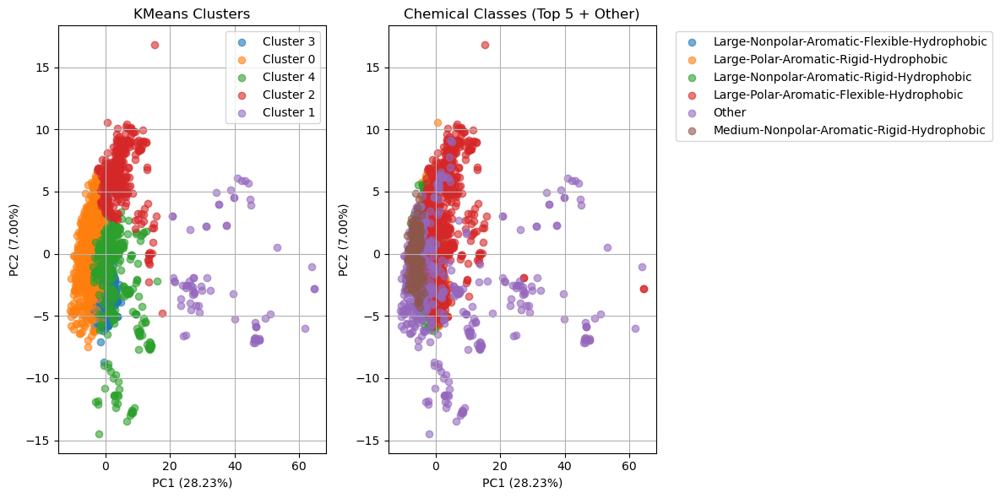

KMeans cluster counts:
KMeansCluster
3    1116
0     884
4     358
2     332
1      70
Name: count, dtype: int64

Chemical class counts (top 5 + Other):
ChemicalClass
Large-Polar-Aromatic-Flexible-Hydrophobic       982
Other                                           606
Large-Polar-Aromatic-Rigid-Hydrophobic          531
Large-Nonpolar-Aromatic-Rigid-Hydrophobic       302
Medium-Nonpolar-Aromatic-Rigid-Hydrophobic      175
Large-Nonpolar-Aromatic-Flexible-Hydrophobic    164
Name: count, dtype: int64


In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# ==========================
# 1. Load dataset
# ==========================
data_path = "/Users/janat/Desktop/ppimic50pred/dataset/data/rdkit_train.csv"
df = pd.read_csv(data_path)

# ==========================
# 2. Drop unwanted columns from features
# Keep chembl_id and smiles for reference
# ==========================
cols_to_drop = [
    'NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9',
    'fr_aldehyde', 'fr_azide', 'fr_barbitur', 'fr_benzodiazepine',
    'fr_diazo', 'fr_epoxide', 'fr_isocyan', 'fr_lactam', 'fr_nitroso',
    'fr_prisulfonamd', 'fr_quatN', 'fr_thiocyan', 'fr_term_acetylene',
    'fr_phos_ester', 'fr_oxime', 'fr_dihydropyridine', 'fr_phos_acid',
    'fr_hdrzine', 'fr_N_O', 'ic50_value','log_ic50',
    'target_chembl_id','target_name'
]

feature_cols = [c for c in df.columns if c not in cols_to_drop]
X = df[feature_cols].drop(columns=['chembl_id','smiles'], errors='ignore')

# ==========================
# 3. Impute missing values
# ==========================
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# ==========================
# 4. Scale features
# ==========================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# ==========================
# 5. KMeans clustering
# ==========================
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df['KMeansCluster'] = kmeans.fit_predict(X_scaled)

# ==========================
# 6. Assign chemical classes
# ==========================
def assign_chemical_class(row):
    size = 'Small' if row['MolWt'] < 250 else ('Medium' if row['MolWt'] < 400 else 'Large')
    polarity = 'Polar' if row['TPSA'] > 75 or (row['NumHDonors'] + row['NumHAcceptors']) > 6 else 'Nonpolar'
    aromaticity = 'Aromatic' if row['NumAromaticRings'] >= 2 else 'Aliphatic'
    flexibility = 'Flexible' if row['NumRotatableBonds'] > 6 or row['FractionCSP3'] > 0.5 else 'Rigid'
    hydro = 'Hydrophobic' if row['MolLogP'] > 3 else 'Hydrophilic'
    return f"{size}-{polarity}-{aromaticity}-{flexibility}-{hydro}"

df['ChemicalClassRaw'] = df.apply(assign_chemical_class, axis=1)

# Reduce to top 5 major chemical classes, others grouped as 'Other'
top_classes = df['ChemicalClassRaw'].value_counts().nlargest(5).index.tolist()
df['ChemicalClass'] = df['ChemicalClassRaw'].apply(lambda x: x if x in top_classes else 'Other')

# ==========================
# 7. PCA visualization
# ==========================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(12,6))

# Plot KMeans clusters
plt.subplot(1,2,1)
unique_clusters = df['KMeansCluster'].unique()
colors = plt.cm.tab10(range(len(unique_clusters)))
for i, cluster in enumerate(unique_clusters):
    subset = df[df['KMeansCluster'] == cluster]
    plt.scatter(X_pca[subset.index,0], X_pca[subset.index,1],
                label=f'Cluster {cluster}', alpha=0.6, color=colors[i])
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)")
plt.title("KMeans Clusters")
plt.legend()
plt.grid(True)

# Plot chemical classes (reduced)
plt.subplot(1,2,2)
unique_classes = df['ChemicalClass'].unique()
colors = plt.cm.tab10(range(len(unique_classes)))
for i, group in enumerate(unique_classes):
    subset = df[df['ChemicalClass'] == group]
    plt.scatter(X_pca[subset.index,0], X_pca[subset.index,1],
                label=group, alpha=0.6, color=colors[i])
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)")
plt.title("Chemical Classes (Top 5 + Other)")
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.grid(True)

plt.tight_layout()
plt.show()

# ==========================
# 8. Summary statistics
# ==========================
print("KMeans cluster counts:")
print(df['KMeansCluster'].value_counts())
print("\nChemical class counts (top 5 + Other):")
print(df['ChemicalClass'].value_counts())

# ==========================
# 9. Save full dataset
# ==========================
output_dir = "/Users/janat/Desktop/ppimic50pred/dataset/data/rdkit/"
df.to_csv(f"{output_dir}rdkit_clusters_and_classes_reduced.csv", index=False)

# ==========================
# 10. Save per KMeans cluster
# ==========================
for cluster in unique_clusters:
    cluster_df = df[df['KMeansCluster'] == cluster]
    cluster_df.to_csv(f"{output_dir}rdkit_kmeans_cluster_{cluster}.csv", index=False)

# ==========================
# 11. Save per chemical class
# ==========================
for group in df['ChemicalClass'].unique():
    group_df = df[df['ChemicalClass'] == group]
    group_df.to_csv(f"{output_dir}rdkit_chemical_class_{group}.csv", index=False)


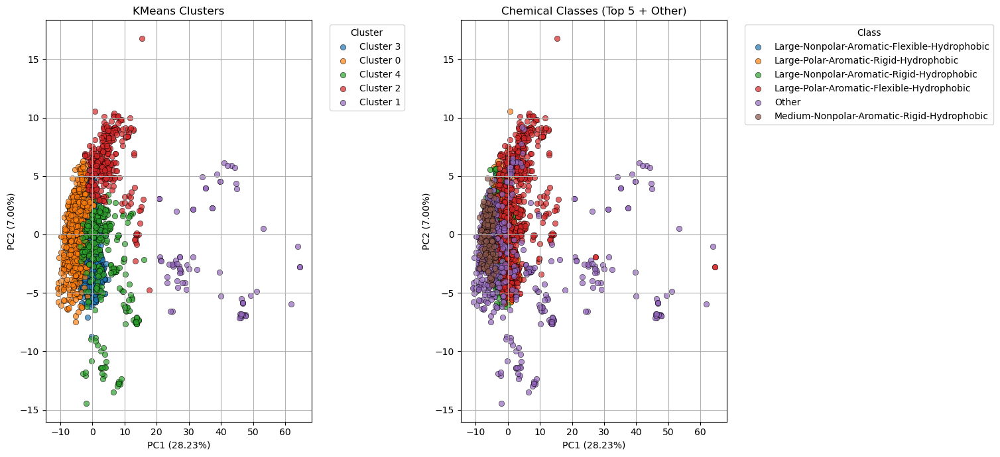

KMeans cluster counts:
KMeansCluster
3    1116
0     884
4     358
2     332
1      70
Name: count, dtype: int64

Chemical class counts (top 5 + Other):
ChemicalClass
Large-Polar-Aromatic-Flexible-Hydrophobic       982
Other                                           606
Large-Polar-Aromatic-Rigid-Hydrophobic          531
Large-Nonpolar-Aromatic-Rigid-Hydrophobic       302
Medium-Nonpolar-Aromatic-Rigid-Hydrophobic      175
Large-Nonpolar-Aromatic-Flexible-Hydrophobic    164
Name: count, dtype: int64


In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# ==========================
# 1. Load dataset
# ==========================
data_path = "/Users/janat/Desktop/ppimic50pred/dataset/data/rdkit_train.csv"
df = pd.read_csv(data_path)

# ==========================
# 2. Drop unwanted columns from features
# ==========================
cols_to_drop = [
    'NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9',
    'fr_aldehyde', 'fr_azide', 'fr_barbitur', 'fr_benzodiazepine',
    'fr_diazo', 'fr_epoxide', 'fr_isocyan', 'fr_lactam', 'fr_nitroso',
    'fr_prisulfonamd', 'fr_quatN', 'fr_thiocyan', 'fr_term_acetylene',
    'fr_phos_ester', 'fr_oxime', 'fr_dihydropyridine', 'fr_phos_acid',
    'fr_hdrzine', 'fr_N_O', 'ic50_value','log_ic50',
    'target_chembl_id','target_name'
]
feature_cols = [c for c in df.columns if c not in cols_to_drop]
X = df[feature_cols].drop(columns=['chembl_id','smiles'], errors='ignore')

# ==========================
# 3. Impute missing values
# ==========================
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# ==========================
# 4. Scale features
# ==========================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# ==========================
# 5. KMeans clustering
# ==========================
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df['KMeansCluster'] = kmeans.fit_predict(X_scaled)

# ==========================
# 6. Assign chemical classes
# ==========================
def assign_chemical_class(row):
    size = 'Small' if row['MolWt'] < 250 else ('Medium' if row['MolWt'] < 400 else 'Large')
    polarity = 'Polar' if row['TPSA'] > 75 or (row['NumHDonors'] + row['NumHAcceptors']) > 6 else 'Nonpolar'
    aromaticity = 'Aromatic' if row['NumAromaticRings'] >= 2 else 'Aliphatic'
    flexibility = 'Flexible' if row['NumRotatableBonds'] > 6 or row['FractionCSP3'] > 0.5 else 'Rigid'
    hydro = 'Hydrophobic' if row['MolLogP'] > 3 else 'Hydrophilic'
    return f"{size}-{polarity}-{aromaticity}-{flexibility}-{hydro}"

df['ChemicalClassRaw'] = df.apply(assign_chemical_class, axis=1)
top_classes = df['ChemicalClassRaw'].value_counts().nlargest(5).index.tolist()
df['ChemicalClass'] = df['ChemicalClassRaw'].apply(lambda x: x if x in top_classes else 'Other')

# ==========================
# 7. PCA visualization (improved)
# ==========================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# --- KMeans clusters ---
ax = axes[0]
unique_clusters = df['KMeansCluster'].unique()
colors = plt.cm.tab10(np.arange(len(unique_clusters)))
for i, cluster in enumerate(unique_clusters):
    subset = df[df['KMeansCluster'] == cluster]
    ax.scatter(X_pca[subset.index,0], X_pca[subset.index,1],
               label=f'Cluster {cluster}', alpha=0.7, edgecolor='k', linewidth=0.5, color=colors[i])
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)")
ax.set_title("KMeans Clusters")
ax.grid(True)
ax.legend(title="Cluster", bbox_to_anchor=(1.05,1), loc='upper left')

# --- Chemical classes ---
ax = axes[1]
unique_classes = df['ChemicalClass'].unique()
colors = plt.cm.tab10(np.arange(len(unique_classes)))
for i, group in enumerate(unique_classes):
    subset = df[df['ChemicalClass'] == group]
    ax.scatter(X_pca[subset.index,0], X_pca[subset.index,1],
               label=group, alpha=0.7, edgecolor='k', linewidth=0.5, color=colors[i])
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)")
ax.set_title("Chemical Classes (Top 5 + Other)")
ax.grid(True)
ax.legend(title="Class", bbox_to_anchor=(1.05,1), loc='upper left')

plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.show()

# ==========================
# 8. Summary statistics
# ==========================
print("KMeans cluster counts:")
print(df['KMeansCluster'].value_counts())
print("\nChemical class counts (top 5 + Other):")
print(df['ChemicalClass'].value_counts())

# ==========================
# 9. Save full dataset
# ==========================
output_dir = "/Users/janat/Desktop/ppimic50pred/dataset/data/rdkit/"
df.to_csv(f"{output_dir}rdkit_clusters_and_classes_reduced.csv", index=False)

# ==========================
# 10. Save per KMeans cluster
# ==========================
for cluster in unique_clusters:
    df[df['KMeansCluster']==cluster].to_csv(f"{output_dir}rdkit_kmeans_cluster_{cluster}.csv", index=False)

# ==========================
# 11. Save per chemical class
# ==========================
for group in df['ChemicalClass'].unique():
    df[df['ChemicalClass']==group].to_csv(f"{output_dir}rdkit_chemical_class_{group}.csv", index=False)


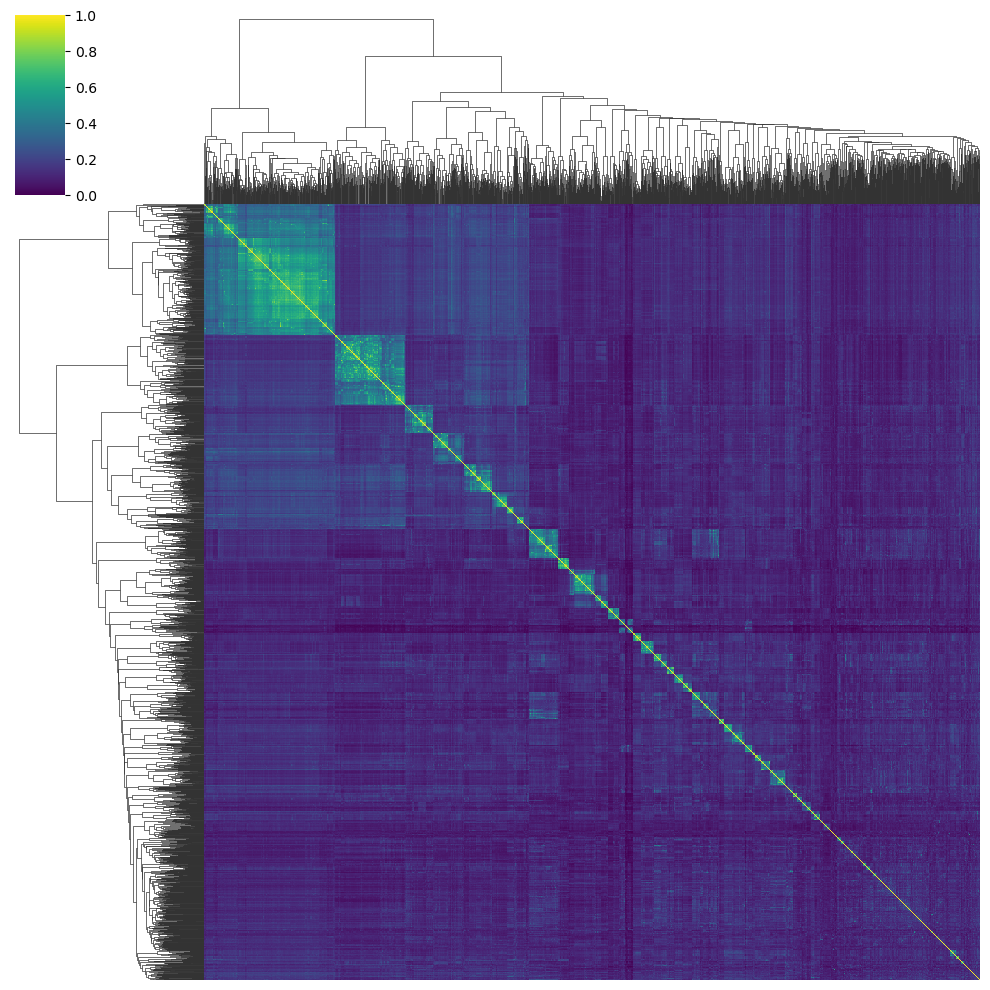

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
import os

# ==========================
# Output directory
# ==========================
output_dir = "/Users/janat/Desktop/ppimic50pred/dataset/data/rdkit/"
os.makedirs(output_dir, exist_ok=True)

# ==========================
# Clustered heatmap for pattern visualization
# ==========================
g = sns.clustermap(
    sim_df,
    cmap="viridis",
    figsize=(10, 10),
    xticklabels=False,
    yticklabels=False
)

# Save the clustered heatmap
heatmap_path = os.path.join(output_dir, "tanimoto_similarity_clustermap.png")
plt.savefig(heatmap_path, dpi=300, bbox_inches="tight")

# Show the clustered heatmap in Jupyter
plt.show()


In [19]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances

# Load tanimoto similarity (already computed)
sim_df = pd.read_csv("/Users/janat/Desktop/ppimic50pred/dataset/newcluster/tanimoto_similarity_matrix.csv", index_col=0)

# Convert similarity to distance
distance_matrix = 1 - sim_df.values

# Run clustering (if not already done)
kmeans = KMeans(n_clusters=5, random_state=42)
cluster_labels = kmeans.fit_predict(distance_matrix)

# Save cluster assignments
sim_df["Cluster"] = cluster_labels

# Compute AD threshold per cluster
cluster_thresholds = {}
for c in np.unique(cluster_labels):
    members = distance_matrix[cluster_labels == c][:, cluster_labels == c]
    max_dist = np.max(members)   # furthest in cluster
    cluster_thresholds[c] = max_dist

print("Cluster-based AD thresholds:", cluster_thresholds)

# Function: Check AD for a new compound
def check_AD(new_distances, kmeans, cluster_thresholds):
    cluster = kmeans.predict([new_distances])[0]
    centroid = kmeans.cluster_centers_[cluster]
    dist_to_centroid = np.linalg.norm(new_distances - centroid)
    if dist_to_centroid <= cluster_thresholds[cluster]:
        return f"In AD (Cluster {cluster})"
    else:
        return f"Outside AD (Cluster {cluster})"



Cluster-based AD thresholds: {0: 0.7830188679245282, 1: 1.0, 2: 0.9480519480519481, 3: 0.7931034482758621, 4: 0.9021739130434783}


Cluster-based AD thresholds:
Cluster 0: 0.487
Cluster 1: 0.117
Cluster 2: 0.205
Cluster 3: 0.461
Cluster 4: 0.343

Cluster membership counts:
Cluster
1    1500
2     519
0     474
3     263
4     170
Name: count, dtype: int64


/var/folders/mz/jys89wms6w340jltvdtnnzhr0000gn/T/ipykernel_19433/3307888638.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(ad_thresholds.keys()), y=list(ad_thresholds.values()), palette="viridis")


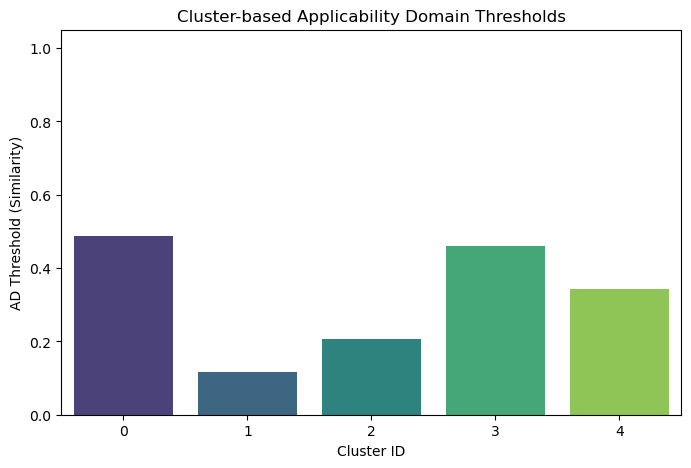

In [23]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

"""
Cluster-based Applicability Domain (AD) Analysis
------------------------------------------------
This script performs:
1. Loading of chemical similarity/distance matrix
2. Clustering (KMeans)
3. Calculation of cluster-specific AD thresholds
4. Visualization of cluster membership and AD thresholds
"""

import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# ==========================
# 1. Load Tanimoto similarity matrix
# ==========================
data_path = "/Users/janat/Desktop/ppimic50pred/dataset/newcluster/tanimoto_similarity_matrix.csv"
sim_df = pd.read_csv(data_path, index_col=0)

# Convert similarity to distance (AD uses distance domain)
distance_matrix = 1 - sim_df.values

# ==========================
# 2. KMeans clustering
# ==========================
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(distance_matrix)

# Assign clusters to dataframe
cluster_df = pd.DataFrame({
    "Molecule": sim_df.index,
    "Cluster": cluster_labels
})

# ==========================
# 3. Applicability Domain Threshold per Cluster
# ==========================
ad_thresholds = {}

for cluster_id in np.unique(cluster_labels):
    members = np.where(cluster_labels == cluster_id)[0]
    if len(members) > 1:
        # Intra-cluster pairwise distances
        sub_dist = distance_matrix[np.ix_(members, members)]
        upper_tri = sub_dist[np.triu_indices_from(sub_dist, k=1)]
        mean_dist = np.mean(upper_tri)
        threshold = 1 - mean_dist   # convert back to similarity-based threshold
    else:
        threshold = 1.0  # singletons get max threshold

    ad_thresholds[cluster_id] = threshold

# ==========================
# 4. Results
# ==========================
print("Cluster-based AD thresholds:")
for cid, thr in ad_thresholds.items():
    print(f"Cluster {cid}: {thr:.3f}")

print("\nCluster membership counts:")
print(cluster_df["Cluster"].value_counts())

# ==========================
# 5. Visualization
# ==========================
plt.figure(figsize=(8, 5))
sns.barplot(x=list(ad_thresholds.keys()), y=list(ad_thresholds.values()), palette="viridis")
plt.xlabel("Cluster ID")
plt.ylabel("AD Threshold (Similarity)")
plt.title("Cluster-based Applicability Domain Thresholds")
plt.ylim(0, 1.05)
plt.show()


/opt/anaconda3/lib/python3.12/site-packages/sklearn/manifold/_mds.py:677: FutureWarning: The default value of `n_init` will change from 4 to 1 in 1.9.
  warnings.warn(


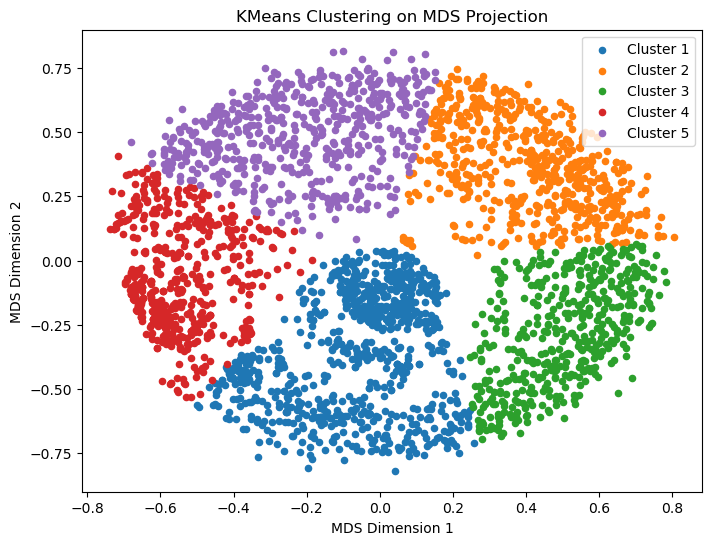

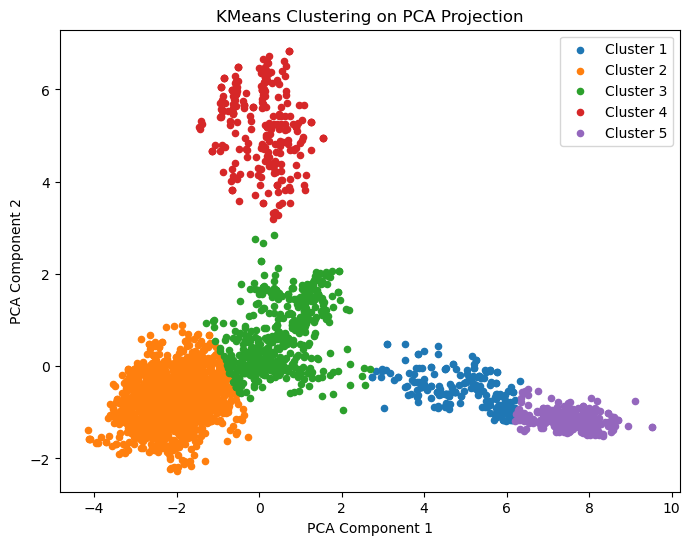

Cluster-based AD thresholds:
{0: 0.2686789125581363, 1: 0.14988830783559642, 2: 0.12324393535379366, 3: 0.24303020740432466, 4: 0.12278710052903787}

AD Status distribution:
AD_Status
Inside AD     1559
Outside AD    1367
Name: count, dtype: int64


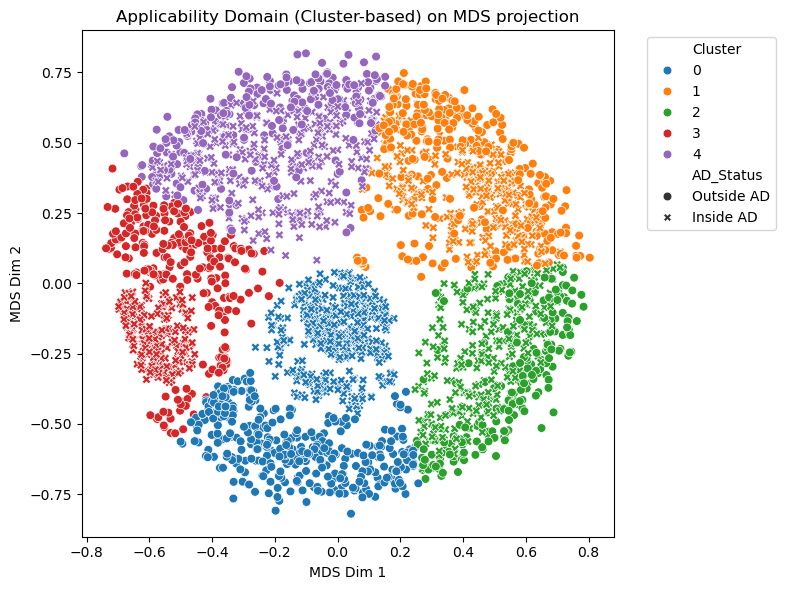

In [27]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.manifold import MDS
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# ==========================
# 1. Load Tanimoto similarity matrix
# ==========================
sim_df = pd.read_csv(
    "/Users/janat/Desktop/ppimic50pred/dataset/newcluster/tanimoto_similarity_matrix.csv",
    index_col=0
)

# Ensure both index and columns are the same type (integers)
sim_df.index = sim_df.index.astype(int)
sim_df.columns = sim_df.columns.astype(int)

# ==========================
# 2. Convert similarity to distance
# ==========================
distance_matrix = 1 - sim_df.values  # Tanimoto distance

# ==========================
# 3a. Dimensionality reduction using MDS
# ==========================
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
coords_mds = mds.fit_transform(distance_matrix)

# ==========================
# 3b. Dimensionality reduction using PCA
# ==========================
pca = PCA(n_components=2, random_state=42)
coords_pca = pca.fit_transform(sim_df.values)

# ==========================
# 4. KMeans clustering on MDS coordinates
# ==========================
n_clusters = 5
kmeans_mds = KMeans(n_clusters=n_clusters, random_state=42)
labels_mds = kmeans_mds.fit_predict(coords_mds)

# ==========================
# 5. KMeans clustering on PCA coordinates
# ==========================
kmeans_pca = KMeans(n_clusters=n_clusters, random_state=42)
labels_pca = kmeans_pca.fit_predict(coords_pca)

# ==========================
# 6. Plot MDS clusters
# ==========================
plt.figure(figsize=(8, 6))
for i in range(n_clusters):
    plt.scatter(coords_mds[labels_mds == i, 0], coords_mds[labels_mds == i, 1], label=f"Cluster {i+1}", s=20)
plt.title("KMeans Clustering on MDS Projection")
plt.xlabel("MDS Dimension 1")
plt.ylabel("MDS Dimension 2")
plt.legend()
plt.show()

# ==========================
# 7. Plot PCA clusters
# ==========================
plt.figure(figsize=(8, 6))
for i in range(n_clusters):
    plt.scatter(coords_pca[labels_pca == i, 0], coords_pca[labels_pca == i, 1], label=f"Cluster {i+1}", s=20)
plt.title("KMeans Clustering on PCA Projection")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend()
plt.show()

# ==========================
# 8. Define Applicability Domain (AD)
# ==========================
cluster_df = pd.DataFrame({
    "Cluster": labels_mds
}, index=sim_df.index)

cluster_thresholds = {}
for cluster in range(n_clusters):
    members = cluster_df[cluster_df["Cluster"] == cluster].index
    
    # make sure we have overlap in rows/columns
    members = [m for m in members if m in sim_df.index and m in sim_df.columns]
    
    if len(members) > 1:
        sub_sim = sim_df.loc[members, members].astype(float).values
        np.fill_diagonal(sub_sim, np.nan)
        cluster_thresholds[cluster] = np.nanmean(sub_sim)
    else:
        cluster_thresholds[cluster] = 0.0  # singleton cluster

print("Cluster-based AD thresholds:")
print(cluster_thresholds)

# ==========================
# 9. Classify compounds inside/outside AD
# ==========================
AD_status = []
for idx, row in cluster_df.iterrows():
    cluster = row["Cluster"]
    members = cluster_df[cluster_df["Cluster"] == cluster].index
    sims = sim_df.loc[idx, members].astype(float).values
    sims = sims[sims < 1.0]  # drop self-sim
    mean_sim = sims.mean() if sims.size > 0 else 0
    
    if mean_sim >= cluster_thresholds[cluster]:
        AD_status.append("Inside AD")
    else:
        AD_status.append("Outside AD")

cluster_df["AD_Status"] = AD_status

print("\nAD Status distribution:")
print(cluster_df["AD_Status"].value_counts())

# ==========================
# 10. Visualize AD in MDS space
# ==========================
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=coords_mds[:, 0], y=coords_mds[:, 1],
    hue=cluster_df["Cluster"], style=cluster_df["AD_Status"],
    palette="tab10", s=40
)
plt.title("Applicability Domain (Cluster-based) on MDS projection")
plt.xlabel("MDS Dim 1")
plt.ylabel("MDS Dim 2")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


In [29]:
#Butina clustering

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from rdkit import Chem
from rdkit.Chem import rdMolDescriptors, DataStructs
from rdkit.ML.Cluster import Butina

# ==========================
# CONFIGURATION
# ==========================
sdf_file = "/Users/janat/Desktop/ppimic50pred/dataset/PubChem_compound_id_list_records.sdf"
output_dir = "/Users/janat/Desktop/ppimic50pred/dataset/Butina"
os.makedirs(output_dir, exist_ok=True)

# ==========================
# STEP 1: Load molecules
# ==========================
supplier = Chem.SDMolSupplier(sdf_file)
molecules = [mol for mol in supplier if mol is not None]
print(f"Loaded {len(molecules)} molecules")

# ==========================
# STEP 2: Generate Morgan fingerprints
# ==========================
radius = 2
nBits = 2048
fingerprints = [rdMolDescriptors.GetMorganFingerprintAsBitVect(mol, radius, nBits=nBits)
                for mol in molecules]

# ==========================
# STEP 3: Compute Tanimoto similarity matrix
# ==========================
n = len(fingerprints)
sim_matrix = np.zeros((n, n))
for i in range(n):
    sims = DataStructs.BulkTanimotoSimilarity(fingerprints[i], fingerprints[i+1:])
    sim_matrix[i, i+1:] = sims
    sim_matrix[i+1:, i] = sims

# ==========================
# STEP 4: Convert to distance matrix
# ==========================
dist_matrix = 1.0 - sim_matrix

# ==========================
# STEP 5: Histogram of Tanimoto similarity
# ==========================
plt.figure(figsize=(8,6))
plt.hist(sim_matrix[np.triu_indices(n, k=1)], bins=50, color="skyblue", edgecolor="black")
plt.xlabel("Tanimoto Similarity")
plt.ylabel("Frequency")
plt.title("Distribution of Pairwise Tanimoto Similarities")
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "tanimoto_similarity_distribution.png"), dpi=300)
plt.close()
print(f"Saved Tanimoto similarity distribution plot → {output_dir}/tanimoto_similarity_distribution.png")

# ==========================
# STEP 6: Clustering with Butina
# ==========================
# Flatten upper-triangle of distance matrix for Butina
dists = [dist_matrix[i,j] for i in range(1, n) for j in range(i)]
clusters = Butina.ClusterData(dists, nPts=n, distThresh=0.3, isDistData=True)
print(f"Number of clusters formed: {len(clusters)}")

# ==========================
# STEP 7: Cluster size plot
# ==========================
cluster_sizes = [len(c) for c in clusters]
plt.figure(figsize=(8,6))
plt.hist(cluster_sizes, bins=30, color="salmon", edgecolor="black")
plt.xlabel("Cluster Size")
plt.ylabel("Frequency")
plt.title("Distribution of Cluster Sizes")
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "cluster_size_distribution.png"), dpi=300)
plt.close()
print(f"Saved cluster size distribution plot → {output_dir}/cluster_size_distribution.png")

# ==========================
# STEP 8: Save cluster assignments
# ==========================
cluster_assignments = {}
for cluster_id, members in enumerate(clusters):
    for m in members:
        cluster_assignments[m] = cluster_id

df_clusters = pd.DataFrame({
    "Molecule_ID": range(len(molecules)),
    "Cluster_ID": [cluster_assignments[i] for i in range(len(molecules))]
})
df_clusters.to_csv(os.path.join(output_dir, "cluster_assignments.csv"), index=False)
print(f"Saved cluster assignments CSV → {output_dir}/cluster_assignments.csv")


Loaded 2926 molecules


[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerator
[16:39:56] DEPRECATION WARNING: please use MorganGenerat

Saved Tanimoto similarity distribution plot → /Users/janat/Desktop/ppimic50pred/dataset/Butina/tanimoto_similarity_distribution.png
Number of clusters formed: 1124
Saved cluster size distribution plot → /Users/janat/Desktop/ppimic50pred/dataset/Butina/cluster_size_distribution.png
Saved cluster assignments CSV → /Users/janat/Desktop/ppimic50pred/dataset/Butina/cluster_assignments.csv


In [ ]:
# === Store training metrics for all ===
train_hist = {metric: {m: [] for m in models} for metric in metrics}
val_hist = {metric: {m: [] for m in models} for metric in metrics}

# Update histories while computing scores
# Modify inside the loop above after predictions:
# Example for Random Forest / GBM / SVM:
#   train_hist['R²'][name].append(r2_train)
#   val_hist['R²'][name].append(r2_val)
#   train_hist['RMSE'][name].append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
#   val_hist['RMSE'][name].append(np.sqrt(mean_squared_error(y_test, y_val_pred)))
#   train_hist['MSE'][name].append(mean_squared_error(y_train, y_train_pred))
#   val_hist['MSE'][name].append(mean_squared_error(y_test, y_val_pred))
#   train_hist['MedAPE'][name].append(medape(y_train, y_train_pred))
#   val_hist['MedAPE'][name].append(medape(y_test, y_val_pred))
#   train_hist['SMAPE'][name].append(smape(np.expm1(y_train), np.expm1(y_train_pred)))
#   val_hist['SMAPE'][name].append(smape(np.expm1(y_test), np.expm1(y_val_pred)))

# === Plot Overfitting / Underfitting Detection for ALL Metrics ===
for metric in metrics:
    plt.figure(figsize=(10, 6))
    colors = sns.color_palette("Set2", n_colors=len(models))

    for i, model in enumerate(models):
        color = colors[i]
        plt.plot(train_hist[metric][model], linestyle='--', marker='o',
                 color=color, label=f"{model} - Train")
        plt.plot(val_hist[metric][model], linestyle='-', marker='s',
                 color=color, label=f"{model} - Val")

    plt.xlabel("Fold")
    plt.ylabel(metric)
    plt.title(f"Overfitting / Underfitting Detection ({metric})")
    plt.grid(True)
    plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
    plt.tight_layout()
    plt.show()

# === Summary Barplots (Avg Validation Performance) ===
for metric in metrics:
    avg_val = {m: np.mean(val_hist[metric][m]) for m in models}
    best_model = min(avg_val, key=avg_val.get) if metric in ["RMSE", "MSE", "MedAPE", "SMAPE"] else max(avg_val, key=avg_val.get)

    plt.figure(figsize=(8, 5))
    sns.barplot(x=list(avg_val.keys()), y=list(avg_val.values()), palette='Set2')
    plt.axhline(avg_val[best_model], color='red', linestyle='--', label=f"Best: {best_model}")
    plt.ylabel(f"Avg Validation {metric}")
    plt.title(f"Best Model Comparison ({metric})")
    plt.legend()
    plt.tight_layout()
    plt.show()
